# Problem Statement

### Bank GoodCredit aims to improve its risk assessment system by predicting the creditworthiness of current credit card customers. The bank seeks to develop a machine learning model to classify customers into two categories:

* Good Credit History (0): Customers with a reliable credit history.
* Bad Credit History (1): Customers with a history of credit defaults, defined as falling into the 30 DPD+ (Days Past Due) bucket.

# Import Basic libraries

In [10]:
# Basic libraries
import pandas as pd
import numpy as np

# Visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns

# Suppress warnings
import warnings
warnings.filterwarnings('ignore')

# Load the Dataset

In [11]:
import mysql.connector

# Database connection
db_connection = mysql.connector.connect(
    host="18.136.157.135",
    user="dm_team1",
    password="DM!$Team&279@20!",
    database="project_banking"
)

# Loading tables into DataFrames
cust_account = pd.read_sql("SELECT * FROM Cust_Account", db_connection)
cust_enquiry = pd.read_sql("SELECT * FROM Cust_Enquiry", db_connection)
cust_demographics = pd.read_sql("SELECT * FROM Cust_Demographics", db_connection)

# Closing the connection
db_connection.close()

In [12]:
cust_account

,dt_opened,customer_no,upload_dt,acct_type,owner_indic,opened_dt,last_paymt_dt,closed_dt,reporting_dt,high_credit_amt,cur_balance_amt,amt_past_due,paymenthistory1,paymenthistory2,paymt_str_dt,paymt_end_dt,creditlimit,cashlimit,rateofinterest,paymentfrequency,actualpaymentamount
0,10-Nov-15,12265,20-Oct-15,6,1,09-Jun-13,30-Jun-14,05-Jul-14,30-Sep-15,20900,0,,"""""""STDSTDSTDXXXXXXXXXXXXXXXSTDXXXXXXXXXXXXXXXS...",,01-Sep-15,01-Jul-14,,,,,
1,10-Nov-15,12265,20-Oct-15,10,1,25-May-12,06-Sep-15,,03-Oct-15,16201,10390,,"""""""0000000000000000000000000000000000000000000...","""""""000000000000000000000000000XXX0000000000000...",01-Oct-15,01-Nov-12,14000,1400,,3,5603
2,10-Nov-15,12265,20-Oct-15,10,1,22-Mar-12,31-Aug-15,,30-Sep-15,41028,34420,,"""""""0000000000000000000000000000000000000000000...","""""""0000000000000000000000000000000000000000000...",01-Sep-15,01-Oct-12,,,,,
3,20-Jul-15,15606,09-Jul-15,10,1,13-Jan-06,,26-Jul-07,31-Jan-09,93473,0,,"""""""1200900600600600300000000000000000000000000...",,01-Jul-07,01-Feb-06,,,,,
4,20-Jul-15,15606,09-Jul-15,6,1,18-Jan-15,05-May-15,,31-May-15,20250,13500,,"""""""000000000000000""""""",,01-May-15,01-Jan-15,,,,,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
186324,11-Jun-15,1611,25-May-15,10,1,02-May-07,21-Apr-15,,30-Apr-15,24228,24228,,"""""""0000000000000000000000000000000000000000000...","""""""0000000000000000000000000000000000000000000...",01-Apr-15,01-May-12,,,,,
186325,11-Jun-15,1611,25-May-15,10,1,11-Apr-07,22-Jun-09,02-Apr-10,30-Apr-15,19584,0,,"""""""000179146119089058029000XXX""""""",,01-Apr-10,01-Aug-09,,,,3,
186326,11-Jun-15,1611,25-May-15,10,1,20-Nov-06,,12-Apr-12,31-Dec-13,50844,0,,"""""""000XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX...",,01-Apr-12,01-Dec-10,,,,3,
186327,11-Jun-15,1611,25-May-15,10,1,17-Oct-06,,07-Mar-12,15-Apr-15,35587,0,,"""""""000010000000000000000000000000000XXXXXXXXXX...","""""""XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX...",01-Mar-12,01-Apr-09,15000,6000,,3,


In [13]:
cust_demographics

,dt_opened,customer_no,entry_time,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_77,feature_78,feature_79,Bad_label
0,18-Apr-15,1,13-Apr-15,Insignia,13-Apr-15,650,2,Card Setup,14,500000,,,,Y,IS1,,0,159,4284,4284,,1,ADFPNXXXXX,03-Sep-65,98332XXXXX,N,@REDIFFMAIL.COM,1,2,,Mumbai / Navi Mumbai / Thane,400610,1965,0,Self,Y,2,90000,,,,0,0,0,0,Mumbai,400059,@CODOGNOTTO.NET,PAN Card,ADFPNXXXXX,The Ratnakar Bank Ltd.,,Y,State Bank of India,0,01-Jun-13,17-Jun-16,1,21,,Y,Y,N,,Y,1965-0,21,15,400610,0,2,90000,Nov-00,21,R,,,0000-00-00,0,98332XXXXX,1,N,0
1,21-Apr-15,2,21-Apr-15,Insignia,21-Apr-15,760,1,Card Setup,14,1200000,,,,Y,IS1,,0,91,B001,4077,,1,AJWPRXXXXX,14-Jul-62,99455XXXXX,N,@GMAIL.COM,1,2,,Bengaluru,560042,1969,0,Self,Y,2,1,,,,0,0,0,0,Bangalore,560042,,PAN Card,AJWPRXXXXX,The Ratnakar Bank Ltd.,,N,,0,,17-Jun-16,1,17,,Y,Y,N,,Y,1969-0,17,12,560042,0,2,1,Nov-00,17,R,,,0000-00-00,0,99455XXXXX,1,N,0
2,22-Apr-15,3,21-Apr-15,Insignia,21-Apr-15,774,1,Card Setup,14,700000,,,,Y,IS1,,0,91,B001,4077,,2,AFAPNXXXXX,10-Apr-66,98456XXXXX,N,@SHOBANARAYAN.COM,1,0,,Bengaluru,560042,1966,0,Self,Y,2,1,,,,0,0,0,0,Bangalore,560042,,PAN Card,AFAPNXXXXX,,,N,,0,,17-Jun-16,3,17,,N,Y,N,,Y,1966-0,17,12,560042,0,2,1,Nov-00,17,R,,,0000-00-00,0,98456XXXXX,1,N,0
3,25-Apr-15,4,15-Apr-15,Insignia,20-Apr-15,770,1,Card Setup,14,500000,,,,Y,IS1,,0,157,5107,5107,,1,AAAPDXXXXX,16-Apr-64,98220XXXXX,N,@VSNL.COM,1,3,,Pune,411001,1988,0,Self,Y,2,100000,,,,0,0,0,0,Pune,411026,@ALBAJ.COM,PAN Card,AAAPDXXXXX,The Ratnakar Bank Ltd.,,Y,HDFC Bank,0,,17-Jun-16,1,21,,Y,Y,N,,Y,1988-0,21,16,411001,0,2,100000,Nov-00,21,R,,,6/15/65,1,98220XXXXX,1,N,0
4,06-May-15,5,30-Apr-15,Insignia,,,3,Card Setup,14,500000,,,,Y,IS1,,0,100,D016,4564,,1,ABEPSXXXXX,03-Jan-54,98111XXXXX,N,@REDIFFMAIL.COM,1,3,,Gurgaon,122009,1995,0,Self,Y,2,300000,,,,0,0,0,0,Gurgaon,122009,,PAN Card,ABEPSXXXXX,The Ratnakar Bank Ltd.,,N,,0,,17-Jun-16,1,13,,Y,Y,N,,Y,1995-0,13,3,122009,0,2,300000,Nov-00,13,R,,,0000-00-00,0,98111XXXXX,1,N,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23891,31-Dec-15,23892,10-Dec-15,Platinum Deligh,10-Dec-15,704,1,Card Setup,14,119000,,,,Y,PD1,PD3,12,SA05,MA01,,,1,CUQPSXXXXX,12-Oct-88,98715XXXXX,N,@YAHOO.COM,2,0,Graduate,New Delhi,110045,1988,10,Paren,Y,1,33000,Private Ltd. Co.,Others,SERVICE ASSOCIATE,2015,6,0,6,Gurgaon,122001,,PAN Card,CUQPSXXXXX,,,Y,State Bank of India,99000,01-Jan-15,17-Jun-16,1,10,Y,N,Y,N,,Y,1988-10,10,157,110045,0,1,33000,0-0,13,R,Y,,0000-00-00,0,XXXXX,1,N,0
23892,17-Dec-15,23893,16-Nov-15,Platinum Deligh,,,2,Card Setup,14,35000,,,,Y,PD1,PD3,12,SA03,AS33,,,1,DTPPSXXXXX,01-Feb-87,99101XXXXX,N,@GMAIL.COM,2,0,Graduate,New Delhi,110037,2014,12,Rente,N,1,1,Private Ltd. Co.,Others,ENGINEER,2012,12,3,0,New Delhi,110037,@GMAIL.COM,PAN Card,DTPPSXXXXX,,,N,,0,,17-Jun-16,1,10,N,N,Y,N,,Y,2014-12,33,102,282001,1,1,1,0-0,10,O,Y,,0000-00-00,0,99101XXXXX,1,N,0
23893,04-Nov-15,23894,24-Sep-15,Platinum Maxima,24-Sep-15,748,3,Card 

In [14]:
cust_enquiry

,dt_opened,customer_no,upload_dt,enquiry_dt,enq_purpose,enq_amt
0,18-Apr-15,1,21-Apr-15,19-Dec-14,2,3500000
1,18-Apr-15,1,21-Apr-15,05-Mar-14,5,500000
2,18-Apr-15,1,21-Apr-15,05-Mar-14,0,50000
3,18-Apr-15,1,21-Apr-15,22-Feb-14,10,50000
4,18-Apr-15,1,21-Apr-15,11-Jun-13,10,1000
...,...,...,...,...,...,...
413183,04-Dec-15,23896,09-Nov-15,22-Oct-11,5,200000
413184,04-Dec-15,23896,09-Nov-15,06-Jan-11,10,50000
413185,04-Dec-15,23896,09-Nov-15,01-Apr-10,10,50000
413186,04-Dec-15,23896,09-Nov-15,21-Feb-10,1,330000


# 1] cust_account

# Basic checks

In [7]:
cust_account.columns

Index(['dt_opened', 'customer_no', 'upload_dt', 'acct_type', 'owner_indic',
       'opened_dt', 'last_paymt_dt', 'closed_dt', 'reporting_dt',
       'high_credit_amt', 'cur_balance_amt', 'amt_past_due', 'paymenthistory1',
       'paymenthistory2', 'paymt_str_dt', 'paymt_end_dt', 'creditlimit',
       'cashlimit', 'rateofinterest', 'paymentfrequency',
       'actualpaymentamount'],
      dtype='object')

In [8]:
cust_account.head()

,dt_opened,customer_no,upload_dt,acct_type,owner_indic,opened_dt,last_paymt_dt,closed_dt,reporting_dt,high_credit_amt,...,amt_past_due,paymenthistory1,paymenthistory2,paymt_str_dt,paymt_end_dt,creditlimit,cashlimit,rateofinterest,paymentfrequency,actualpaymentamount
0,10-Nov-15,12265,20-Oct-15,6,1,09-Jun-13,30-Jun-14,05-Jul-14,30-Sep-15,20900,...,,"""""""STDSTDSTDXXXXXXXXXXXXXXXSTDXXXXXXXXXXXXXXXS...",,01-Sep-15,01-Jul-14,,,,,
1,10-Nov-15,12265,20-Oct-15,10,1,25-May-12,06-Sep-15,,03-Oct-15,16201,...,,"""""""0000000000000000000000000000000000000000000...","""""""000000000000000000000000000XXX0000000000000...",01-Oct-15,01-Nov-12,14000,1400,,3,5603
2,10-Nov-15,12265,20-Oct-15,10,1,22-Mar-12,31-Aug-15,,30-Sep-15,41028,...,,"""""""0000000000000000000000000000000000000000000...","""""""0000000000000000000000000000000000000000000...",01-Sep-15,01-Oct-12,,,,,
3,20-Jul-15,15606,09-Jul-15,10,1,13-Jan-06,,26-Jul-07,31-Jan-09,93473,...,,"""""""1200900600600600300000000000000000000000000...",,01-Jul-07,01-Feb-06,,,,,
4,20-Jul-15,15606,09-Jul-15,6,1,18-Jan-15,05-May-15,,31-May-15,20250,...,,"""""""000000000000000""""""",,01-May-15,01-Jan-15,,,,,


In [9]:
cust_account.tail()

,dt_opened,customer_no,upload_dt,acct_type,owner_indic,opened_dt,last_paymt_dt,closed_dt,reporting_dt,high_credit_amt,...,amt_past_due,paymenthistory1,paymenthistory2,paymt_str_dt,paymt_end_dt,creditlimit,cashlimit,rateofinterest,paymentfrequency,actualpaymentamount
186324,11-Jun-15,1611,25-May-15,10,1,02-May-07,21-Apr-15,,30-Apr-15,24228,...,,"""""""0000000000000000000000000000000000000000000...","""""""0000000000000000000000000000000000000000000...",01-Apr-15,01-May-12,,,,,
186325,11-Jun-15,1611,25-May-15,10,1,11-Apr-07,22-Jun-09,02-Apr-10,30-Apr-15,19584,...,,"""""""000179146119089058029000XXX""""""",,01-Apr-10,01-Aug-09,,,,3,
186326,11-Jun-15,1611,25-May-15,10,1,20-Nov-06,,12-Apr-12,31-Dec-13,50844,...,,"""""""000XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX...",,01-Apr-12,01-Dec-10,,,,3,
186327,11-Jun-15,1611,25-May-15,10,1,17-Oct-06,,07-Mar-12,15-Apr-15,35587,...,,"""""""000010000000000000000000000000000XXXXXXXXXX...","""""""XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX...",01-Mar-12,01-Apr-09,15000,6000,,3,
186328,11-Jun-15,1611,25-May-15,6,1,29-Nov-05,,31-Dec-08,11-Jun-10,26000,...,,"""""""000000000000000000000000000XXXXXXXXXXXXXXX0...",,01-Dec-08,01-Oct-07,,,,,


In [10]:
cust_account.shape

(186329, 21)

In [11]:
cust_account.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 186329 entries, 0 to 186328
Data columns (total 21 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   dt_opened            186329 non-null  object
 1   customer_no          186329 non-null  object
 2   upload_dt            186329 non-null  object
 3   acct_type            186329 non-null  object
 4   owner_indic          186329 non-null  object
 5   opened_dt            186329 non-null  object
 6   last_paymt_dt        186329 non-null  object
 7   closed_dt            186329 non-null  object
 8   reporting_dt         186329 non-null  object
 9   high_credit_amt      186329 non-null  object
 10  cur_balance_amt      186329 non-null  object
 11  amt_past_due         186329 non-null  object
 12  paymenthistory1      186329 non-null  object
 13  paymenthistory2      186329 non-null  object
 14  paymt_str_dt         186329 non-null  object
 15  paymt_end_dt         186329 non-nu

In [4]:
pd.set_option('display.max_columns', None)

In [9]:
# Check unique values in categorical columns
cust_account['acct_type'].value_counts()

acct_type
10    100239
6      25664
5      22921
1       9427
13      8569
2       5639
7       4256
0       3944
12      1196
32       744
51       732
3        672
15       519
17       453
8        407
53       386
4        188
52        97
54        73
35        54
9         53
31        27
59        22
55        17
56         8
34         5
33         5
14         5
11         4
16         2
57         1
Name: count, dtype: int64

In [11]:
cust_account['owner_indic'].value_counts()

owner_indic
1    177287
4      6253
2      1581
3      1208
Name: count, dtype: int64

In [12]:
cust_account.head()

,dt_opened,customer_no,upload_dt,acct_type,owner_indic,opened_dt,last_paymt_dt,closed_dt,reporting_dt,high_credit_amt,cur_balance_amt,amt_past_due,paymenthistory1,paymenthistory2,paymt_str_dt,paymt_end_dt,creditlimit,cashlimit,rateofinterest,paymentfrequency,actualpaymentamount
0,10-Nov-15,12265,20-Oct-15,6,1,09-Jun-13,30-Jun-14,05-Jul-14,30-Sep-15,20900,0,,"""""""STDSTDSTDXXXXXXXXXXXXXXXSTDXXXXXXXXXXXXXXXS...",,01-Sep-15,01-Jul-14,,,,,
1,10-Nov-15,12265,20-Oct-15,10,1,25-May-12,06-Sep-15,,03-Oct-15,16201,10390,,"""""""0000000000000000000000000000000000000000000...","""""""000000000000000000000000000XXX0000000000000...",01-Oct-15,01-Nov-12,14000,1400,,3,5603
2,10-Nov-15,12265,20-Oct-15,10,1,22-Mar-12,31-Aug-15,,30-Sep-15,41028,34420,,"""""""0000000000000000000000000000000000000000000...","""""""0000000000000000000000000000000000000000000...",01-Sep-15,01-Oct-12,,,,,
3,20-Jul-15,15606,09-Jul-15,10,1,13-Jan-06,,26-Jul-07,31-Jan-09,93473,0,,"""""""1200900600600600300000000000000000000000000...",,01-Jul-07,01-Feb-06,,,,,
4,20-Jul-15,15606,09-Jul-15,6,1,18-Jan-15,05-May-15,,31-May-15,20250,13500,,"""""""000000000000000""""""",,01-May-15,01-Jan-15,,,,,


In [10]:
cust_account.dtypes

dt_opened              object
customer_no            object
upload_dt              object
acct_type              object
owner_indic            object
opened_dt              object
last_paymt_dt          object
closed_dt              object
reporting_dt           object
high_credit_amt        object
cur_balance_amt        object
amt_past_due           object
paymenthistory1        object
paymenthistory2        object
paymt_str_dt           object
paymt_end_dt           object
creditlimit            object
cashlimit              object
rateofinterest         object
paymentfrequency       object
actualpaymentamount    object
dtype: object

In [11]:
cust_account.isnull().sum()

dt_opened              0
customer_no            0
upload_dt              0
acct_type              0
owner_indic            0
opened_dt              0
last_paymt_dt          0
closed_dt              0
reporting_dt           0
high_credit_amt        0
cur_balance_amt        0
amt_past_due           0
paymenthistory1        0
paymenthistory2        0
paymt_str_dt           0
paymt_end_dt           0
creditlimit            0
cashlimit              0
rateofinterest         0
paymentfrequency       0
actualpaymentamount    0
dtype: int64

In [12]:
cust_account.describe()

,dt_opened,customer_no,upload_dt,acct_type,owner_indic,opened_dt,last_paymt_dt,closed_dt,reporting_dt,high_credit_amt,cur_balance_amt,amt_past_due,paymenthistory1,paymenthistory2,paymt_str_dt,paymt_end_dt,creditlimit,cashlimit,rateofinterest,paymentfrequency,actualpaymentamount
count,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329
unique,197,23896,75,31,4,6246,4511,4840,1877,67555,56425,630,18311,11912,234,235,1380,1456,1476,3,18300
top,16-Nov-15,8516,21-Apr-15,10,1,13-Apr-12,,,31-Jul-15,,0,,"""""""0000000000000000000000000000000000000000000...",,01-Jul-15,01-Jan-15,,,,,
freq,4643,120,5128,100239,177287,514,25487,109075,12654,8875,89872,185453,44979,107824,16747,5640,137477,151047,161496,122436,145276


### 1. **Account Opening Date (dt_opened):**
   - **Count**: 186,329 records.
   - **Most common date (top)**: 16-Nov-15, with 4,643 occurrences.
   - **Spread**: There is a high frequency of account openings around specific dates, which may suggest seasonality or promotional periods for account creation.
   
### 2. **Customer Information (customer_no):**
   - **Count**: 186,329 records.
   - **Unique customers**: 23,896.
   - **Most frequent customer ID (top)**: 8516, with 120 occurrences.
   - **Insight**: The dataset includes transactions from a large pool of customers. Some customers appear more frequently than others, which may suggest high-value or high-activity customers.
   
### 3. **Account Type (acct_type):**
   - **Count**: 186,329 records.
   - **Unique account types**: 31 types.
   - **Most common account type (top)**: Type 10, which has the highest frequency at 100,239 occurrences.
   - **Insight**: A dominant `account type` suggests that it may be the most frequently used type in the dataset, and could represent the core service offering.
   
### 4. **Owner Indicator (owner_indic):**
   - **Count**: 186,329 records.
   - **Unique values**: 4 types.
   - **Most common value (top)**: 1, with 177,287 occurrences.
   - **Insight**: The vast majority of accounts are associated with a specific `owner indicator`, possibly indicating a single ownership type or status.
   
### 5. **Account Opening Date (opened_dt):**
   - **Most frequent date**: 13-Apr-12, which could represent a specific promotional period or a popular opening date.
   - **Insight**: High occurrence of accounts opened on certain dates, suggesting possible marketing or operational trends.

### 6.**Last Payment Date (last_paymt_dt):**
   - **Most frequent date**: 31-Jul-15.
   - **Insight**: Payment trends could be analyzed by identifying the concentration of payments around particular dates.      - **This might help identify key financial periods.**

### 7. **Account Closure Date (closed_dt):**
   - **Most frequent date**: 31-Jul-15.
   - **Insight**: There may be seasonal or operational trends related to account closures, particularly with a higher            concentration around a specific time of year.

### 8. **Reporting Date (reporting_dt):**
   - **Most frequent date**: 01-Jan-15.
   - **Insight**: The reporting date appears to be consistent for many records, suggesting regular reporting or end-of-          period financial close-offs.

### 9. **Credit and Balance Information (high_credit_amt, cur_balance_amt, amt_past_due):**
   - **High Credit Amount**: 67,555 unique values, with large variance.
   - **Current Balance Amount**: 56,425 unique values, indicating diverse customer balances.
   - **Amount Past Due**: 630 unique values, suggesting a spread of overdue payments.
   - **Insight**: There is significant variation in credit amounts and overdue balances, which could provide insights into      the financial health of customers or trends related to credit risk.

### 10. **Payment History (paymenthistory1, paymenthistory2):**
   - **Unique values**: Large number of unique payment histories (18,311 for paymenthistory1, 11,912 for paymenthistory2).
   - **Insight**: Payment history data can be useful for understanding customer behavior, and identifying patterns that correlate with late payments or defaults.

### 11. Payment Start and End Dates (paymt_str_dt, paymt_end_dt):
   - **Most frequent start date (paymt_str_dt)**: 01-Jul-15.
   - **Most frequent end date (paymt_end_dt)**: 01-Jan-15.
   - **Insight**: These dates may indicate a recurring payment schedule and can be useful for analyzing payment cycles and customer commitment.
   
### 12. Credit Limit and Cash Limit (creditlimit, cashlimit):
   - **Unique values**: 1,476 for credit limit and 1,380 for cash limit.
   - **Insight**: These limits could provide information on the credit risk and purchasing power of customers. A comparison between cash limits and credit limits could identify anomalies or insights into customer profiles.
   
### 13. Interest Rate and Payment Frequency (rateofinterest, paymentfrequency):
   - **Unique values**: 1,456 for interest rates and 3 for payment frequency.
   - **Insight**: Different interest rates may correlate with customer segments. The payment frequency data can be used to segment customers based on how often they are expected to make payments.
   
### 14. Actual Payment Amount (actualpaymentamount):
   - **Unique values**: Likely includes both high-frequency and large-range payment amounts.
   - **Insight**: Payment amounts can help in identifying patterns of customer behavior and whether payment amounts align with credit balances or are indicative of customer financial health.
   
### **Overall Insights**:
   - **Customer Segmentation**: There are distinct customer segments based on account types, balances, payment history, and limits. Identifying patterns could help in segmenting customers for targeted marketing, risk assessment, or service offerings.
   - **Payment Trends**: Certain dates show heavy concentration of payments, which might indicate periods of financial stress or scheduled promotions. Identifying trends could help forecast future payment behavior.
   - **Credit Risk and Financial Healt**h: Analyzing overdue balances, payment history, and payment amounts could provide insights into the credit risk of customers.
   - **Marketing Opportunities**: The frequency of specific dates (e.g., account openings) suggests that certain periods may be more profitable or active, indicating possible opportunities for focused campaigns.

In [29]:
cust_account.describe(include='O')

,dt_opened,customer_no,upload_dt,acct_type,owner_indic,opened_dt,last_paymt_dt,closed_dt,reporting_dt,high_credit_amt,cur_balance_amt,amt_past_due,paymenthistory1,paymenthistory2,paymt_str_dt,paymt_end_dt,creditlimit,cashlimit,rateofinterest,paymentfrequency,actualpaymentamount
count,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329
unique,197,23896,75,31,4,6246,4511,4840,1877,67555,56425,630,18311,11912,234,235,1380,1456,1476,3,18300
top,16-Nov-15,8516,21-Apr-15,10,1,13-Apr-12,,,31-Jul-15,,0,,"""""""0000000000000000000000000000000000000000000...",,01-Jul-15,01-Jan-15,,,,,
freq,4643,120,5128,100239,177287,514,25487,109075,12654,8875,89872,185453,44979,107824,16747,5640,137477,151047,161496,122436,145276


### 1. Account Opening Date (dt_opened):
Top Date: 16-Nov-15.
Frequency: This specific date appears 4,643 times, which suggests that account openings peak around this date. It could represent a special event, promotion, or a commonly used opening date for accounts in the dataset.
Insight: The data shows concentration on particular dates, which may help identify patterns or seasonality related to account openings.

### 2. Customer Number (customer_no):
Top Customer Number: 8516, appearing 120 times.
Insight: This suggests that some customers have multiple records in the dataset. High-frequency customer numbers may represent either frequent activity or multiple accounts being associated with the same customer.

### 3. Account Type (acct_type):
Most Common Account Type: Type 10, with 100,239 occurrences.
Insight: The dominant account type (Type 10) could represent the most common or standard account in the system. Understanding why this account type is most frequent may help in segmenting customers or tailoring services.

### 4. Owner Indicator (owner_indic):
Most Frequent Value: 1, with 177,287 occurrences.
Insight: The majority of accounts are likely owned by a single category of owner (indicated by '1'). This may reflect a large percentage of standard customers, or a specific ownership structure.

### 5. Account Opened Date (opened_dt):
Most Common Opened Date: 13-Apr-12.
Insight: A concentration of account openings on specific dates may indicate key business events or promotion periods when many customers open accounts. This trend could be useful for understanding customer behavior and business cycles.

### 6. Last Payment Date (last_paymt_dt):
Most Common Last Payment Date: 31-Jul-15.
Insight: Payment history indicates a concentration around 31-Jul-15, suggesting that many customers made payments around this date. This could be a month-end payment pattern or a deadline for payments.

### 7. Account Closure Date (closed_dt):
Most Common Closure Date: 31-Jul-15.
Insight: Similar to payment dates, a concentration of account closures around a specific date (31-Jul-15) may reflect an operational cycle or end-of-period trend where accounts are closed after the financial reporting.

### 8. Reporting Date (reporting_dt):
Most Common Reporting Date: 01-Jan-15.
Insight: The frequency of 01-Jan-15 as a reporting date might indicate a common year-end reporting period. It could also reflect how data is aggregated or analyzed at the end of each financial year.

### 9. Payment History (paymenthistory1 and paymenthistory2):
paymenthistory1 (Most Frequent): A large variety of unique payment histories (18,311 unique values).
paymenthistory2 (Most Frequent): 11,912 unique values.
Insight: These two variables capture payment behavior. A wide range of values suggests that customers have diverse payment patterns. Analyzing common payment histories can help segment customers based on payment behavior, which is critical for understanding credit risk.

### 10. Payment Start Date (paymt_str_dt):
Most Common Payment Start Date: 01-Jul-15.
Insight: Many customers' payment cycles begin around this date. This could indicate when a billing cycle starts or when a financial quarter or promotional event occurs.

### 11. Payment End Date (paymt_end_dt):
Most Common Payment End Date: 01-Jan-15.
Insight: Similar to the reporting date, the high frequency of a specific payment end date (01-Jan-15) may indicate standard payment schedules or contract periods, providing insights into recurring billing cycles.

### 12. Credit Limit and Cash Limit (creditlimit, cashlimit):
Unique values: 1,476 for credit limit and 1,380 for cash limit.
Insight: The large variety in limits can help identify customer segments with different levels of financial engagement. Comparing credit and cash limits across customers may highlight the disparity in the financial capabilities of various customer groups.

### 13. Interest Rate (rateofinterest):
Unique values: 1,456 for interest rates.
Insight: A wide range of interest rates might indicate different risk profiles for customers or various promotional interest rates. This could help assess which interest rates are more common among certain customer segments and provide insights into profitability or risk.

### 14. Payment Frequency (paymentfrequency):
Most Frequent Frequency: 3 different frequencies.
Insight: The categorization of payment frequency suggests that customers are divided into a few payment cycles. The frequency of payments could indicate customer preferences or the company's payment terms, which is important for cash flow management and forecasting.

### 15. Actual Payment Amount (actualpaymentamount):
Unique values: Likely shows variation in the amount paid by customers.
Insight: This can help analyze the size of payments and how they relate to credit limits, overdue amounts, and financial health.

# Exploratory Data Analysis

# Univariate Analysis

### Convert Date Columns to Datetime Format

In [15]:
date_columns = ['dt_opened', 'upload_dt', 'opened_dt', 'last_paymt_dt', 
                'closed_dt', 'reporting_dt', 'paymt_str_dt', 'paymt_end_dt']

for col in date_columns:
    cust_account[col] = pd.to_datetime(cust_account[col], errors='coerce')

# Check the changes
print(cust_account[date_columns].info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 186329 entries, 0 to 186328
Data columns (total 8 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   dt_opened      186329 non-null  datetime64[ns]
 1   upload_dt      186329 non-null  datetime64[ns]
 2   opened_dt      185874 non-null  datetime64[ns]
 3   last_paymt_dt  160842 non-null  datetime64[ns]
 4   closed_dt      77254 non-null   datetime64[ns]
 5   reporting_dt   186329 non-null  datetime64[ns]
 6   paymt_str_dt   186328 non-null  datetime64[ns]
 7   paymt_end_dt   186328 non-null  datetime64[ns]
dtypes: datetime64[ns](8)
memory usage: 11.4 MB
None


### Analyze Missing Values

In [16]:
missing_dates = cust_account[date_columns].isnull().sum()
print("Missing values in date columns:")
missing_dates

Missing values in date columns:


dt_opened             0
upload_dt             0
opened_dt           455
last_paymt_dt     25487
closed_dt        109075
reporting_dt          0
paymt_str_dt          1
paymt_end_dt          1
dtype: int64

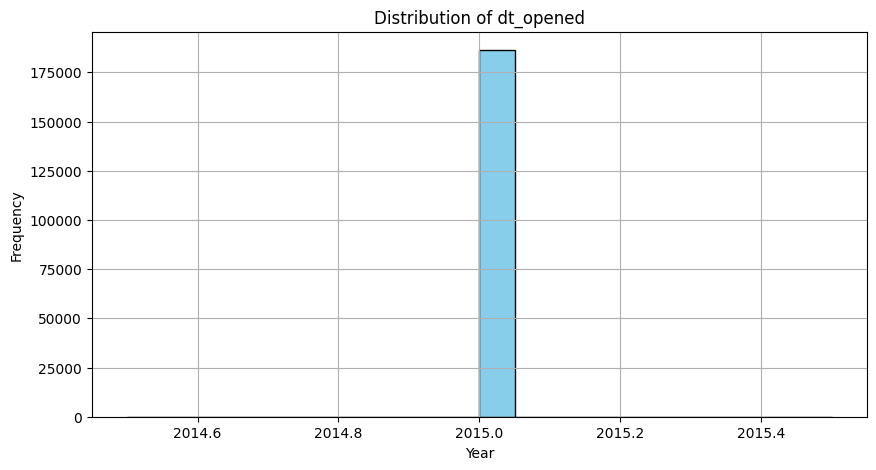

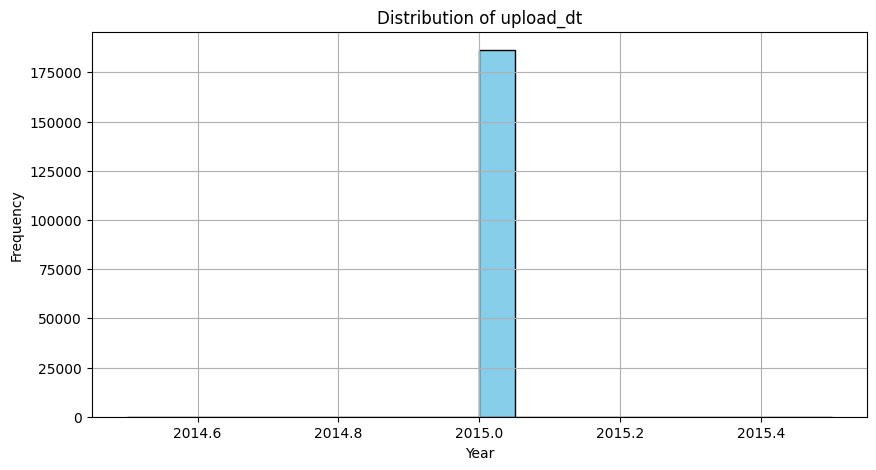

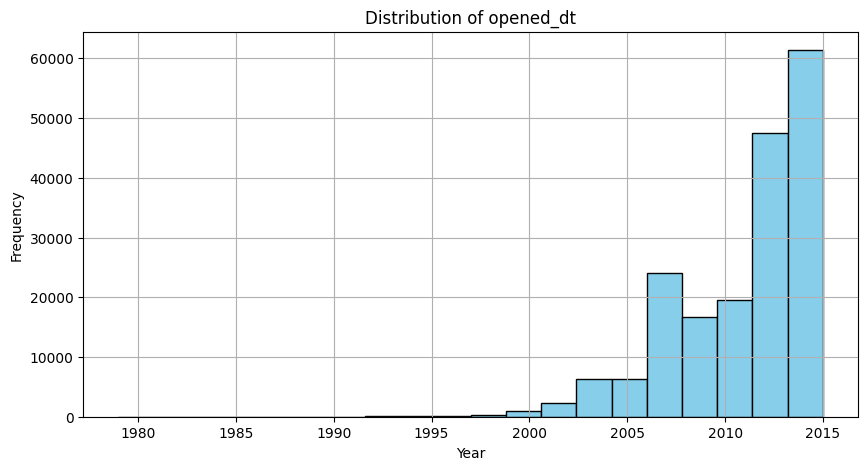

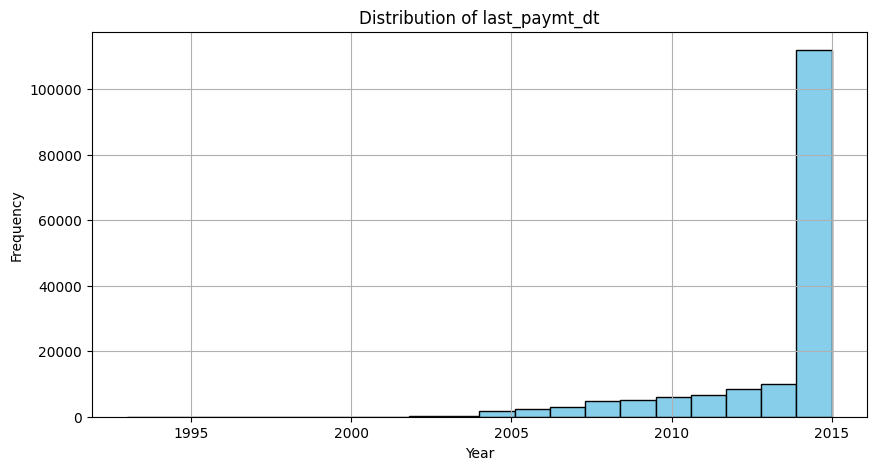

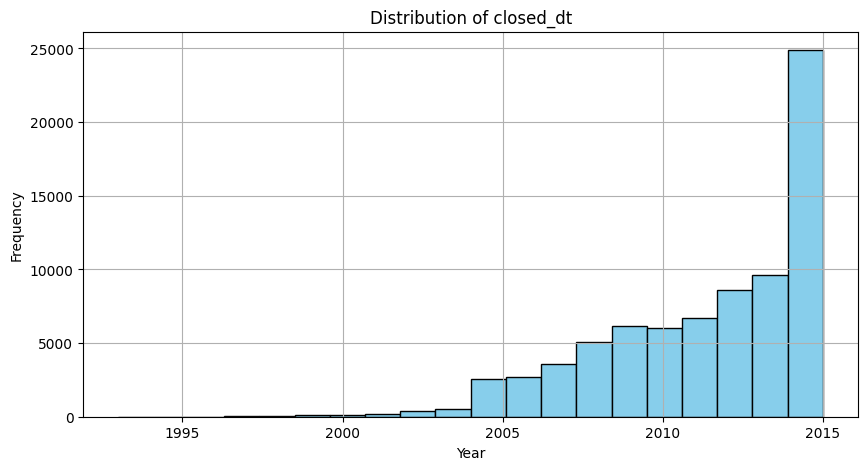

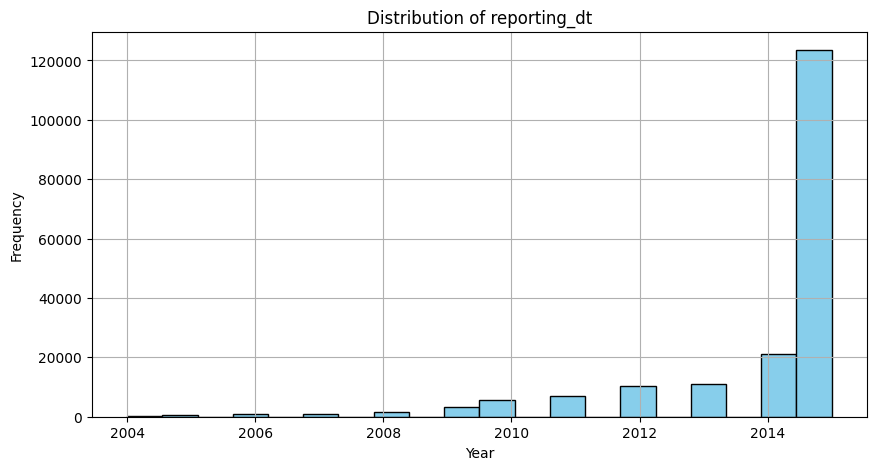

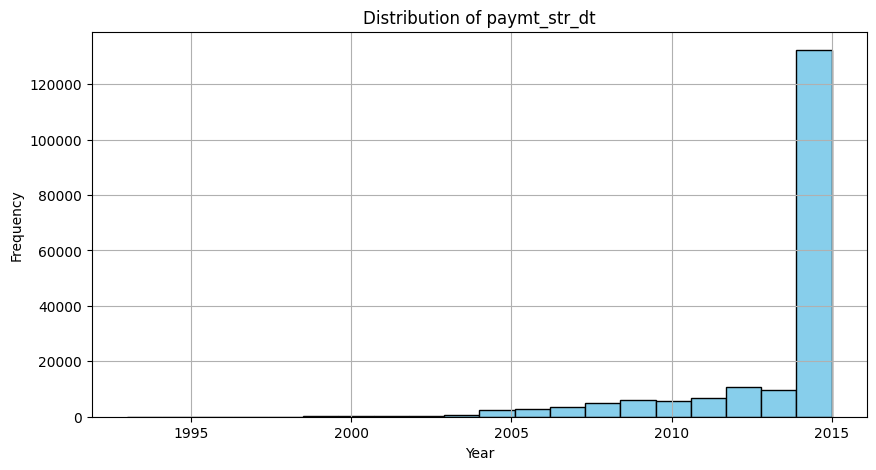

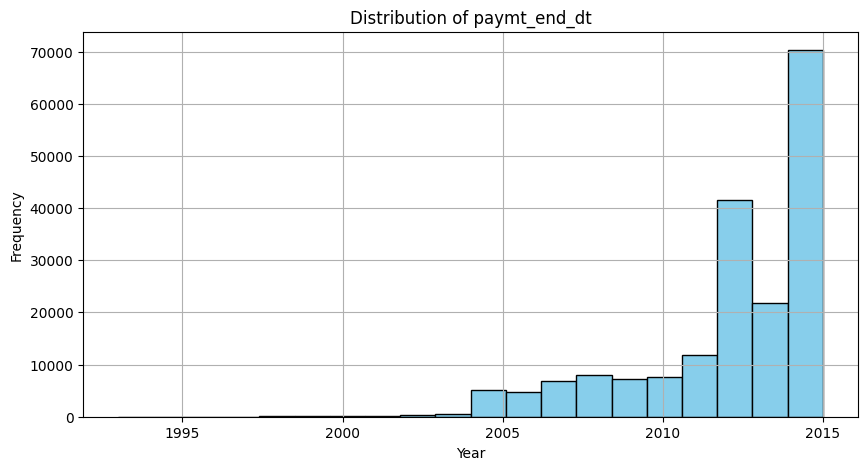

In [17]:
for col in date_columns:
    plt.figure(figsize=(10, 5))
    cust_account[col].dropna().dt.year.hist(bins=20, color='skyblue', edgecolor='black')
    plt.title(f"Distribution of {col}")
    plt.xlabel("Year")
    plt.ylabel("Frequency")
    plt.show()

In [11]:
for col in date_columns:
    print(f"{col}: Min = {cust_account[col].min()}, Max = {cust_account[col].max()}")

dt_opened: Min = 2015-04-16 00:00:00, Max = 2015-12-31 00:00:00
upload_dt: Min = 2015-04-21 00:00:00, Max = 2015-12-31 00:00:00
opened_dt: Min = 1979-10-01 00:00:00, Max = 2015-12-15 00:00:00
last_paymt_dt: Min = 1993-02-20 00:00:00, Max = 2015-12-10 00:00:00
closed_dt: Min = 1993-10-14 00:00:00, Max = 2015-12-11 00:00:00
reporting_dt: Min = 2004-02-14 00:00:00, Max = 2015-12-20 00:00:00
paymt_str_dt: Min = 1993-10-01 00:00:00, Max = 2015-12-01 00:00:00
paymt_end_dt: Min = 1993-02-01 00:00:00, Max = 2015-12-01 00:00:00


### 1. dt_opened (Account Opening Date)
- Insight: The dt_opened column shows the dates when accounts were created. Analyzing this column reveals trends over time, such as spikes in account openings during certain periods. For example, if most accounts were opened in a particular quarter, this could indicate a surge in customer acquisition, likely driven by a marketing campaign, a product launch, or a seasonal promotion. A significant increase in account openings may also highlight periods of economic growth or favorable market conditions.

### 2. upload_dt (Data Upload Date)
- Insight: The upload_dt column reflects when data related to the accounts was uploaded into the system. Patterns in this column can reveal the frequency of data updates and how consistent the data upload process is. For instance, if the upload dates are regularly spaced, it indicates a stable data collection and reporting process. However, any irregularities, such as large gaps between uploads, could signal operational delays, backlogs, or system inefficiencies.

### 3. opened_dt (Date Account Opened)
- Insight: The opened_dt column provides the exact date an account was opened. Analyzing this date can reveal when the accounts were activated, which is crucial for understanding customer engagement and product adoption. If accounts were predominantly opened within a short time frame, it could suggest a product launch or promotional event that encouraged many customers to join. Conversely, a more even distribution of account openings over time may suggest steady and consistent business activity.

### 4. last_paymt_dt (Last Payment Date)
- Insight: The last_paymt_dt column provides the date of the most recent payment made by customers. Examining this date allows us to understand customer payment behavior. If most payments are concentrated around specific times, it could be tied to billing cycles or promotional periods. Large gaps between payments or overdue payments may signal issues such as late fees, non-payment, or account delinquency. Additionally, if payments are consistently made on time, it may indicate good customer financial behavior.

### 5. closed_dt (Account Closure Date)
- Insight: The closed_dt column shows when accounts were closed. By analyzing this column, we can identify any trends or patterns in account closures. If a significant number of accounts were closed within a specific time frame, it could suggest customer churn or dissatisfaction, especially if closures align with external events (e.g., regulatory changes, product issues). Conversely, an extended period of no closures could indicate a stable customer base, but it may also reflect the absence of stringent account closure policies.

### 6. reporting_dt (Reporting Date)
- Insight: The reporting_dt column indicates when reports related to accounts were generated. This column provides insights into the periodicity and frequency of reporting activities. If the reporting dates are concentrated around specific times, it might suggest periodic reporting cycles or quarterly reviews. Disparities in reporting dates across accounts could indicate delays in generating reports or inconsistencies in data reporting practices, which might need to be addressed for operational efficiency.

### 7. paymt_str_dt (Payment Start Date)
- Insight: The paymt_str_dt column reflects the date when payments for an account began. Analyzing this data can highlight when customers started making payments. Peaks in the payment start date could indicate successful onboarding or activation efforts. It might also reflect a seasonal product offering that prompted a surge in customer engagement. If payments start late, it could point to customer hesitation or delays in activation processes, which may require further investigation into customer onboarding practices.

### 8. paymt_end_dt (Payment End Date)
- Insight: The paymt_end_dt column shows the end date for the payment cycle of the account. By analyzing this column, you can identify payment term trends and the average duration of payment cycles. If most accounts have similar payment end dates, this could indicate standardized payment terms (e.g., monthly installments, loan terms). A wide range of end dates might suggest flexibility in payment terms. Additionally, any large gaps or missing paymt_end_dt values could be indicative of accounts with unsettled or non-standard payment schedules.

### Categorical columns

In [18]:
categorical_columns = cust_account.select_dtypes(include=['object']).columns
print("Categorical Columns:")
print(categorical_columns)

Categorical Columns:
Index(['customer_no', 'acct_type', 'owner_indic', 'high_credit_amt',
       'cur_balance_amt', 'amt_past_due', 'paymenthistory1', 'paymenthistory2',
       'creditlimit', 'cashlimit', 'rateofinterest', 'paymentfrequency',
       'actualpaymentamount'],
      dtype='object')


In [13]:
for col in categorical_columns:
    print(f"Value counts for {col}:")
    print(cust_account[col].value_counts())
    print("\n")

Value counts for customer_no:
customer_no
8516     120
10076    112
6391      88
8872      77
8814      76
        ... 
20548      1
21356      1
6941       1
362        1
23434      1
Name: count, Length: 23896, dtype: int64


Value counts for acct_type:
acct_type
10    100239
6      25664
5      22921
1       9427
13      8569
2       5639
7       4256
0       3944
12      1196
32       744
51       732
3        672
15       519
17       453
8        407
53       386
4        188
52        97
54        73
35        54
9         53
31        27
59        22
55        17
56         8
34         5
33         5
14         5
11         4
16         2
57         1
Name: count, dtype: int64


Value counts for owner_indic:
owner_indic
1    177287
4      6253
2      1581
3      1208
Name: count, dtype: int64


Value counts for high_credit_amt:
high_credit_amt
          8875
100000    3976
150000    2314
200000    2174
300000    1626
          ... 
22064        1
118861       1
129526       1


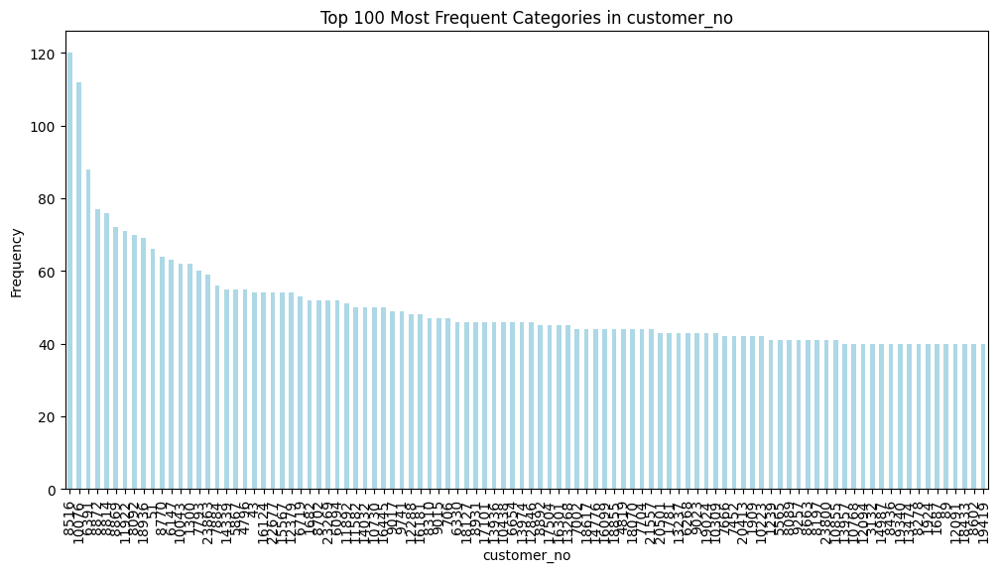

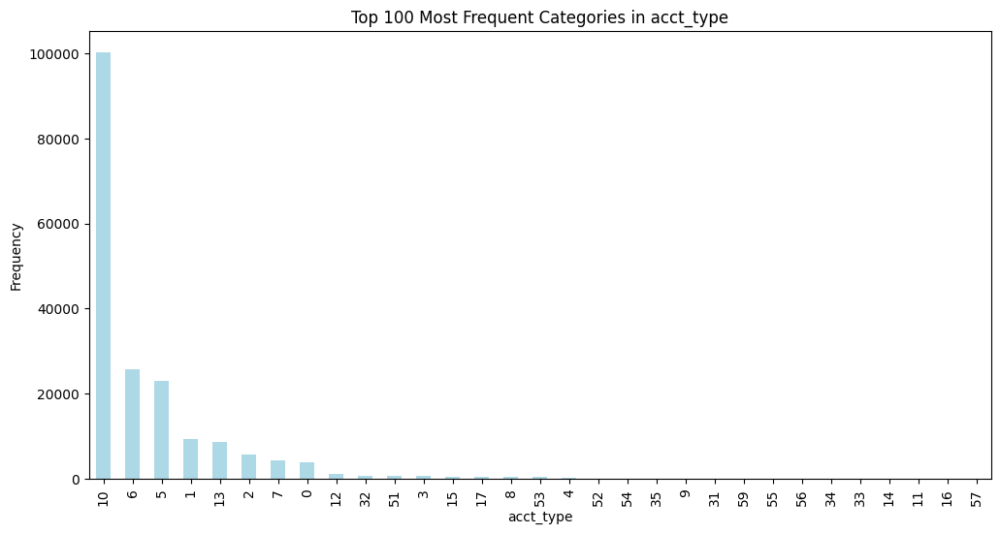

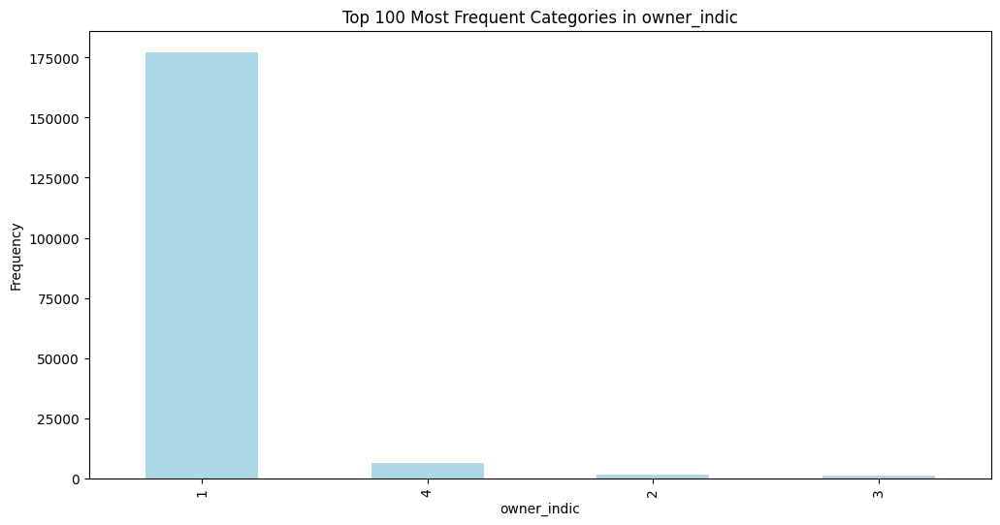

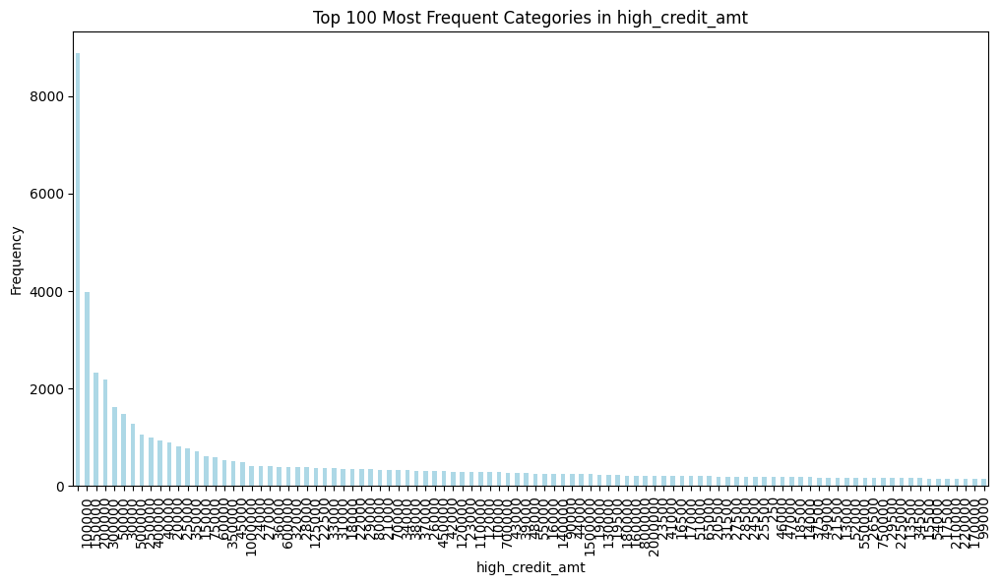

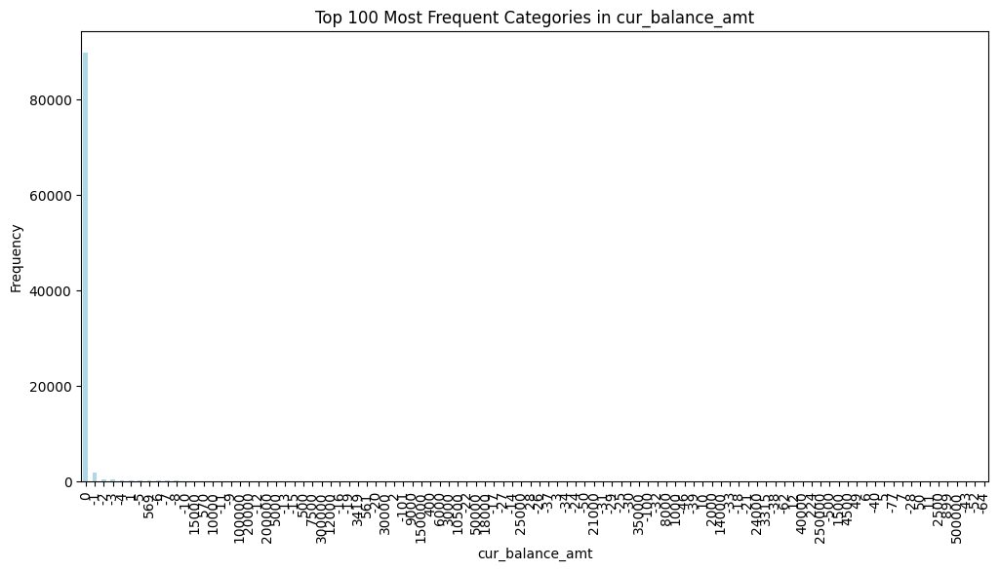

...

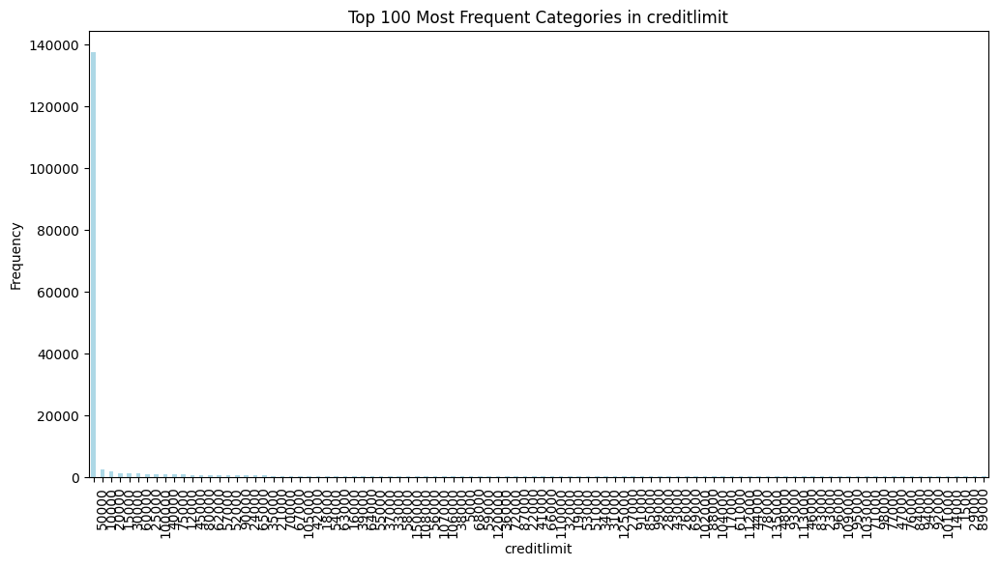

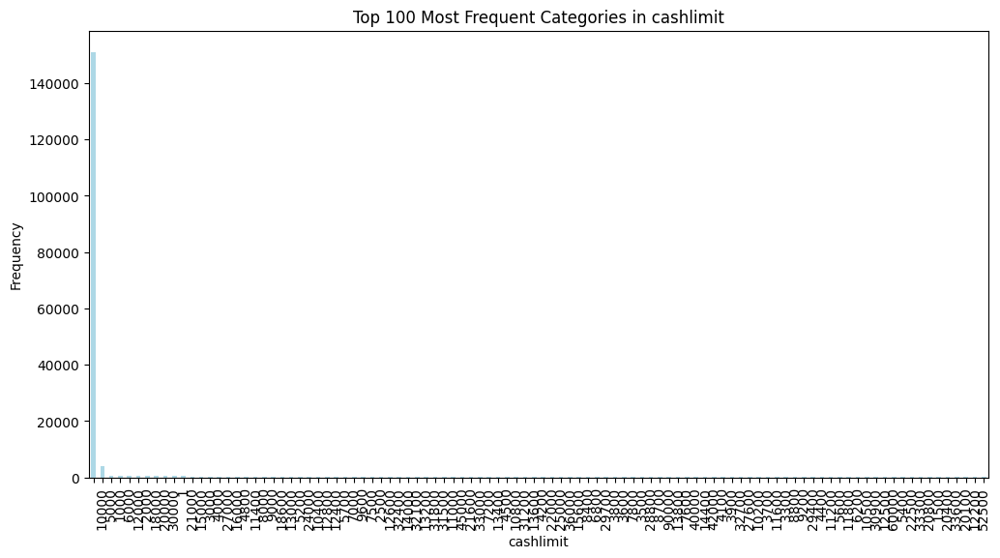

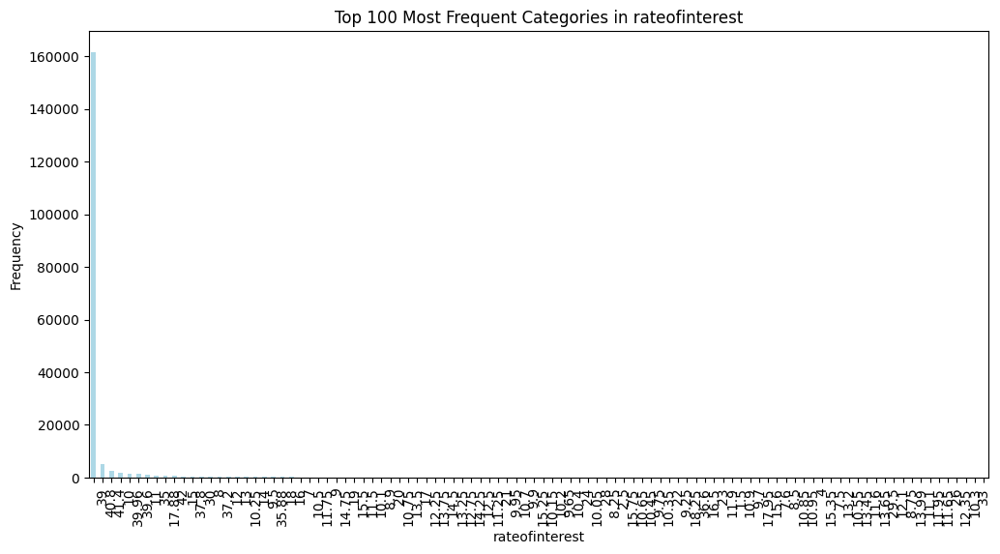

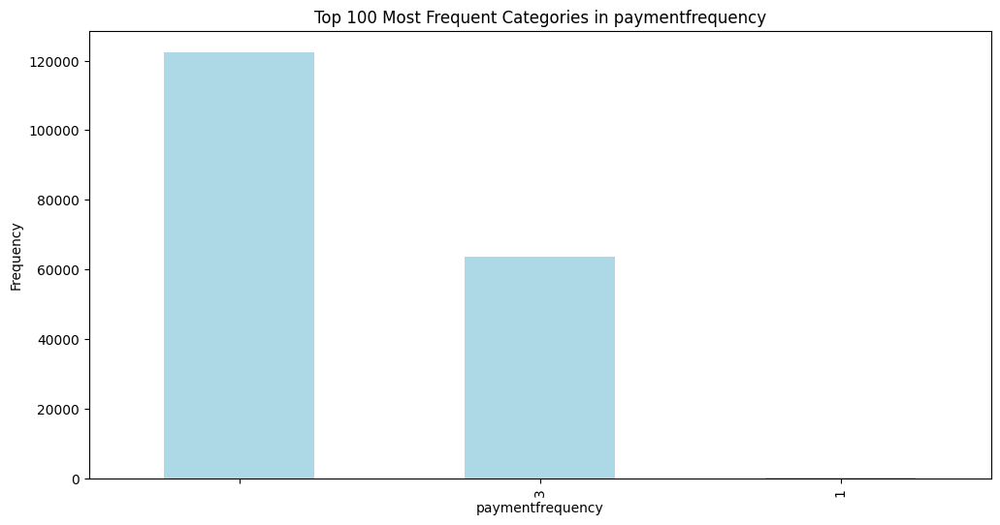

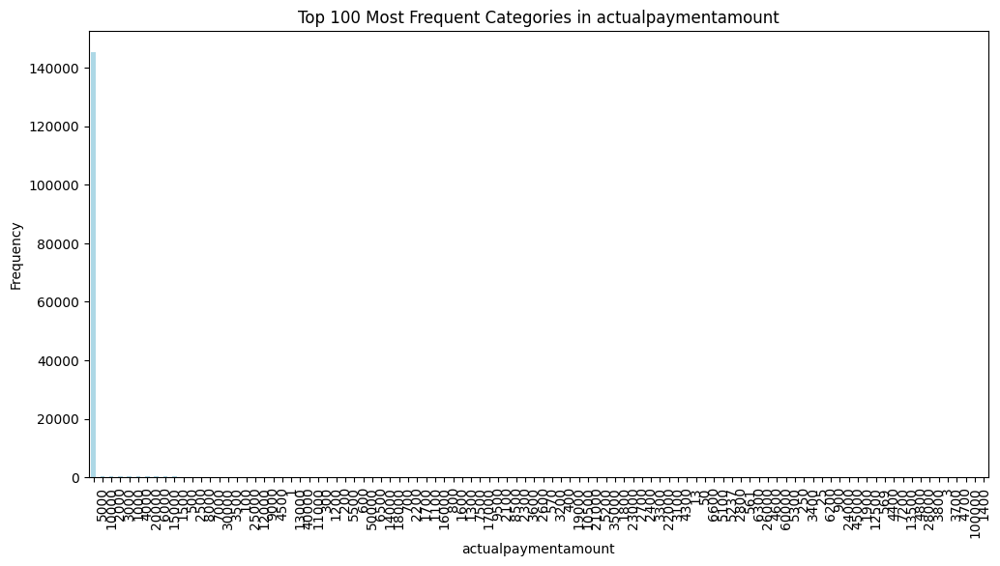

In [14]:
for col in categorical_columns:
    plt.figure(figsize=(12, 6))
    cust_account[col].value_counts().head(100).plot(kind='bar', color='lightblue')
    plt.title(f"Top 100 Most Frequent Categories in {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.show()

### 1. customer_no
- Key Insight:
Most customer numbers appear only once, but some customers have a significantly higher number of records.
For example, customer_no 8516 appears 120 times, and customer_no 10076 appears 112 times. These customers might have multiple transactions or activities recorded.
- Actionable Insights:
Frequent customers: Investigate the reason behind frequent appearances of certain customer_nos. Are these loyal customers, repeat offenders, or clients with recurring transactions?
Sporadic customers: Many customers appear only once, indicating they might have a one-time interaction or transaction. Understanding why this is the case could lead to insights about customer behavior.

### 2. acct_type (Account Type)
- Key Insight:
acct_type 10 dominates, with 100,239 occurrences, followed by other types like 6, 5, and 1 with lower frequencies.
The rest of the account types (e.g., 32, 51, 35) occur very infrequently, indicating they might represent niche or special cases.
- Actionable Insights:
Dominant account types: Focus on acct_type 10, as it is the most common. It may represent the standard or most prevalent type of account in the dataset.
Rare account types: Investigate rare account types (e.g., acct_type 31, acct_type 33) to understand why they have so few occurrences. Are these new types, special categories, or data anomalies?

### 3. owner_indic (Owner Indicator)
- Key Insight:
owner_indic is mostly 1 (177,287 occurrences), indicating a majority of customers are classified as owner_indic = 1.
Other values like 2, 3, and `4 are much less frequent.
- Actionable Insights:
Dominant category: Investigate what owner_indic = 1 represents. It could be a standard or default ownership status for most customers.
Minor categories: The less frequent categories (owner_indic = 2, 3, 4) could represent different types of owners or customer statuses. These may need further exploration to understand if they have specific financial behaviors or risk profiles.

### 4. high_credit_amt (High Credit Amount)
- Key Insight:
Many records have high_credit_amt as blank (8875 occurrences), which might suggest missing data or no high credit reported.
For other values like 100,000, 150,000, and 200,000, there are some clear patterns.
- Actionable Insights:
Missing values: Investigate why so many high_credit_amt values are missing. It might indicate incomplete data or a lack of recorded high credit amounts for certain customers.
High credit holders: For records with valid high credit values, you could analyze customers with large credit amounts to identify if they belong to a specific customer segment that behaves differently.

### 5. cur_balance_amt (Current Balance Amount)
- Key Insight:
The most frequent value is 0, meaning most customers have a zero balance.
Negative values (e.g., -1, -2, -3) indicate customers with balances in arrears or outstanding amounts.
- Actionable Insights:
Zero balances: Investigate if customers with 0 balance are dormant accounts or customers who have cleared their debts.
Negative balances: Customers with negative balances (-1, -2) might require follow-up for overdue payments or collections, as they could represent risky or defaulted customers.

### 6. amt_past_due (Amount Past Due)
- Key Insight:
The majority of records show amt_past_due = 0, indicating no overdue payments.
A few records show past due amounts, with 400 being the most common overdue amount.
- Actionable Insights:
No overdue payments: Customers with amt_past_due = 0 might be up-to-date on their payments, which is positive.
Late payments: Customers with overdue payments (like 400, 3) might need attention. You can segment customers based on overdue amounts and assess their creditworthiness.

### 7. paymenthistory1
- Key Insight:
A large portion of customers have paymenthistory1 as a long string of 0s (44979 occurrences), suggesting no payment history issues.
However, there are strings like "XXX", which might indicate issues with the payment history.
- Actionable Insights:
Standard payments: Customers with paymenthistory1 as 0 might be considered regular payers.
Problematic payment histories: Values like "XXX" likely represent customers with missed payments or irregular payment behavior. These customers may need to be flagged for further credit risk analysis.

### 8. paymenthistory2
- Key Insight:
Similar to paymenthistory1, most records show a long string of 0s, but other strings like "XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX" indicate possible payment problems.
- Actionable Insights:
Regular payers: Like paymenthistory1, those with 0s are likely to have no issues with payments.
Irregular payment behavior: Non-standard values may indicate customers with inconsistent or problematic payment histories. Investigate these customers for potential risk.

### 9. creditlimit
- Key Insight:
creditlimit of 137,477 is the most common, with other values like 50,000, 10,000, 20,000 occurring less frequently.
- Actionable Insights:
Standard credit limit: Most customers seem to have a credit limit around 137,477. Investigate why this value is dominant—does it represent a typical credit limit for your customers?
Lower limits: Look into customers with lower credit limits (e.g., 10,000, 20,000) to understand if they have different financial behaviors or if they belong to a different customer category.

### 10. cashlimit
- Key Insight:
The most frequent value is 151,047, similar to creditlimit. Other values like 10000, 5000 occur less often.
- Actionable Insights:
Standard cash limit: Customers with a cash limit of 151,047 could represent a standard offering or a default value. Analyze if this matches the credit limit behavior.
Low cash limits: Customers with lower cash limits might be categorized differently and may have distinct financial characteristics or payment behaviors.

### 11. rateofinterest
- Key Insight:
Most records have rateofinterest = 161,496, indicating a potential default or missing value.
For valid interest rates, values like 39, 40.8, and 41.4 appear more frequently.
- Actionable Insights:
Check for missing data: The large number of 161,496 suggests missing or default values. Handling missing data or replacing default values should be a priority.
Interest rate distribution: Look at the interest rates to determine if customers with higher rates are riskier and analyze their repayment patterns.

### 12. paymentfrequency
- Key Insight:
Most records show paymentfrequency = 122,436, which might represent a default payment frequency, and a smaller portion have values like 3 and 1.
- Actionable Insights:
Default frequency: paymentfrequency = 122,436 might represent a standard frequency (e.g., monthly payments). Investigate if this aligns with the actual payment behavior of customers.
Irregular frequencies: Customers with paymentfrequency = 3 or 1 may have unique payment schedules, and understanding these variations could provide insights into customer payment behavior.

### 13. actualpaymentamount
- Key Insight:
actualpaymentamount of 145,276 is dominant, with other values like 5000, 10000, and 2000 appearing less frequently.
- Actionable Insights:
Typical payments: Customers paying around 145,276 might be high-value customers, while smaller payments (e.g., 5000, 10000) could represent regular customers or lower-income brackets.
Payment pattern: Analyzing the relationship between actualpaymentamount and other financial variables (like amt_past_due and creditlimit) could provide deeper insights into payment behavior.


# Bivariate Analysis - Categorical vs Categorical Columns

### acct_type vs owner_indic

owner_indic      1     2    3     4
acct_type                          
0             3776     0   37   131
1             7931     0  406  1090
10           98652  1581    0     6
11               4     0    0     0
12            1090     0   16    90
13            7969     0   95   505
14               5     0    0     0
15             505     0    1    13
16               2     0    0     0
17             205     0  136   112
2             2548     0  231  2860
3              336     0   21   315
31              27     0    0     0
32             660     0   11    73
33               4     0    0     1
34               3     0    1     1
35               4     0    0    50
4              158     0    2    28
5            22404     0   57   460
51             508     0   91   133
52              74     0   19     4
53             380     0    2     4
54              50     0   14     9
55              16     0    1     0
56               8     0    0     0
57               1     0    

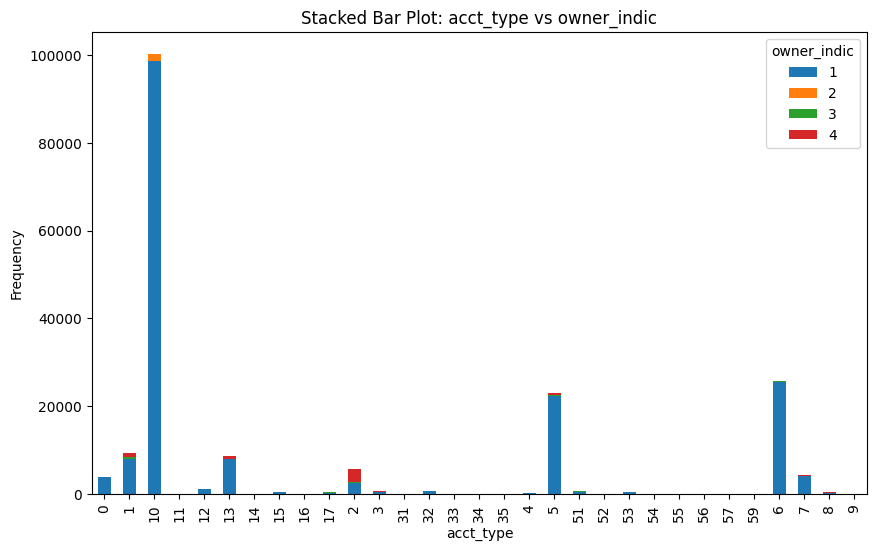

In [19]:
# Crosstab for acct_type vs owner_indic
crosstab_acct_owner = pd.crosstab(cust_account['acct_type'], cust_account['owner_indic'])
print(crosstab_acct_owner)

# Stacked Bar Plot for acct_type vs owner_indic
crosstab_acct_owner.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title("Stacked Bar Plot: acct_type vs owner_indic")
plt.xlabel('acct_type')
plt.ylabel('Frequency')
plt.show()

### acct_type vs paymentfrequency

paymentfrequency           1      3
acct_type                          
0                  2997    0    947
1                  6114    0   3313
10                54043    0  46196
11                    4    0      0
12                  926    0    270
13                 7354    0   1215
14                    3    0      2
15                  436    0     83
16                    2    0      0
17                  307    0    146
2                  3208  121   2310
3                   403    0    269
31                   27    0      0
32                  358    0    386
33                    2    0      3
34                    5    0      0
35                   31    0     23
4                   176    0     12
5                 16143    0   6778
51                  572    0    160
52                   62    0     35
53                  357    0     29
54                   70    0      3
55                   17    0      0
56                    8    0      0
57                    1    0

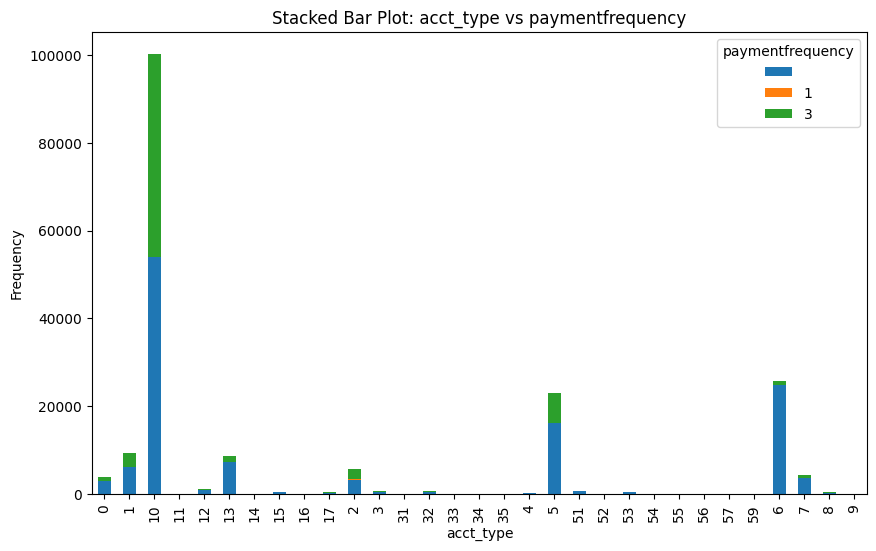

In [20]:
# Crosstab for acct_type vs paymentfrequency
crosstab_acct_payment = pd.crosstab(cust_account['acct_type'], cust_account['paymentfrequency'])
print(crosstab_acct_payment)

# Stacked Bar Plot for acct_type vs paymentfrequency
crosstab_acct_payment.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title("Stacked Bar Plot: acct_type vs paymentfrequency")
plt.xlabel('acct_type')
plt.ylabel('Frequency')
plt.show()

### owner_indic vs paymentfrequency

paymentfrequency            1      3
owner_indic                         
1                 116065    7  61215
2                   1028    0    553
3                    984    0    224
4                   4359  114   1780


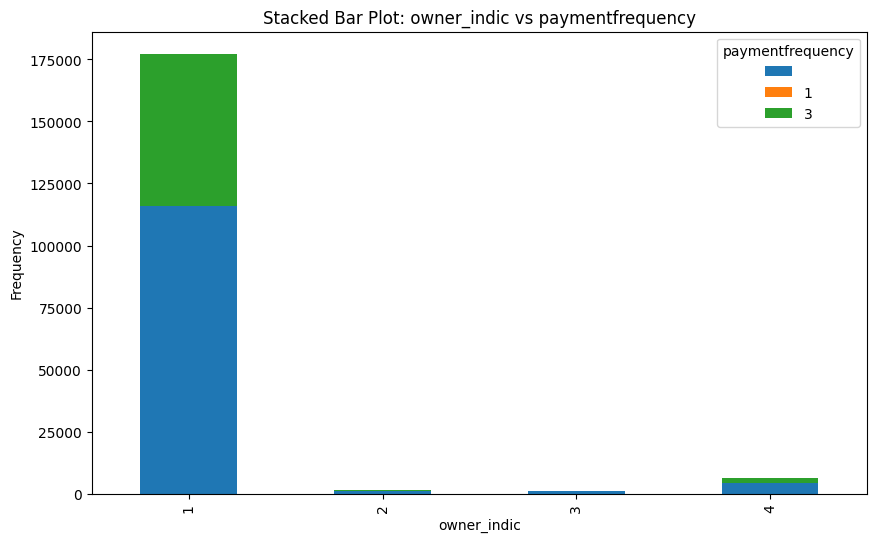

In [21]:
# Crosstab for owner_indic vs paymentfrequency
crosstab_owner_payment = pd.crosstab(cust_account['owner_indic'], cust_account['paymentfrequency'])
print(crosstab_owner_payment)

# Stacked Bar Plot for owner_indic vs paymentfrequency
crosstab_owner_payment.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title("Stacked Bar Plot: owner_indic vs paymentfrequency")
plt.xlabel('owner_indic')
plt.ylabel('Frequency')
plt.show()

### acct_type vs high_credit_amt

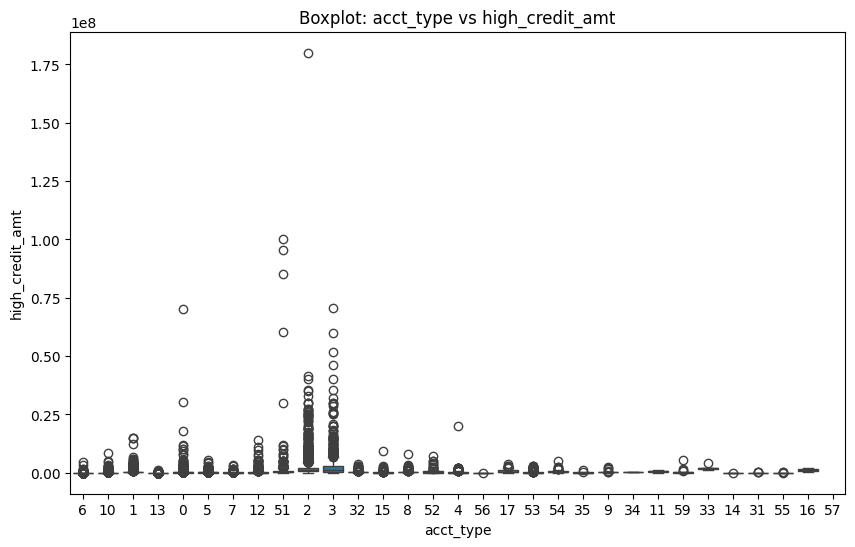

In [22]:
# Convert 'high_credit_amt' to numeric, coercing errors into NaN
cust_account['high_credit_amt'] = pd.to_numeric(cust_account['high_credit_amt'], errors='coerce')

# Boxplot for acct_type vs high_credit_amt
plt.figure(figsize=(10, 6))
sns.boxplot(x='acct_type', y='high_credit_amt', data=cust_account)
plt.title('Boxplot: acct_type vs high_credit_amt')
plt.xlabel('acct_type')
plt.ylabel('high_credit_amt')
plt.show()

### owner_indic vs cur_balance_amt

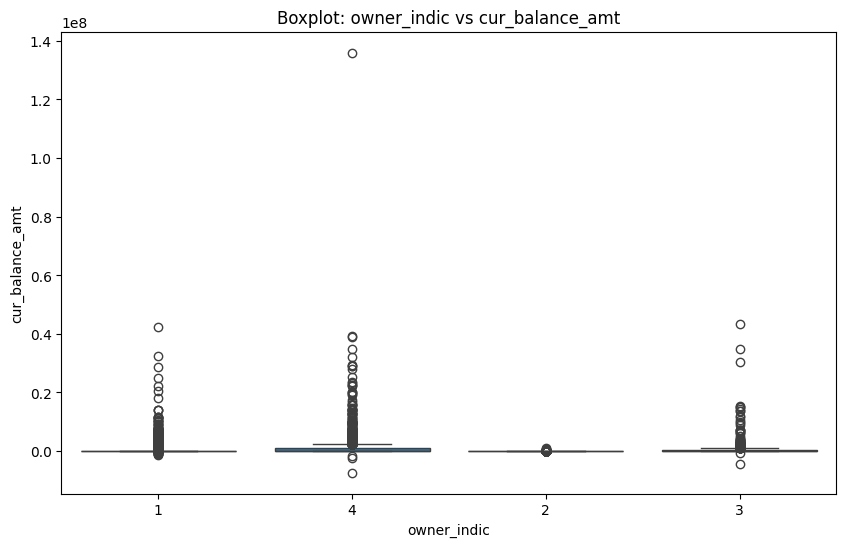

In [23]:
# Convert 'cur_balance_amt' to numeric, coercing errors into NaN
cust_account['cur_balance_amt'] = pd.to_numeric(cust_account['cur_balance_amt'], errors='coerce')

# Boxplot for owner_indic vs cur_balance_amt
plt.figure(figsize=(10, 6))
sns.boxplot(x='owner_indic', y='cur_balance_amt', data=cust_account)
plt.title('Boxplot: owner_indic vs cur_balance_amt')
plt.xlabel('owner_indic')
plt.ylabel('cur_balance_amt')
plt.show()

### paymentfrequency vs amt_past_due

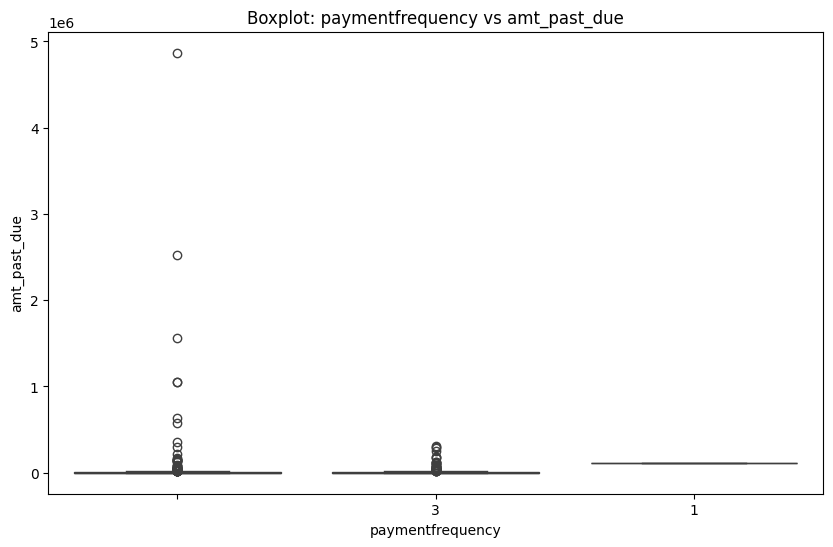

In [24]:
# Convert 'amt_past_due' to numeric, coercing errors into NaN
cust_account['amt_past_due'] = pd.to_numeric(cust_account['amt_past_due'], errors='coerce')

# Boxplot for paymentfrequency vs amt_past_due
plt.figure(figsize=(10, 6))
sns.boxplot(x='paymentfrequency', y='amt_past_due', data=cust_account)
plt.title('Boxplot: paymentfrequency vs amt_past_due')
plt.xlabel('paymentfrequency')
plt.ylabel('amt_past_due')
plt.show()

### 1. acct_type vs owner_indic (Crosstab and Stacked Bar Plot)
- Insight: By examining the crosstab between acct_type and owner_indic, we can understand the distribution of account types for different owner indicators. For example, if the majority of account types (acct_type) are concentrated in specific values of owner_indic (e.g., "1" for active owners), this suggests that certain types of accounts are more likely to belong to specific categories of owners.
- Implication: This could be useful for identifying patterns in account ownership. If certain account types are predominantly associated with specific owners, it can help with customer segmentation and targeted marketing.

### 2. acct_type vs paymentfrequency (Crosstab and Stacked Bar Plot)
- Insight: The relationship between acct_type and paymentfrequency reveals how different account types are distributed across various payment frequencies. If certain account types (e.g., credit cards or loans) are predominantly associated with certain payment frequencies (e.g., monthly, weekly), it shows the behavioral patterns of customers with different account types.
- Implication: Understanding how customers prefer to make payments for different account types can inform payment reminder strategies or help design flexible payment plans for customers, based on their behavior.

### 3. owner_indic vs paymentfrequency (Crosstab and Stacked Bar Plot)
- Insight: This crosstab reveals how the owner_indic (owner type) is related to the payment frequency. If owners who are categorized under owner_indic = 1 (active owners) are more likely to follow a certain payment frequency (e.g., monthly or quarterly), it can help the business optimize their payment collection strategies by focusing on preferred payment schedules.
- Implication: A targeted approach can be developed to send payment reminders or adjust payment plans according to the preferred payment frequencies of different types of owners.

### 4. acct_type vs high_credit_amt (Boxplot)
- Insight: The boxplot between acct_type and high_credit_amt shows the distribution of high credit amounts across different account types. For example, if high credit amounts are significantly higher for certain account types (e.g., loans or credit cards), this indicates that customers with these account types are more likely to have higher credit limits.
- Implication: This insight can help the business tailor offers or services for customers with higher credit limits, such as offering premium credit products or adjusting interest rates based on account type and credit exposure.

### 5. owner_indic vs cur_balance_amt (Boxplot)
- Insight: The boxplot between owner_indic and cur_balance_amt illustrates the distribution of current balances for active and inactive owners. If the median cur_balance_amt is significantly higher for owner_indic = 1 (active owners), it suggests that active owners maintain larger balances on their accounts.
- Implication: The business may choose to provide more personalized services or higher credit limits to active owners who maintain higher balances, as they are more likely to be high-value customers.

### 6. paymentfrequency vs amt_past_due (Boxplot)
- Insight: The boxplot between paymentfrequency and amt_past_due helps visualize the relationship between payment frequency and overdue amounts. If customers with a certain payment frequency (e.g., monthly payments) tend to have larger overdue amounts, this could indicate that those who pay less frequently might struggle more with timely payments.
- Implication: To mitigate overdue balances, the business can consider adjusting the payment frequency options for customers or introduce incentives for those paying on a more frequent basis to reduce overdue amounts.

# Data preprocessing

### Missing values

In [25]:
cust_account.isnull().sum()

dt_opened                   0
customer_no                 0
upload_dt                   0
acct_type                   0
owner_indic                 0
opened_dt                 455
last_paymt_dt           25487
closed_dt              109075
reporting_dt                0
high_credit_amt          8875
cur_balance_amt             0
amt_past_due           185453
paymenthistory1             0
paymenthistory2             0
paymt_str_dt                1
paymt_end_dt                1
creditlimit                 0
cashlimit                   0
rateofinterest              0
paymentfrequency            0
actualpaymentamount         0
dtype: int64

In [26]:
# Impute missing values in 'opened_dt' with the mode
cust_account['opened_dt'] = cust_account['opened_dt'].fillna(cust_account['opened_dt'].mode()[0])

# Check if missing values are handled
print(cust_account['opened_dt'].isnull().sum())

0


In [27]:
# Impute missing values in 'last_paymt_dt' with the mode or a suitable value
cust_account['last_paymt_dt'] = cust_account['last_paymt_dt'].fillna(cust_account['last_paymt_dt'].mode()[0])

# Check if missing values are handled
print(cust_account['last_paymt_dt'].isnull().sum())

0


In [28]:
# Impute missing values in 'high_credit_amt' with the median
cust_account['high_credit_amt'] = cust_account['high_credit_amt'].fillna(cust_account['high_credit_amt'].median())

# Check if missing values are handled
print(cust_account['high_credit_amt'].isnull().sum())

0


### Key Insight: It's best to drop columns with such a high percentage of missing values as they don’t provide useful information.

In [29]:
# Drop 'amt_past_due' due to its high missing percentage
cust_account = cust_account.drop(columns=['amt_past_due'])

# Check if column is dropped
print(cust_account.columns)

Index(['dt_opened', 'customer_no', 'upload_dt', 'acct_type', 'owner_indic',
       'opened_dt', 'last_paymt_dt', 'closed_dt', 'reporting_dt',
       'high_credit_amt', 'cur_balance_amt', 'paymenthistory1',
       'paymenthistory2', 'paymt_str_dt', 'paymt_end_dt', 'creditlimit',
       'cashlimit', 'rateofinterest', 'paymentfrequency',
       'actualpaymentamount'],
      dtype='object')


In [30]:
# Impute missing values in 'paymt_str_dt' and 'paymt_end_dt' with the mode or ffill
cust_account['paymt_str_dt'] = cust_account['paymt_str_dt'].fillna(cust_account['paymt_str_dt'].mode()[0])
cust_account['paymt_end_dt'] = cust_account['paymt_end_dt'].fillna(cust_account['paymt_end_dt'].mode()[0])

# Check if missing values are handled
print(cust_account[['paymt_str_dt', 'paymt_end_dt']].isnull().sum())

paymt_str_dt    0
paymt_end_dt    0
dtype: int64


In [31]:
cust_account = cust_account.drop(columns=['closed_dt'])

In [32]:
# Check if there are any missing values remaining
print(cust_account.isnull().sum())

dt_opened              0
customer_no            0
upload_dt              0
acct_type              0
owner_indic            0
opened_dt              0
last_paymt_dt          0
reporting_dt           0
high_credit_amt        0
cur_balance_amt        0
paymenthistory1        0
paymenthistory2        0
paymt_str_dt           0
paymt_end_dt           0
creditlimit            0
cashlimit              0
rateofinterest         0
paymentfrequency       0
actualpaymentamount    0
dtype: int64


# Categorical to numerical

### Label Encoding

In [33]:
from sklearn.preprocessing import LabelEncoder

# Instantiate the encoder
label_encoder = LabelEncoder()

# Example of Label Encoding on ordinal columns
cust_account['acct_type'] = label_encoder.fit_transform(cust_account['acct_type'])
cust_account['owner_indic'] = label_encoder.fit_transform(cust_account['owner_indic'])
cust_account['paymentfrequency'] = label_encoder.fit_transform(cust_account['paymentfrequency'])
cust_account['paymenthistory1'] = label_encoder.fit_transform(cust_account['paymenthistory1'])
cust_account['paymenthistory2'] = label_encoder.fit_transform(cust_account['paymenthistory2'])

# Check the encoding results
print(cust_account[['acct_type', 'owner_indic', 'paymentfrequency', 'paymenthistory1', 'paymenthistory2']].head())

   acct_type  owner_indic  paymentfrequency  paymenthistory1  paymenthistory2
0         27            0                 0            15698                0
1          2            0                 2               17             1143
2          2            0                 0               17               18
3          2            0                 0            14004                0
4         27            0                 0                4                0


### Conversion of creditlimit, cashlimit, rateofinterest, and actualpaymentamount

In [34]:
# Convert 'creditlimit', 'cashlimit', 'rateofinterest', 'actualpaymentamount' to numeric
cust_account['creditlimit'] = pd.to_numeric(cust_account['creditlimit'], errors='coerce')
cust_account['cashlimit'] = pd.to_numeric(cust_account['cashlimit'], errors='coerce')
cust_account['rateofinterest'] = pd.to_numeric(cust_account['rateofinterest'], errors='coerce')
cust_account['actualpaymentamount'] = pd.to_numeric(cust_account['actualpaymentamount'], errors='coerce')

# Verify the conversion
print(cust_account[['creditlimit', 'cashlimit', 'rateofinterest', 'actualpaymentamount']].head())

   creditlimit  cashlimit  rateofinterest  actualpaymentamount
0          NaN        NaN             NaN                  NaN
1      14000.0     1400.0             NaN               5603.0
2          NaN        NaN             NaN                  NaN
3          NaN        NaN             NaN                  NaN
4          NaN        NaN             NaN                  NaN


In [35]:
cust_account.isnull().sum()

dt_opened                   0
customer_no                 0
upload_dt                   0
acct_type                   0
owner_indic                 0
opened_dt                   0
last_paymt_dt               0
reporting_dt                0
high_credit_amt             0
cur_balance_amt             0
paymenthistory1             0
paymenthistory2             0
paymt_str_dt                0
paymt_end_dt                0
creditlimit            137477
cashlimit              151047
rateofinterest         161506
paymentfrequency            0
actualpaymentamount    145276
dtype: int64

In [36]:
# Check the percentage of missing values in these columns
missing_percent = cust_account[['creditlimit', 'cashlimit', 'rateofinterest', 'actualpaymentamount']].isnull().mean() * 100
print(missing_percent)

# Option 1: Fill missing values with the median (or other appropriate method)
cust_account['creditlimit'].fillna(cust_account['creditlimit'].median(), inplace=True)
cust_account['cashlimit'].fillna(cust_account['cashlimit'].median(), inplace=True)
cust_account['rateofinterest'].fillna(cust_account['rateofinterest'].median(), inplace=True)
cust_account['actualpaymentamount'].fillna(cust_account['actualpaymentamount'].median(), inplace=True)

# Verify after handling missing values
print(cust_account[['creditlimit', 'cashlimit', 'rateofinterest', 'actualpaymentamount']].isnull().sum())

creditlimit            73.781859
cashlimit              81.064676
rateofinterest         86.677865
actualpaymentamount    77.967466
dtype: float64
creditlimit            0
cashlimit              0
rateofinterest         0
actualpaymentamount    0
dtype: int64


### Extracting Features from Datetime Columns

In [37]:
# Convert datetime columns into useful features
cust_account['dt_opened_year'] = cust_account['dt_opened'].dt.year
cust_account['dt_opened_month'] = cust_account['dt_opened'].dt.month
cust_account['dt_opened_day'] = cust_account['dt_opened'].dt.day

cust_account['upload_dt_year'] = cust_account['upload_dt'].dt.year
cust_account['upload_dt_month'] = cust_account['upload_dt'].dt.month
cust_account['upload_dt_day'] = cust_account['upload_dt'].dt.day

cust_account['opened_dt_year'] = cust_account['opened_dt'].dt.year
cust_account['opened_dt_month'] = cust_account['opened_dt'].dt.month
cust_account['opened_dt_day'] = cust_account['opened_dt'].dt.day

cust_account['last_paymt_dt_year'] = cust_account['last_paymt_dt'].dt.year
cust_account['last_paymt_dt_month'] = cust_account['last_paymt_dt'].dt.month
cust_account['last_paymt_dt_day'] = cust_account['last_paymt_dt'].dt.day

cust_account['reporting_dt_year'] = cust_account['reporting_dt'].dt.year
cust_account['reporting_dt_month'] = cust_account['reporting_dt'].dt.month
cust_account['reporting_dt_day'] = cust_account['reporting_dt'].dt.day

cust_account['paymt_str_dt_year'] = cust_account['paymt_str_dt'].dt.year
cust_account['paymt_str_dt_month'] = cust_account['paymt_str_dt'].dt.month
cust_account['paymt_str_dt_day'] = cust_account['paymt_str_dt'].dt.day

cust_account['paymt_end_dt_year'] = cust_account['paymt_end_dt'].dt.year
cust_account['paymt_end_dt_month'] = cust_account['paymt_end_dt'].dt.month
cust_account['paymt_end_dt_day'] = cust_account['paymt_end_dt'].dt.day

# Verify the transformations
print(cust_account[['dt_opened_year', 'dt_opened_month', 'dt_opened_day']].head())

   dt_opened_year  dt_opened_month  dt_opened_day
0            2015               11             10
1            2015               11             10
2            2015               11             10
3            2015                7             20
4            2015                7             20


In [38]:
# Check the uniqueness of the 'customer_no' column
print(cust_account['customer_no'].nunique())
print(len(cust_account['customer_no']))

23896
186329


In [39]:
# Encode 'customer_no' using LabelEncoder
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
cust_account['customer_no'] = label_encoder.fit_transform(cust_account['customer_no'])

# Verify the encoding
print(cust_account['customer_no'].head())

0    2519
1    2519
2    2519
3    6231
4    6231
Name: customer_no, dtype: int32


In [40]:
# Example: Analyze the distribution of records per customer
customer_record_counts = cust_account['customer_no'].value_counts()
print(customer_record_counts.describe())  # Summary statistics for record counts

count    23896.000000
mean         7.797497
std          6.723154
min          1.000000
25%          3.000000
50%          6.000000
75%         10.000000
max        120.000000
Name: count, dtype: float64


In [41]:
cust_account.dtypes

dt_opened              datetime64[ns]
customer_no                     int32
upload_dt              datetime64[ns]
acct_type                       int32
owner_indic                     int32
opened_dt              datetime64[ns]
last_paymt_dt          datetime64[ns]
reporting_dt           datetime64[ns]
high_credit_amt               float64
cur_balance_amt                 int64
paymenthistory1                 int32
paymenthistory2                 int32
paymt_str_dt           datetime64[ns]
paymt_end_dt           datetime64[ns]
creditlimit                   float64
cashlimit                     float64
rateofinterest                float64
paymentfrequency                int32
actualpaymentamount           float64
dt_opened_year                  int32
dt_opened_month                 int32
dt_opened_day                   int32
upload_dt_year                  int32
upload_dt_month                 int32
upload_dt_day                   int32
opened_dt_year                  int32
opened_dt_mo

# Handling Outliers

In [42]:
from scipy import stats

### high_credit_amt

<Axes: xlabel='high_credit_amt'>

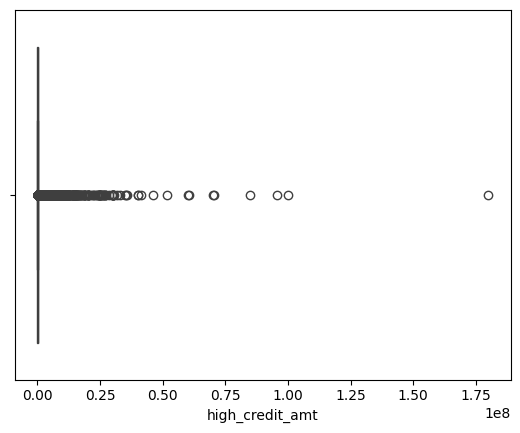

In [43]:
sns.boxplot(x='high_credit_amt',data=cust_account)

In [44]:
## using IQR to remove the outliers
IQR = stats.iqr(cust_account['high_credit_amt'], interpolation = 'midpoint') 

IQR

76000.0

In [45]:
# First quartile (Q1)
Q1 = cust_account['high_credit_amt'].quantile(0.25)

# Third quartile (Q3)
Q3 = cust_account['high_credit_amt'].quantile(0.75)

# Calculate IQR (Interquartile Range)
IQR = Q3 - Q1

# Calculate the lower and upper bounds (min and max limits)
min_limit = Q1 - 1.5 * IQR
max_limit = Q3 + 1.5 * IQR

print(f"Min Limit: {min_limit}")
print(f"Max Limit: {max_limit}")

Min Limit: -90000.0
Max Limit: 214000.0


In [46]:
# Cap the Outliers
cust_account['high_credit_amt'] = cust_account['high_credit_amt'].apply(
    lambda x: max(-90000, min(x, 214000))
)

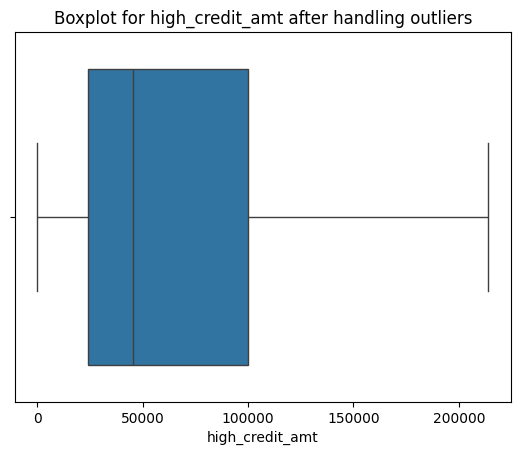

In [47]:
sns.boxplot(x=cust_account['high_credit_amt'])
plt.title('Boxplot for high_credit_amt after handling outliers')
plt.show()

### cur_balance_amt

<Axes: xlabel='cur_balance_amt'>

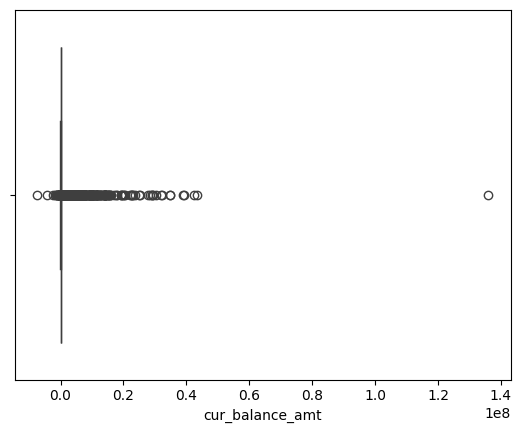

In [48]:
sns.boxplot(x='cur_balance_amt',data=cust_account)

In [49]:
## using IQR to remove the outliers
IQR = stats.iqr(cust_account['cur_balance_amt'], interpolation = 'midpoint') 

IQR

20998.0

In [50]:
# First quartile (Q1)
Q1 = cust_account['cur_balance_amt'].quantile(0.25)

# Third quartile (Q3)
Q3 = cust_account['cur_balance_amt'].quantile(0.75)

# Calculate IQR (Interquartile Range)
IQR = Q3 - Q1

# Calculate the lower and upper bounds (min and max limits)
min_limit = Q1 - 1.5 * IQR
max_limit = Q3 + 1.5 * IQR

print(f"Min Limit: {min_limit}")
print(f"Max Limit: {max_limit}")

Min Limit: -31497.0
Max Limit: 52495.0


In [51]:
# Cap the Outliers
cust_account['cur_balance_amt'] = cust_account['cur_balance_amt'].apply(
    lambda x: max(-31497, min(x, 52495))
)

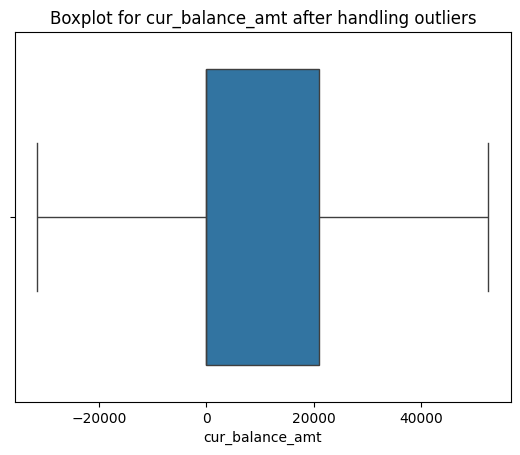

In [52]:
sns.boxplot(x=cust_account['cur_balance_amt'])
plt.title('Boxplot for cur_balance_amt after handling outliers')
plt.show()

### creditlimit

<Axes: xlabel='creditlimit'>

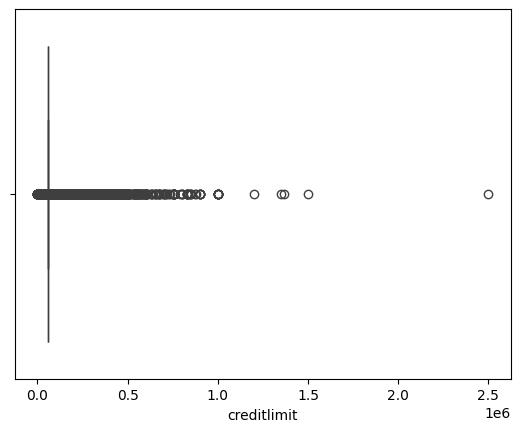

In [53]:
sns.boxplot(x='creditlimit',data=cust_account)

In [54]:
## using IQR to remove the outliers
IQR = stats.iqr(cust_account['creditlimit'], interpolation = 'midpoint') 

IQR

0.0

In [55]:
# First quartile (Q1)
Q1 = cust_account['creditlimit'].quantile(0.25)

# Third quartile (Q3)
Q3 = cust_account['creditlimit'].quantile(0.75)

# Calculate IQR (Interquartile Range)
IQR = Q3 - Q1

# Calculate the lower and upper bounds (min and max limits)
min_limit = Q1 - 1.5 * IQR
max_limit = Q3 + 1.5 * IQR

print(f"Min Limit: {min_limit}")
print(f"Max Limit: {max_limit}")

Min Limit: 60000.0
Max Limit: 60000.0


In [56]:
# Cap the Outliers
cust_account['creditlimit'] = cust_account['creditlimit'].apply(
    lambda x: max(60000, min(x, 60000))
)

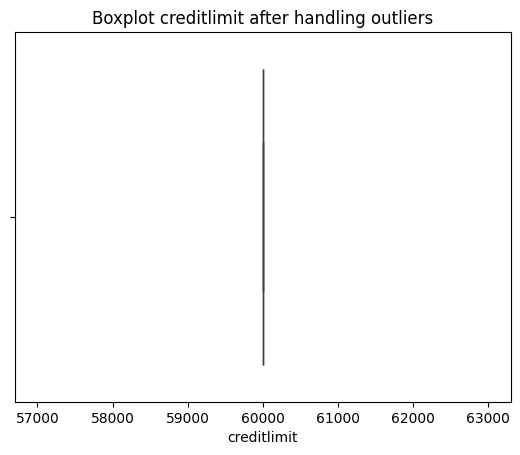

In [57]:
sns.boxplot(x=cust_account['creditlimit'])
plt.title('Boxplot creditlimit after handling outliers')
plt.show()

### cashlimit

<Axes: xlabel='cashlimit'>

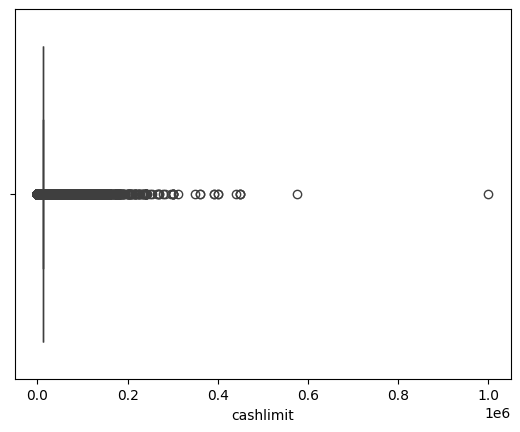

In [58]:
sns.boxplot(x='cashlimit',data=cust_account)

In [59]:
## using IQR to remove the outliers
IQR = stats.iqr(cust_account['cashlimit'], interpolation = 'midpoint') 

IQR

0.0

In [60]:
# First quartile (Q1)
Q1 = cust_account['cashlimit'].quantile(0.25)

# Third quartile (Q3)
Q3 = cust_account['cashlimit'].quantile(0.75)

# Calculate IQR (Interquartile Range)
IQR = Q3 - Q1

# Calculate the lower and upper bounds (min and max limits)
min_limit = Q1 - 1.5 * IQR
max_limit = Q3 + 1.5 * IQR

print(f"Min Limit: {min_limit}")
print(f"Max Limit: {max_limit}")

Min Limit: 12500.0
Max Limit: 12500.0


In [61]:
# Cap the Outliers
cust_account['cashlimit'] = cust_account['cashlimit'].apply(
    lambda x: max(12500, min(x, 12500))
)

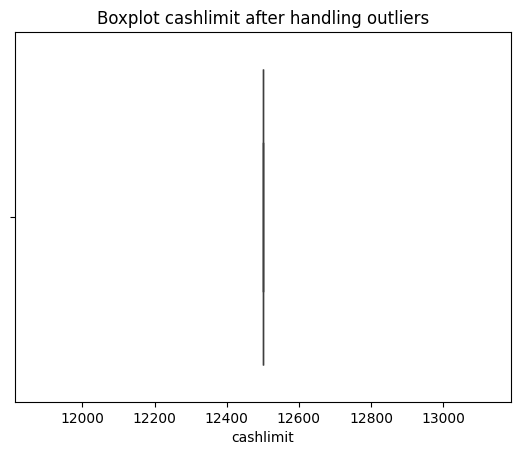

In [62]:
sns.boxplot(x=cust_account['cashlimit'])
plt.title('Boxplot cashlimit after handling outliers')
plt.show()

### rateofinterest

<Axes: xlabel='rateofinterest'>

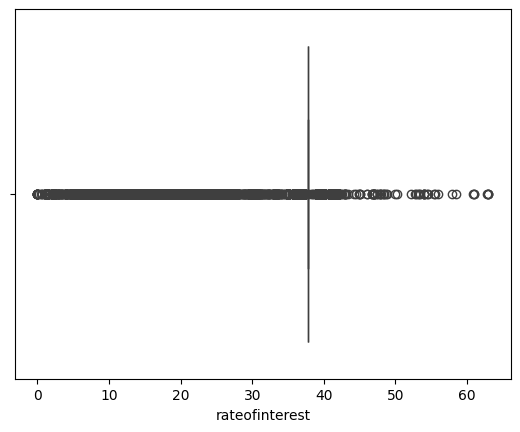

In [63]:
sns.boxplot(x='rateofinterest',data=cust_account)

In [64]:
## using IQR to remove the outliers
IQR = stats.iqr(cust_account['rateofinterest'], interpolation = 'midpoint') 

IQR

0.0

In [65]:
# First quartile (Q1)
Q1 = cust_account['rateofinterest'].quantile(0.25)

# Third quartile (Q3)
Q3 = cust_account['rateofinterest'].quantile(0.75)

# Calculate IQR (Interquartile Range)
IQR = Q3 - Q1

# Calculate the lower and upper bounds (min and max limits)
min_limit = Q1 - 1.5 * IQR
max_limit = Q3 + 1.5 * IQR

print(f"Min Limit: {min_limit}")
print(f"Max Limit: {max_limit}")

Min Limit: 37.8
Max Limit: 37.8


In [66]:
# Cap the Outliers
cust_account['rateofinterest'] = cust_account['rateofinterest'].apply(
    lambda x: max(37.8, min(x, 37.8))
)

<Axes: xlabel='rateofinterest'>

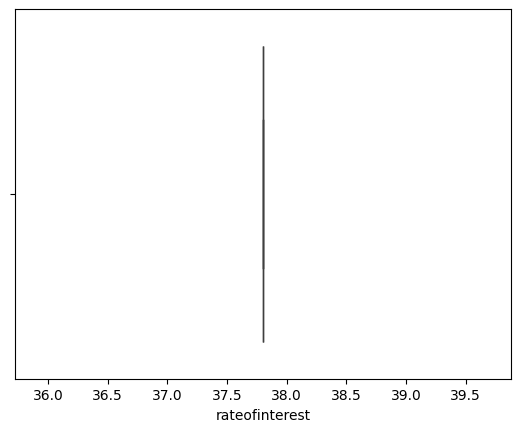

In [67]:
sns.boxplot(x='rateofinterest',data=cust_account)

### actualpaymentamount

<Axes: xlabel='actualpaymentamount'>

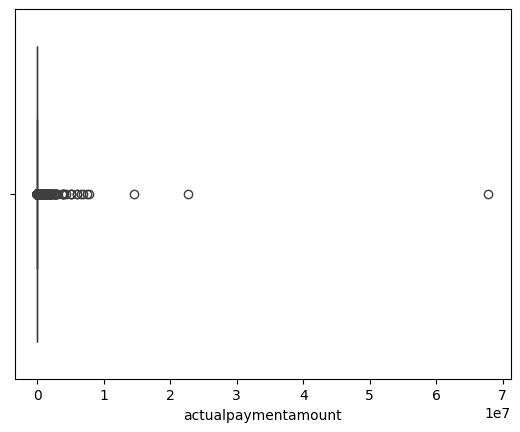

In [68]:
sns.boxplot(x='actualpaymentamount',data=cust_account)

In [69]:
## using IQR to remove the outliers
IQR = stats.iqr(cust_account['actualpaymentamount'], interpolation = 'midpoint') 

IQR

0.0

In [70]:
# First quartile (Q1)
Q1 = cust_account['actualpaymentamount'].quantile(0.25)

# Third quartile (Q3)
Q3 = cust_account['actualpaymentamount'].quantile(0.75)

# Calculate IQR (Interquartile Range)
IQR = Q3 - Q1

# Calculate the lower and upper bounds (min and max limits)
min_limit = Q1 - 1.5 * IQR
max_limit = Q3 + 1.5 * IQR

print(f"Min Limit: {min_limit}")
print(f"Max Limit: {max_limit}")

Min Limit: 7590.0
Max Limit: 7590.0


In [71]:
# Cap the Outliers
cust_account['actualpaymentamount'] = cust_account['actualpaymentamount'].apply(
    lambda x: max(7590, min(x, 7590))
)

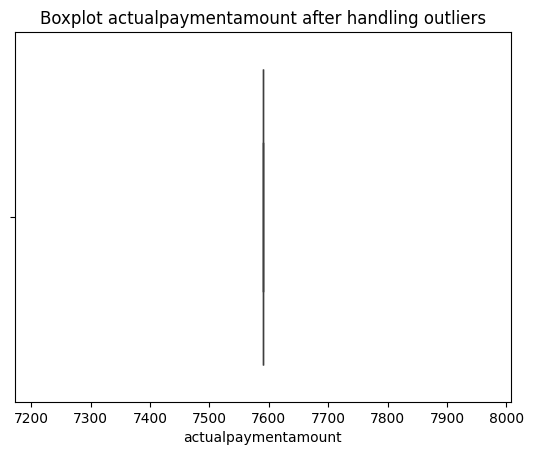

In [72]:
sns.boxplot(x=cust_account['actualpaymentamount'])
plt.title('Boxplot actualpaymentamount after handling outliers')
plt.show()

# 2] cust_demographics

In [73]:
cust_demographics.columns

Index(['dt_opened', 'customer_no', 'entry_time', 'feature_1', 'feature_2',
       'feature_3', 'feature_4', 'feature_5', 'feature_6', 'feature_7',
       'feature_8', 'feature_9', 'feature_10', 'feature_11', 'feature_12',
       'feature_13', 'feature_14', 'feature_15', 'feature_16', 'feature_17',
       'feature_18', 'feature_19', 'feature_20', 'feature_21', 'feature_22',
       'feature_23', 'feature_24', 'feature_25', 'feature_26', 'feature_27',
       'feature_28', 'feature_29', 'feature_30', 'feature_31', 'feature_32',
       'feature_33', 'feature_34', 'feature_35', 'feature_36', 'feature_37',
       'feature_38', 'feature_39', 'feature_40', 'feature_41', 'feature_42',
       'feature_43', 'feature_44', 'feature_45', 'feature_46', 'feature_47',
       'feature_48', 'feature_49', 'feature_50', 'feature_51', 'feature_52',
       'feature_53', 'feature_54', 'feature_55', 'feature_56', 'feature_57',
       'feature_58', 'feature_59', 'feature_60', 'feature_61', 'feature_62',
       '

In [72]:
cust_demographics.head()

,dt_opened,customer_no,entry_time,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_77,feature_78,feature_79,Bad_label
0,18-Apr-15,1,13-Apr-15,Insignia,13-Apr-15,650,2,Card Setup,14,500000,,,,Y,IS1,,0,159,4284,4284,,1,ADFPNXXXXX,03-Sep-65,98332XXXXX,N,@REDIFFMAIL.COM,1,2,,Mumbai / Navi Mumbai / Thane,400610,1965,0,Self,Y,2,90000,,,,0,0,0,0,Mumbai,400059,@CODOGNOTTO.NET,PAN Card,ADFPNXXXXX,The Ratnakar Bank Ltd.,,Y,State Bank of India,0,01-Jun-13,17-Jun-16,1,21,,Y,Y,N,,Y,1965-0,21,15,400610,0,2,90000,Nov-00,21,R,,,0000-00-00,0,98332XXXXX,1,N,0
1,21-Apr-15,2,21-Apr-15,Insignia,21-Apr-15,760,1,Card Setup,14,1200000,,,,Y,IS1,,0,91,B001,4077,,1,AJWPRXXXXX,14-Jul-62,99455XXXXX,N,@GMAIL.COM,1,2,,Bengaluru,560042,1969,0,Self,Y,2,1,,,,0,0,0,0,Bangalore,560042,,PAN Card,AJWPRXXXXX,The Ratnakar Bank Ltd.,,N,,0,,17-Jun-16,1,17,,Y,Y,N,,Y,1969-0,17,12,560042,0,2,1,Nov-00,17,R,,,0000-00-00,0,99455XXXXX,1,N,0
2,22-Apr-15,3,21-Apr-15,Insignia,21-Apr-15,774,1,Card Setup,14,700000,,,,Y,IS1,,0,91,B001,4077,,2,AFAPNXXXXX,10-Apr-66,98456XXXXX,N,@SHOBANARAYAN.COM,1,0,,Bengaluru,560042,1966,0,Self,Y,2,1,,,,0,0,0,0,Bangalore,560042,,PAN Card,AFAPNXXXXX,,,N,,0,,17-Jun-16,3,17,,N,Y,N,,Y,1966-0,17,12,560042,0,2,1,Nov-00,17,R,,,0000-00-00,0,98456XXXXX,1,N,0
3,25-Apr-15,4,15-Apr-15,Insignia,20-Apr-15,770,1,Card Setup,14,500000,,,,Y,IS1,,0,157,5107,5107,,1,AAAPDXXXXX,16-Apr-64,98220XXXXX,N,@VSNL.COM,1,3,,Pune,411001,1988,0,Self,Y,2,100000,,,,0,0,0,0,Pune,411026,@ALBAJ.COM,PAN Card,AAAPDXXXXX,The Ratnakar Bank Ltd.,,Y,HDFC Bank,0,,17-Jun-16,1,21,,Y,Y,N,,Y,1988-0,21,16,411001,0,2,100000,Nov-00,21,R,,,6/15/65,1,98220XXXXX,1,N,0
4,06-May-15,5,30-Apr-15,Insignia,,,3,Card Setup,14,500000,,,,Y,IS1,,0,100,D016,4564,,1,ABEPSXXXXX,03-Jan-54,98111XXXXX,N,@REDIFFMAIL.COM,1,3,,Gurgaon,122009,1995,0,Self,Y,2,300000,,,,0,0,0,0,Gurgaon,122009,,PAN Card,ABEPSXXXXX,The Ratnakar Bank Ltd.,,N,,0,,17-Jun-16,1,13,,Y,Y,N,,Y,1995-0,13,3,122009,0,2,300000,Nov-00,13,R,,,0000-00-00,0,98111XXXXX,1,N,0


In [73]:
cust_demographics.tail()

,dt_opened,customer_no,entry_time,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_77,feature_78,feature_79,Bad_label
23891,31-Dec-15,23892,10-Dec-15,Platinum Deligh,10-Dec-15,704,1,Card Setup,14,119000,,,,Y,PD1,PD3,12,SA05,MA01,,,1,CUQPSXXXXX,12-Oct-88,98715XXXXX,N,@YAHOO.COM,2,0,Graduate,New Delhi,110045,1988,10,Paren,Y,1,33000,Private Ltd. Co.,Others,SERVICE ASSOCIATE,2015,6,0,6,Gurgaon,122001,,PAN Card,CUQPSXXXXX,,,Y,State Bank of India,99000,01-Jan-15,17-Jun-16,1,10,Y,N,Y,N,,Y,1988-10,10,157,110045,0,1,33000,0-0,13,R,Y,,0000-00-00,0,XXXXX,1,N,0
23892,17-Dec-15,23893,16-Nov-15,Platinum Deligh,,,2,Card Setup,14,35000,,,,Y,PD1,PD3,12,SA03,AS33,,,1,DTPPSXXXXX,01-Feb-87,99101XXXXX,N,@GMAIL.COM,2,0,Graduate,New Delhi,110037,2014,12,Rente,N,1,1,Private Ltd. Co.,Others,ENGINEER,2012,12,3,0,New Delhi,110037,@GMAIL.COM,PAN Card,DTPPSXXXXX,,,N,,0,,17-Jun-16,1,10,N,N,Y,N,,Y,2014-12,33,102,282001,1,1,1,0-0,10,O,Y,,0000-00-00,0,99101XXXXX,1,N,0
23893,04-Nov-15,23894,24-Sep-15,Platinum Maxima,24-Sep-15,748,3,Card Setup,14,68000,,,,Y,PM1,,,CD01,D066,,,1,CPOPSXXXXX,08-Nov-86,99111XXXXX,Y,@GMAIL.COM,2,0,Graduate,New Delhi,110033,1986,0,Paren,Y,1,1,Private Ltd. Co.,Health Care,SENIOR ANALYST,2015,1,3,0,Gurgaon,122016,@ACCRETIVEHEALTH.COM,PAN Card,CPOPSXXXXX,,,Y,HDFC Bank,52000,01-Sep-14,17-Jun-16,1,10,,N,Y,N,,Y,1986-0,10,157,110033,0,1,1,0-0,13,R,,,0000-00-00,0,99111XXXXX,1,N,0
23894,03-Nov-15,23895,30-Sep-15,Platinum Deligh,30-Sep-15,740,3,Card Setup,14,158000,,,,Y,PD1,PD3,12,SA40,G011,,,1,AVZPGXXXXX,24-Nov-82,93100XXXXX,N,@GMAIL.COM,1,0,Graduate,New Delhi,110095,2010,0,Self,Y,2,25000,,,,0,0,0,0,New Delhi,110095,,PAN Card,AVZPGXXXXX,,,Y,Citibank N.A.,65000,01-Apr-14,17-Jun-16,2,10,,N,Y,N,,Y,2010-0,10,157,110095,0,2,25000,03-May,10,R,,,0000-00-00,0,93100XXXXX,1,N,0
23895,04-Dec-15,23896,06-Nov-15,Titanium Deligh,06-Nov-15,688,1,Card Setup,14,106000,,,,Y,TD1,,0,SA03,AS33,,,1,AJIPBXXXXX,15-Aug-83,97178XXXXX,N,@GMAIL.COM,1,0,Graduate,Ghaziabad,201005,2005,0,Paren,Y,2,1,,,,0,0,0,0,Ghaziabad,201005,,PAN Card,AJIPBXXXXX,,,Y,State Bank of India,106000,01-Feb-15,17-Jun-16,1,33,,N,Y,N,,Y,2005-0,33,41,201005,0,2,1,Aug-00,33,R,,,0000-00-00,0,97178XXXXX,1,N,0


In [78]:
cust_demographics.shape

(23896, 83)

In [74]:
cust_demographics.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23896 entries, 0 to 23895
Data columns (total 83 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   dt_opened    23896 non-null  object
 1   customer_no  23896 non-null  object
 2   entry_time   23896 non-null  object
 3   feature_1    23896 non-null  object
 4   feature_2    23896 non-null  object
 5   feature_3    23896 non-null  object
 6   feature_4    23896 non-null  object
 7   feature_5    23896 non-null  object
 8   feature_6    23896 non-null  object
 9   feature_7    23896 non-null  object
 10  feature_8    23896 non-null  object
 11  feature_9    23896 non-null  object
 12  feature_10   23896 non-null  object
 13  feature_11   23896 non-null  object
 14  feature_12   23896 non-null  object
 15  feature_13   23896 non-null  object
 16  feature_14   23896 non-null  object
 17  feature_15   23896 non-null  object
 18  feature_16   23896 non-null  object
 19  feature_17   23896 non-nu

In [75]:
cust_demographics['Bad_label'].value_counts()

Bad_label
0    22892
1     1004
Name: count, dtype: int64

In [81]:
cust_demographics.describe()

,dt_opened,customer_no,entry_time,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_77,feature_78,feature_79,Bad_label
count,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896
unique,197,23896,297,8,282,263,4,2,2,485,20,20,8,3,17,15,3,365,523,303,13,3,10610,8463,3251,3,722,3,12,11,63,965,53,14,6,3,4,4334,10,12,5664,19,14,13,13,71,937,4473,6,11250,57,19,3,11,660,181,2,5,13,3,3,3,3,9,3,492,28,425,3013,3,4,4334,134,14,3,3,4,63,6,3124,4,3,2
top,16-Nov-15,1,19-Oct-15,Platinum Maxima,,,3,Card Setup,14,35000,,,,Y,PM1,,12,SA03,AS19,,,1,AXMPKXXXXX,01-Jan-85,99999XXXXX,N,@GMAIL.COM,1,0,Graduate,New Delhi,110059,2010,0,Self,Y,1,1,Private Ltd. Co.,Banking/Financial Services,,0,0,0,0,New Delhi,201301,,PAN Card,XXXXX,,,Y,,0,,17-Jun-16,1,10,,N,Y,N,,Y,2010-0,10,157,110059,0,1,1,0-0,10,R,,,0000-00-00,0,XXXXX,1,N,0
freq,699,1,180,9056,2836,2836,14593,23881,23881,797,22635,22635,23845,22611,8853,13004,10892,9331,1374,22869,23878,22701,16,33,194,21528,15595,18295,15503,14610,12539,1097,1839,21315,10833,19478,18214,8392,8677,13187,5682,5667,6344,5944,23181,9760,2320,13713,22796,94,18399,23792,12565,11422,11807,11610,23881,22693,12539,21503,23425,22611,23563,23887,23876,1670,10257,10257,944,19478,18214,8392,18235,9760,15617,20951,23879,23820,23817,2149,22958,23876,22892


1. Account Opened Date (dt_opened):
Most Frequent Date: 16-Nov-15, with 699 occurrences.
Insight: A significant number of accounts were opened on 16-Nov-15, possibly indicating a specific event, promotion, or milestone. This date could be important in understanding account opening trends or business activities.
2. Customer Number (customer_no):
Most Frequent Value: Customer number "1", occurring once.
Insight: This suggests that customer numbers are unique identifiers, with no repetition across records. This is important for tracking individual customer activity.
3. Entry Time (entry_time):
Most Frequent Date: 19-Oct-15, occurring 180 times.
Insight: The data reveals a peak in entries on 19-Oct-15. This might correlate with a business operation, marketing campaign, or customer registration event.
4. Feature Values (feature_1 to feature_3):
Most Frequent Values:
feature_1: "Platinum Maxima" (9,056 occurrences).
feature_2: "Card Setup" (14,593 occurrences).
feature_3: "35000" (7,978 occurrences).
Insight: These features seem to represent product types, service statuses, and monetary amounts. Their high frequency suggests they are the most common attributes in the dataset, and they could reflect major customer preferences or typical service/product offerings.
5. Feature 4 to Feature 8:
These features seem to have binary or limited categorical values, indicating a high uniformity in the dataset. For instance:
feature_4: "Y" or "N" with high frequencies in specific values (e.g., "Y" in the majority of cases).
Insight: These could represent yes/no type responses or flags related to services, indicating that most customers are in a specific category or status, which could be useful for segmentation or behavior analysis.
6. Feature 9 (feature_9):
Most Frequent Value: "PM1" (22,635 occurrences).
Insight: This feature could represent a plan, product type, or a specific category relevant to the customer. Its frequent appearance might show the dominance of one category in the dataset.
7. Geographical Information:
Location Information (New Delhi) is highly frequent.
Insight: The concentration of customers in a specific location can provide insights into the regional spread of the customer base. It might also highlight potential biases in the dataset, depending on the scope of the business.
8. Educational Qualification (feature_10):
Most Frequent Value: "Graduate" (22,635 occurrences).
Insight: This reflects the educational status of the majority of the customers, suggesting a highly educated customer base. This could be useful in targeting specific demographics for marketing or segmentation purposes.
9. Industry (feature_11):
Most Frequent Value: "Banking/Financial Services".
Insight: This shows that most customers are either working in or associated with the banking or financial services sector. This can provide valuable insights for market segmentation or predicting customer behavior based on industry trends.
10. PAN Card Availability (feature_12):
Most Frequent Value: "XXXXX" (indicating a placeholder or missing data).
Insight: This suggests that the dataset might have masked or incomplete information, which could affect the analysis. It's crucial to understand if this represents missing data or sensitive information.
11. Marital Status (feature_13):
Most Frequent Value: "Single".
Insight: The dataset is skewed toward single individuals, which might help in targeted analysis or segmentation for particular product offerings.
12. Company Type (feature_14):
Most Frequent Value: "Private Ltd. Co." (22,635 occurrences).
Insight: Most customers are associated with private limited companies, which could affect business strategies or customer interaction models.
13. Industry Category (feature_15):
Most Frequent Value: "Banking/Financial Services".
Insight: Repeating trends in industries like banking and financial services suggest that the dataset is representative of customers in specific sectors, influencing how services are offered or analyzed.
14. Bad Label (Bad_label):
Most Frequent Value: 0 (indicating a negative class).
Insight: The target variable (Bad_label) predominantly shows "0", suggesting that most customers are not in the risky category (likely indicating good creditworthiness or no default). This information is essential for training classification models, especially for predicting customer defaults.
General Insights:
Customer Behavior: Many features show dominant categories (e.g., "Y" in feature_4, "Graduate" in feature_10, etc.), which can help in grouping customers based on behaviors, preferences, or characteristics.
Geographical and Demographic Segmentation: The dataset has significant geographical and demographic trends (e.g., location, education, company type) that could help in segmenting the customer base for better targeting.
Target Variable (Bad_label) Analysis: The high frequency of "0" in the Bad_label column indicates a class imbalance, where most customers are classified as non-defaulters. Handling this imbalance through resampling or weighted models may be necessary for training robust predictive models.

In [82]:
cust_demographics.describe(include='O')

,dt_opened,customer_no,entry_time,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_77,feature_78,feature_79,Bad_label
count,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896,23896
unique,197,23896,297,8,282,263,4,2,2,485,20,20,8,3,17,15,3,365,523,303,13,3,10610,8463,3251,3,722,3,12,11,63,965,53,14,6,3,4,4334,10,12,5664,19,14,13,13,71,937,4473,6,11250,57,19,3,11,660,181,2,5,13,3,3,3,3,9,3,492,28,425,3013,3,4,4334,134,14,3,3,4,63,6,3124,4,3,2
top,16-Nov-15,1,19-Oct-15,Platinum Maxima,,,3,Card Setup,14,35000,,,,Y,PM1,,12,SA03,AS19,,,1,AXMPKXXXXX,01-Jan-85,99999XXXXX,N,@GMAIL.COM,1,0,Graduate,New Delhi,110059,2010,0,Self,Y,1,1,Private Ltd. Co.,Banking/Financial Services,,0,0,0,0,New Delhi,201301,,PAN Card,XXXXX,,,Y,,0,,17-Jun-16,1,10,,N,Y,N,,Y,2010-0,10,157,110059,0,1,1,0-0,10,R,,,0000-00-00,0,XXXXX,1,N,0
freq,699,1,180,9056,2836,2836,14593,23881,23881,797,22635,22635,23845,22611,8853,13004,10892,9331,1374,22869,23878,22701,16,33,194,21528,15595,18295,15503,14610,12539,1097,1839,21315,10833,19478,18214,8392,8677,13187,5682,5667,6344,5944,23181,9760,2320,13713,22796,94,18399,23792,12565,11422,11807,11610,23881,22693,12539,21503,23425,22611,23563,23887,23876,1670,10257,10257,944,19478,18214,8392,18235,9760,15617,20951,23879,23820,23817,2149,22958,23876,22892


### General Distribution:

- The dataset contains 23,896 rows, with no missing values for most of the columns, as indicated by the count value being equal across all features.

### Time-based Insights:
- The dt_opened column, which likely represents the date when the data entry was created, has a mode of 16-Nov-15, which means this is the most common date.
- The entry_time column also shows a common entry time, with the most frequent entry time being 19-Oct-15. This could point to potential time-based trends or patterns in data collection.

### Feature Distributions:
- Some features exhibit a very limited number of unique values. For instance, feature_3 has 4 unique values, feature_4 has 2 unique values, and feature_5 has 2 unique values, suggesting these could be binary or categorical features that need further investigation for their significance.
- Many features, like feature_6, have a high frequency of a specific value (e.g., feature_6 has a top frequency of 23881 with one unique value dominating the column). This could indicate a high level of redundancy in the dataset and may need further processing, such as feature selection.

### Categorical Features:
- feature_8 has a large number of unique values (485), suggesting it could be a rich categorical variable that may require encoding for model input.
- Columns like feature_10, feature_11, feature_12, etc., show many unique values with varying frequency, which suggests diverse categories or groups in the dataset.

### Top Frequent Categories:
- The most frequent category in the feature_1 column is Platinum Maxima, and for feature_3, it is Card Setup. This could indicate common patterns related to these categories.
- In the feature_19 column, New Delhi is the most common entry. This could suggest that a large proportion of the customers are from this region.

### Bad_label Distribution:
- The Bad_label column, which likely represents a target variable, is highly imbalanced. The top category (likely representing a non-default) occurs with very high frequency, while the default category (likely indicating a bad credit or failure) occurs much less frequently. This suggests the need for handling class imbalance in model training.

### Feature Importance:
- Columns such as feature_5, feature_11, and feature_7 appear frequently across records, which could make them more important in predicting the target variable (Bad_label).

### Customer Demographics:
- There appears to be a mix of customer types based on feature_2 (with values like Graduate and Self). These demographic features might influence the prediction of the Bad_label.

### Data Quality:
- Some features, like feature_4, show very few unique values (only 2), which could indicate limited variance. This may suggest removing such features, as they may not add significant predictive po

# Exploratory Data Analysis

# Univariate Analysis

### Datetime Conversion

In [74]:
# Step 1: Convert datetime columns
datetime_columns = ['dt_opened', 'entry_time', 'feature_2', 'feature_21']

# Convert columns to datetime
for col in datetime_columns:
    cust_demographics[col] = pd.to_datetime(cust_demographics[col], format='%d-%b-%y', errors='coerce')

# Check the first few rows to confirm the conversion
print(cust_demographics[datetime_columns].head())


   dt_opened entry_time  feature_2 feature_21
0 2015-04-18 2015-04-13 2015-04-13 2065-09-03
1 2015-04-21 2015-04-21 2015-04-21 2062-07-14
2 2015-04-22 2015-04-21 2015-04-21 2066-04-10
3 2015-04-25 2015-04-15 2015-04-20 2064-04-16
4 2015-05-06 2015-04-30        NaT 2054-01-03


### Analyzing missing values

In [75]:
# Step 2: Check for missing values after conversion
missing_values = cust_demographics[datetime_columns].isnull().sum()

# Display missing values count
print(f"Missing values in datetime columns:\n{missing_values}")


Missing values in datetime columns:
dt_opened        0
entry_time      15
feature_2     2836
feature_21      15
dtype: int64


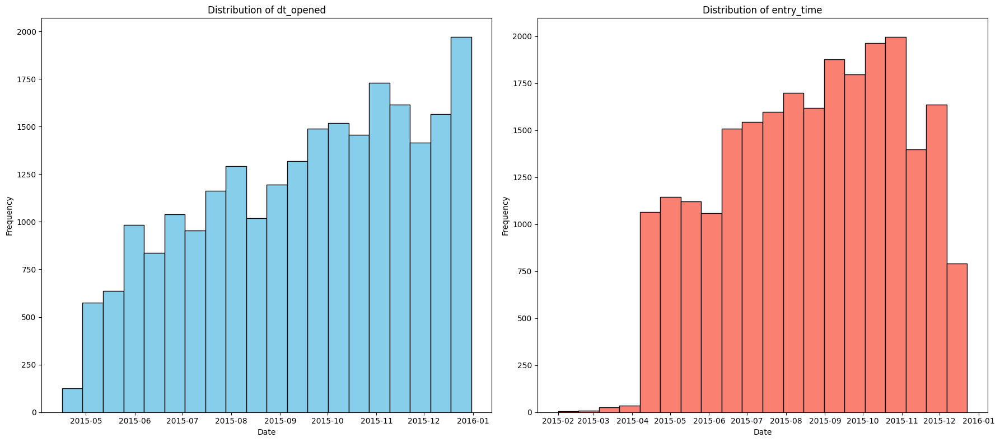

In [66]:
# Step 2: Plot the distribution of datetime columns
import matplotlib.pyplot as plt

# Plotting the distribution of 'dt_opened' and 'entry_time'
plt.figure(figsize=(18, 8))

# Plot for 'dt_opened'
plt.subplot(1, 2, 1)
plt.hist(cust_demographics['dt_opened'].dropna(), bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of dt_opened')
plt.xlabel('Date')
plt.ylabel('Frequency')

# Plot for 'entry_time'
plt.subplot(1, 2, 2)
plt.hist(cust_demographics['entry_time'].dropna(), bins=20, color='salmon', edgecolor='black')
plt.title('Distribution of entry_time')
plt.xlabel('Date')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

### Categorical columns

In [76]:
# For each categorical column, check the unique values and their frequency
categorical_columns = cust_demographics.select_dtypes(include=['object']).columns  # List all object columns
for col in categorical_columns:
    print(f"Column: {col}")
    print(f"Unique Values: {cust_demographics[col].nunique()}")
    print(cust_demographics[col].value_counts())
    print("-" * 50)

Column: customer_no
Unique Values: 23896
customer_no
1        1
15929    1
15938    1
15937    1
15936    1
        ..
7963     1
7962     1
7961     1
7960     1
23896    1
Name: count, Length: 23896, dtype: int64
--------------------------------------------------
Column: feature_1
Unique Values: 8
feature_1
Platinum Maxima    9056
Platinum Deligh    8541
Titanium Deligh    5943
RBL Bank Fun+       218
Insignia             67
Golf Card            30
Platinum Cricke      26
                     15
Name: count, dtype: int64
--------------------------------------------------
Column: feature_3
Unique Values: 263
feature_3
       2836
694     606
676     560
682     511
705     476
       ... 
860       1
601       1
836       1
612       1
843       1
Name: count, Length: 263, dtype: int64
--------------------------------------------------
Column: feature_4
Unique Values: 4
feature_4
3    14593
1     6913
2     2375
        15
Name: count, dtype: int64
------------------------------------

Unique Values: 965
feature_29
110059    1097
122001     975
110092     685
201301     625
110085     520
          ... 
711102       1
600008       1
600093       1
415205       1
400036       1
Name: count, Length: 965, dtype: int64
--------------------------------------------------
Column: feature_30
Unique Values: 53
feature_30
2010    1839
2012    1745
2013    1717
2000    1710
2011    1483
2014    1320
2005    1319
2009    1026
2007     836
1995     823
2008     801
1990     791
1985     683
2006     480
2003     467
1980     395
1984     393
2015     389
1987     388
1986     378
1988     364
2004     352
1989     332
2001     324
2002     292
1983     286
1999     285
1982     283
1981     215
1991     179
1979     170
1975     162
1992     158
1998     149
1978     149
1964     144
1993     122
1997     110
1976     104
1977     103
1974      87
1994      85
1996      72
1970      72
1973      64
1972      51
1969      50
1971      39
1965      29
1968      26
1966      22
1967

feature_63
2010-0    1670
2012-0    1567
2013-0    1524
2000-0    1499
2011-0    1338
          ... 
2001-5       1
1970-3       1
1970-5       1
1984-7       1
1999-6       1
Name: count, Length: 492, dtype: int64
--------------------------------------------------
Column: feature_64
Unique Values: 28
feature_64
10    10257
33     3154
2      2511
13     2067
21     2060
12      945
5       746
17      547
31      433
26      175
29      165
34      155
16      152
35      141
20      123
28       68
14       64
18       35
4        23
15       21
7        15
         15
6         8
22        7
25        5
23        2
11        1
8         1
Name: count, dtype: int64
--------------------------------------------------
Column: feature_65
Unique Values: 425
feature_65
157     10257
14       2121
41       1162
15       1114
39        994
        ...  
1210        1
182         1
541         1
527         1
179         1
Name: count, Length: 425, dtype: int64
-------------------------------

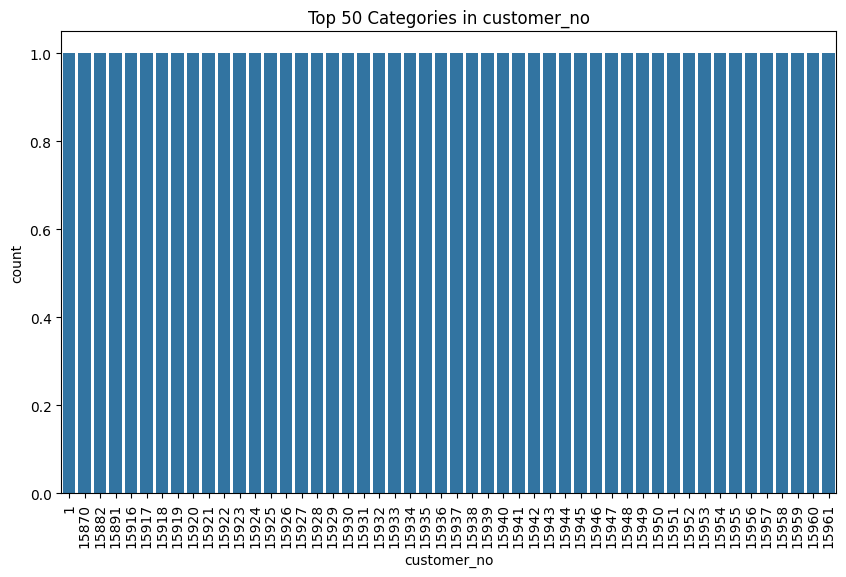

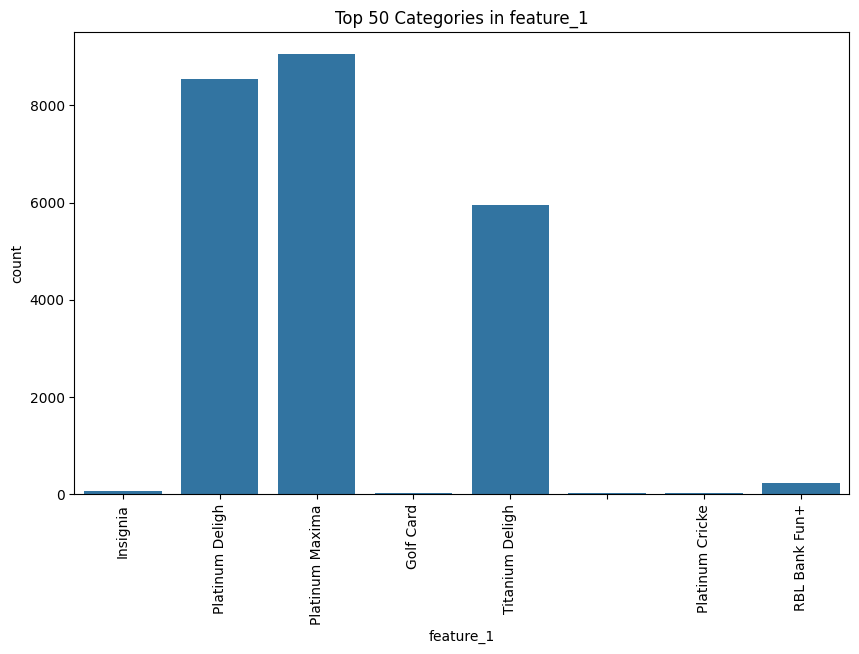

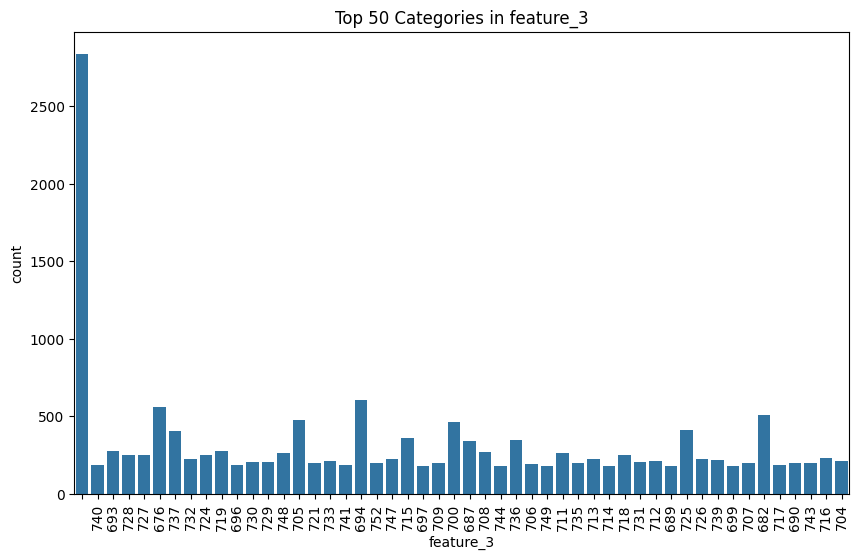

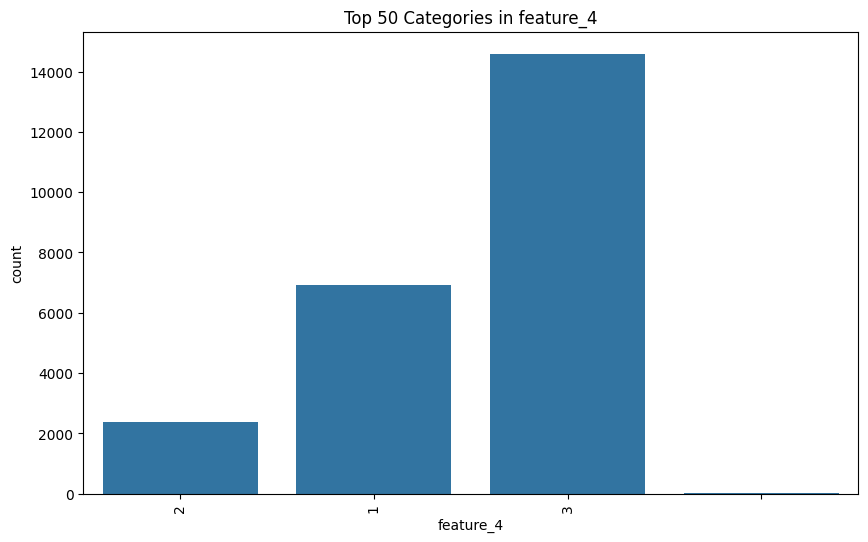

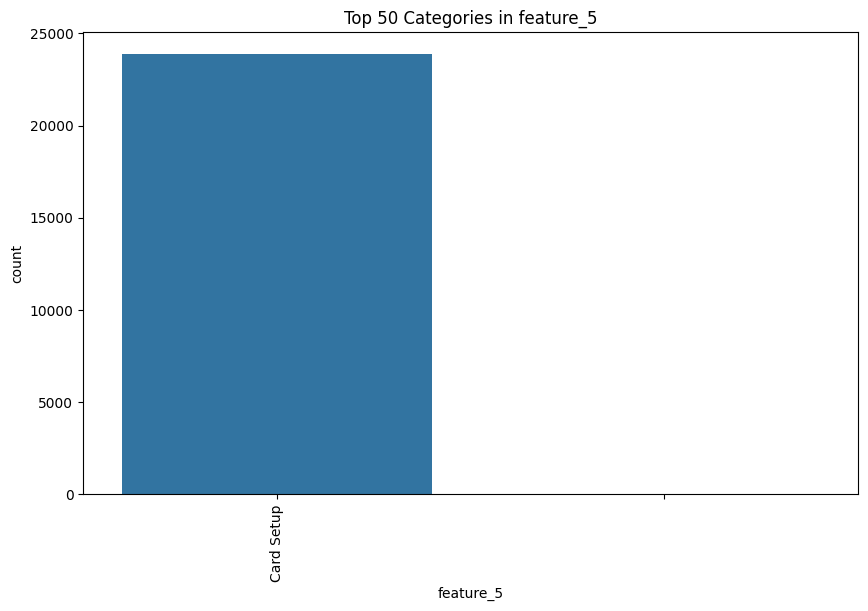

...

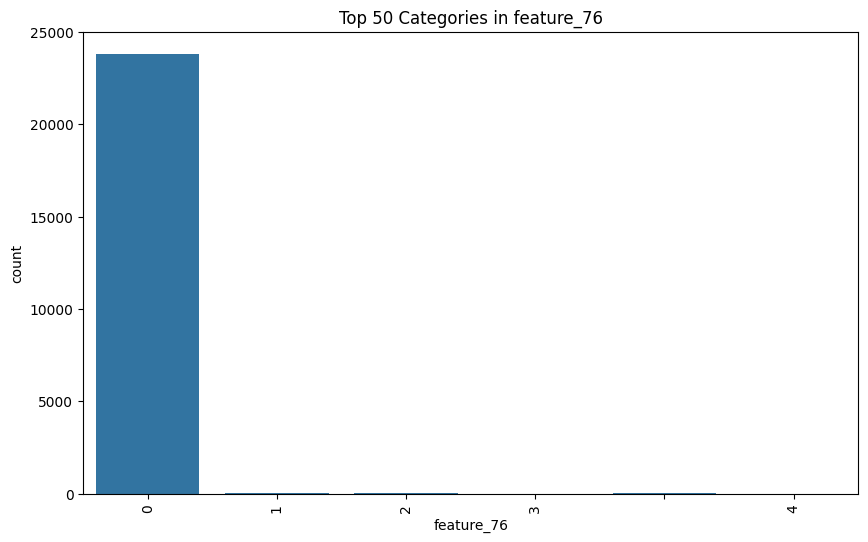

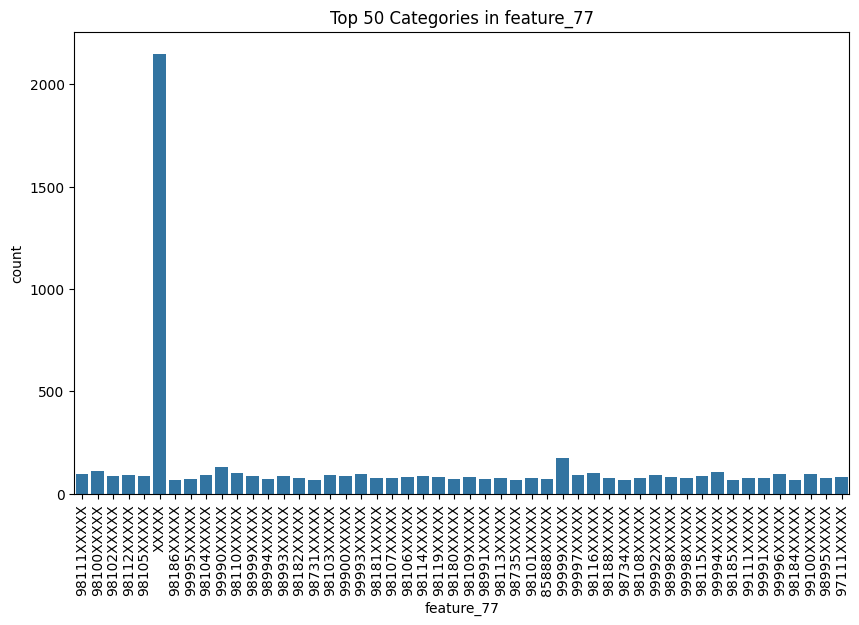

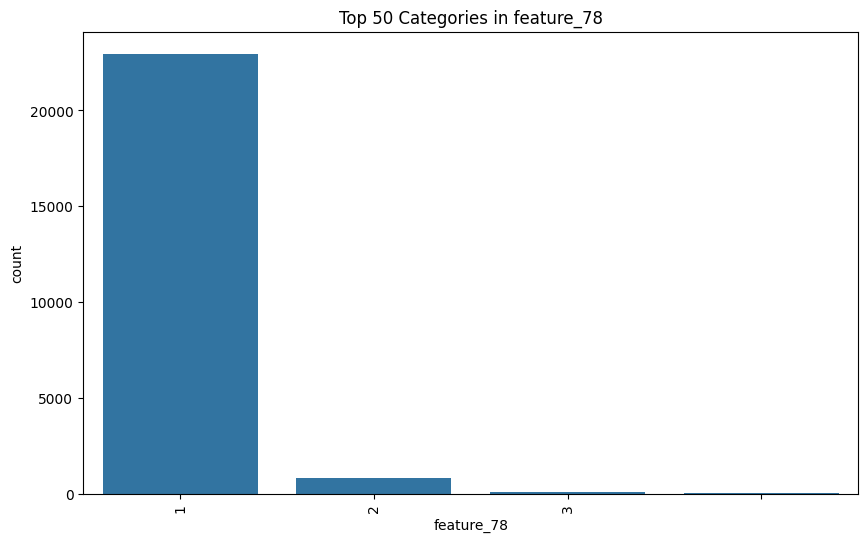

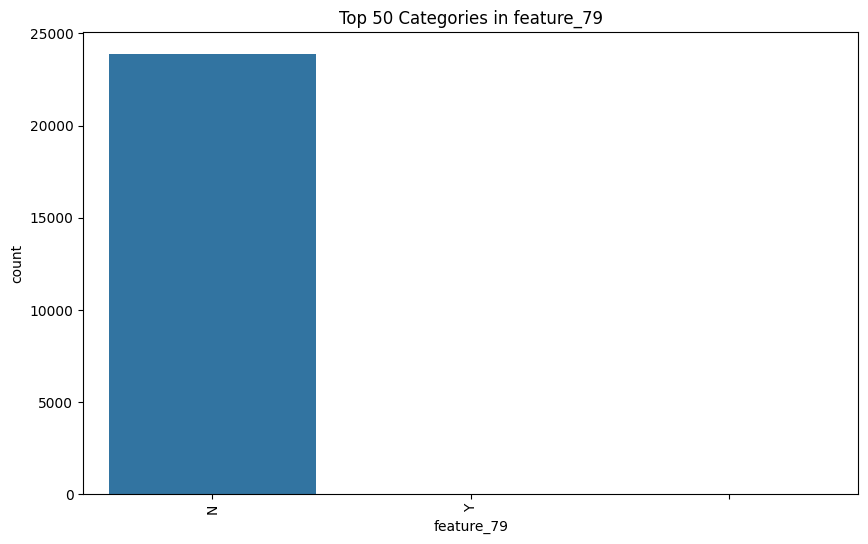

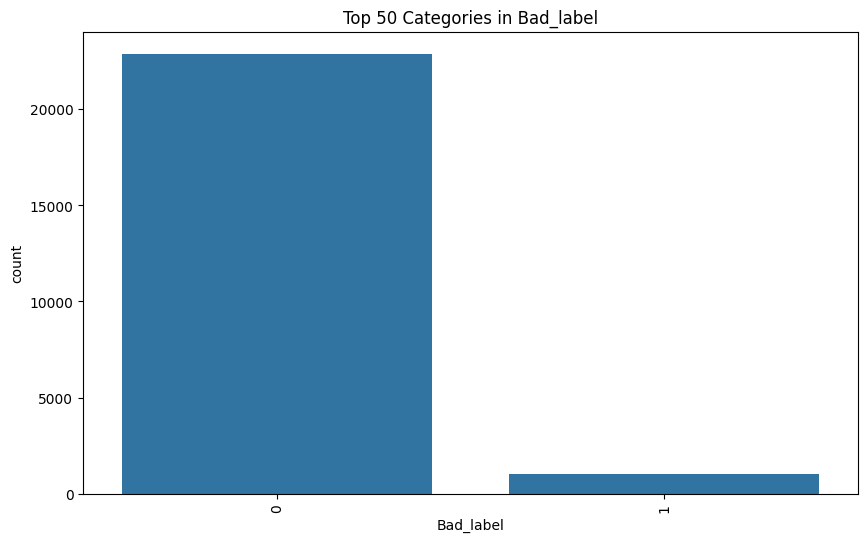

In [74]:
top_n = 50  # Choose top N categories to plot
for col in categorical_columns:
    top_categories = cust_demographics[col].value_counts().nlargest(top_n).index
    plt.figure(figsize=(10, 6))
    sns.countplot(data=cust_demographics[cust_demographics[col].isin(top_categories)], x=col)
    plt.title(f"Top {top_n} Categories in {col}")
    plt.xticks(rotation=90)
    plt.show()

1. customer_no
Unique Values: 23,896
This column seems to represent unique customer identifiers. Every customer has one unique customer_no, with no repeated entries. No categorical analysis is required for this column as it is likely an identifier.
2. feature_1
Unique Values: 8
Categories:
Platinum Maxima: 9,056
Platinum Deligh: 8,541
Titanium Deligh: 5,943
Other categories have much fewer counts.
This column seems to represent different product or service plans. The most common categories are Platinum Maxima and Platinum Deligh, with smaller categories likely representing niche plans.
3. feature_3
Unique Values: 263
The column shows several numeric values with varying frequencies, but there are values with only one occurrence.
This could be a code or identifier for a specific service or product. The spread suggests it might need grouping or mapping to higher-level categories, depending on business context.
4. feature_4
Unique Values: 4
Categories:
3: 14,593
1: 6,913
2: 2,375
This column has a limited number of categories, with one dominant category (3). It could be representing a classification, e.g., status or tier, where 3 is the most frequent value.
5. feature_5
Unique Values: 2
Categories:
Card Setup: 23,881
Missing: 15
The values suggest it could be a flag indicating whether the card setup has been completed, with only one valid category.
6. feature_6
Unique Values: 2
Categories:
14: 23,881
Missing: 15
Similar to feature_5, this seems to be a flag with one consistent value (14). There is likely little to analyze here.
7. feature_7
Unique Values: 485
The column represents numerical values (like amounts or scores) categorized into 485 unique values. Some categories are more frequent, like 35000, 50000, and 150000, while others are quite rare.
This could represent a monetary or numerical feature with wide variance in its range, which may need scaling for further modeling.
8. feature_8
Unique Values: 20
Categories:
ROTVR: 22,635
Other values with fewer counts.
The most frequent category is ROTVR, while others are much less frequent. This may represent a specific feature like Status or Action Code, with certain categories more commonly occurring.
9. feature_9
Unique Values: 20
Categories:
Missing: 22,635
Negative Office Tele Verification: 336
Negative Mobile Tele Verification: 249
Contactability Failure at Residence: 166
The remaining categories appear less frequently.
This seems to represent validation statuses, with most records missing the value and some indicating specific issues with verification.
10. feature_10
Unique Values: 8
Categories:
Missing: 23,845
Other values appear as large numerical values.
This column likely has mostly missing values or erroneous entries. You might need to investigate how these values were generated.
11. feature_11
Unique Values: 3
Categories:
Y: 22,611
N: 1,270
Missing: 15
A binary flag with Y being the most frequent. The missing values are minimal, and this column likely represents a yes/no condition.
12. feature_12
Unique Values: 17
Categories:
PM1: 8,853
PD1: 8,525
Other categories with fewer counts.
This could represent a code or label for specific processes or groups, with a few values being significantly more frequent.
Column: feature_13
Unique Values: 15
Most Frequent Values:
13004 appears most frequently (occurs the most)
Other less frequent values include PD3, TD3, and various PM/TD/PD/IS types.
Interpretation: The column likely represents a categorical feature with many similar types or codes. Some values (e.g., 13004) are significantly more common than others, which may indicate a dominant category or a frequent status.
Column: feature_14
Unique Values: 3
Values Distribution:
12 appears the most (10,892 times).
0 and blank/empty values also have non-negligible counts.
Interpretation: This column likely represents a binary or ternary coded variable, with 12 being the dominant category, suggesting a prominent classification or status for most of the data.
Column: feature_15
Unique Values: 365
Most Frequent Values:
SA03 occurs 9,331 times.
Other common values include SA05, SA01, and SA40, which suggest a regular pattern with some variability.
Interpretation: The column seems to represent different categories or identifiers (e.g., product types, services, or regions), where SA03 is the most frequently encountered, potentially a popular option or service.
Column: feature_16
Unique Values: 523
Most Frequent Values:
AS19, MA01, and AS16 are among the most frequent.
Interpretation: Similar to feature_15, this column contains identifiers that are likely related to specific types or categories, possibly tracking various identifiers like regions, products, or other categorical data.
Column: feature_17
Unique Values: 303
Most Frequent Values:
The most frequent value is blank or null (28,869 occurrences), indicating missing or unspecified data.
Other values such as 5622, 5736, and 5787 occur less frequently.
Interpretation: This column has many missing or unspecified values, which could be a source of data quality issues. The rest of the values represent various non-missing identifiers or categories.
Column: feature_18
Unique Values: 13
Values Distribution:
A high number of rows have missing or blank values (23,878).
Other values like 180, 113, and 91 appear infrequently.
Interpretation: The majority of the entries in this column are missing or blank, with very few meaningful categories present.
Column: feature_19
Unique Values: 3
Values Distribution:
The value 1 appears overwhelmingly (22,701 occurrences).
2 occurs less frequently, while blank values are also present.
Interpretation: This feature is most likely binary or ternary, with most of the data labeled as category 1. This suggests a strong bias toward category 1, which could indicate a primary category or classification.
Column: feature_20
Unique Values: 10,610
Most Frequent Values:
The most frequent values are variations of "XXXXX", suggesting that many values are placeholders or invalid.
Interpretation: The column may contain a large number of invalid or generic entries, making it unreliable for analysis. The presence of "XXXXX" and other placeholders points to data quality issues.
Column: feature_22
Unique Values: 3,251
Most Frequent Values:
99999XXXXX and 99990XXXXX are frequent.
Interpretation: Similar to feature_20, this column appears to have many values that could be placeholders or coded values, potentially affecting the reliability of the data.
Column: feature_23
Unique Values: 3
Values Distribution:
N appears frequently (21,528).
Y occurs less frequently (2,353).
Interpretation: This is a binary feature where "N" is significantly more common, suggesting the data may represent a "No/Yes" type of response or flag.
Column: feature_24
Unique Values: 722
Most Frequent Values:
The most common email domains are @GMAIL.COM, @YAHOO.COM, and @YAHOO.CO.IN.
Interpretation: The column likely contains email addresses, with Gmail and Yahoo being the most common providers.
Column: feature_25
Unique Values: 3
Values Distribution:
1 occurs most frequently (18,295 times).
2 occurs less frequently, with a few blanks.
Interpretation: Another binary feature with a strong prevalence for the value 1.
Column: feature_26
Unique Values: 12
Values Distribution:
The most frequent value is 0 (15,503 times), followed by 2, 1, and others.
Interpretation: This is likely a categorical variable with multiple levels, where 0 is the most common category.
Column: feature_27
Unique Values: 11
Most Frequent Values:
Graduate is the most common (14,610 occurrences), followed by Post-Graduate and MBA/MMS.
Interpretation: This is a categorical feature representing education levels, with a significant portion of the data being labeled as "Graduate."
Column: feature_28
Unique Values: 63
Most Frequent Values:
New Delhi appears most frequently (12,539 occurrences).
Interpretation: This column seems to represent locations, with New Delhi being the most common, but other cities are also present in varying amounts.
Column: feature_29
Unique Values: 965
Most Frequent Values:
110059 is the most common, followed by other identifiers like 122001.
Interpretation: Likely representing unique IDs, with some entries occurring more frequently than others.
Column: feature_30
Unique Values: 53
Most Frequent Values:
The most common values are related to years (e.g., 2010, 2012, 2013, etc.).
Interpretation: This column likely represents years, with a strong prevalence of recent years, suggesting that the data might be time-sensitive or yearly based.
Feature_31:
Unique Values: 14
This feature seems to represent some categories or labels, potentially numerical or related to counts.
Handling: One-hot encoding or label encoding can be applied depending on whether the feature represents numerical categories or non-ordinal categories.
2. Feature_32:
Unique Values: 6
Categories like Self, Rente, Paren, etc., indicate that this column represents types of something, probably related to personal or financial information.
Handling: One-hot encoding for non-ordinal data, or label encoding if the order matters.
3. Feature_33:
Unique Values: 3
Binary categories Y (Yes) and N (No).
Handling: One-hot encoding is ideal, converting it into two binary columns, or label encoding as 1 and 0 for simplicity.
4. Feature_34:
Unique Values: 4
Possible ordinal values (1, 2, 3).
Handling: If there is a meaningful order, label encoding works, or if needed, one-hot encoding can also be used.
5. Feature_35:
Unique Values: 4334
This is likely a feature with many unique numeric values (potentially salaries or amounts).
Handling: No encoding is necessary. You may need scaling (e.g., MinMaxScaler or StandardScaler).
6. Feature_36:
Unique Values: 10
Categories of company types.
Handling: One-hot encoding or label encoding depending on whether the order of categories matters.
7. Feature_37:
Unique Values: 12
This feature likely indicates the industry or sector.
Handling: One-hot encoding would be effective, creating columns for each industry type.
8. Feature_38:
Unique Values: 5664
Job titles.
Handling: If job titles are important features for prediction, you can use techniques like target encoding or embedding, as there are a large number of unique values.
9. Feature_39:
Unique Values: 19
Years or numerical representation of dates.
Handling: If it's a continuous variable, no encoding is required. If it represents categories (like year), label encoding or binning can be applied.
10. Feature_40:
Unique Values: 14
This could be another categorical feature with meaningful values.
Handling: One-hot encoding or label encoding, depending on whether the values have an inherent order.
11. Feature_41:
Unique Values: 13
Categorical data, likely representing some classification.
Handling: One-hot encoding is the best approach here.
12. Feature_42:
Unique Values: 13
It might represent specific categories or regions.
Handling: One-hot encoding or label encoding.
13. Feature_43:
Unique Values: 71
Locations or cities.
Handling: One-hot encoding may become sparse here, so consider using label encoding, frequency encoding, or target encoding if it's important.
14. Feature_44:
Unique Values: 937
This could represent IDs, dates, or similar features.
Handling: Similar to feature_35, no encoding is required. Use techniques like hashing for IDs or numeric scaling.
15. Feature_45:
Unique Values: 4473
This looks like email addresses.
Handling: These can be ignored as a feature unless there's a requirement to extract domain names or provider info.
16. Feature_46:
Unique Values: 6
Categories related to identity documents.
Handling: One-hot encoding or label encoding based on whether order matters.
17. Feature_47:
Unique Values: 11250
This likely represents IDs or specific codes.
Handling: Similar to feature_45, treat it as an identifier or hash, unless you need to derive additional information from it.
18. Feature_48:
Unique Values: 57
This looks like a categorical feature with bank names.
Handling: One-hot encoding or target encoding if the banks are crucial for your model.
19. Feature_49:
Unique Values: 19
This might be some form of numeric data or encoded information.
Handling: If numeric, scaling would work best. If categorical, consider label encoding.
20. Feature_50:
Unique Values: 3
Binary categories Y (Yes) and N (No).
Handling: One-hot encoding or label encoding (1 for Y, 0 for N).
olumn: feature_51
Unique Values: 11
Action: This is a categorical column with different banks as values. You may want to encode it using label encoding or one-hot encoding depending on your modeling approach.
Column: feature_52
Unique Values: 660
Action: This looks like a numeric or continuous column. You may need to check for outliers or scale it if it's going to be used in certain models (e.g., SVM, k-NN).
Column: feature_53
Unique Values: 181
Action: This column appears to contain dates. You can convert this column to datetime format and extract features like year, month, day, or even day of the week for better model interpretability.
Column: feature_54
Unique Values: 2
Action: This seems to have two distinct values, one of which appears to be a date ("17-Jun-16") and the other might be missing or special values. You can replace or handle the missing value appropriately.
Column: feature_55
Unique Values: 5
Action: This could be an ordinal or categorical feature. Label encoding or one-hot encoding can be applied here based on the relationship between values.
Column: feature_56
Unique Values: 13
Action: This is likely a categorical variable. Consider label encoding or one-hot encoding depending on whether there's a meaningful order or not.
Column: feature_57
Unique Values: 3
Action: This seems like a binary feature (with values "Y" and "N"). You can map these to 1 and 0 for ease of processing.
Column: feature_58
Unique Values: 3
Action: Similar to feature_57, this binary categorical column can be encoded using 1 and 0.
Column: feature_59
Unique Values: 3
Action: Another binary feature, apply the same transformation as feature_57.
Column: feature_60
Unique Values: 3
Action: Again, this can be treated as a binary feature, mapping "Y" and "N" to 1 and 0.
Column: feature_61
Unique Values: 9
Action: This appears to be a categorical feature with multiple categories. Label encoding or one-hot encoding can be used here.
Column: feature_62
Unique Values: 3
Action: This seems like a binary feature, similar to feature_57 and feature_58, so it can be encoded to 1 and 0.
Column: feature_63
Unique Values: 492
Action: Likely a categorical variable with many categories. You may want to check if it's meaningful to apply one-hot encoding, or if grouping by top frequent categories would work.
Column: feature_64
Unique Values: 28
Action: This is a categorical feature with 28 distinct values. Label encoding or one-hot encoding could work here, depending on the nature of the categories.
Column: feature_65
Unique Values: 425
Action: Similar to feature_64, this is a categorical column with many distinct values. One-hot encoding could be used here after checking for feature importance.
Column: feature_66
Unique Values: 3013
Action: A high cardinality categorical column, which may require special handling such as feature hashing or grouping rare categories.
Column: feature_67
Unique Values: 3
Action: A binary feature, so encoding it to 1 and 0 is the best approach.
Column: feature_68
Unique Values: 4
Action: A categorical feature with four distinct values. Label encoding or one-hot encoding can be applied here.
Column: feature_69
Unique Values: 4334
Action: High cardinality. Feature hashing or grouping by frequency might be necessary here to avoid dimensionality issues.
Column: feature_70
Unique Values: 134
Action: This appears to be a date or categorical feature with many values. Consider converting it into a more meaningful form (e.g., month, year) or applying one-hot encoding if it's a category.
Column: feature_71
Unique Values: 14
Action: This is another categorical feature. Label encoding or one-hot encoding should work here.
Column: feature_72
Unique Values: 3
Action: A binary feature (likely "R", "O"), which can be encoded to 1 and 0.
Column: feature_73
Unique Values: 3
Action: This is another binary feature, so encoding it to 1 and 0 should be sufficient.
Column: feature_74
Unique Values: 4
Action: A categorical feature. Label encoding or one-hot encoding can be applied here.
Column: feature_75
Unique Values: 63
Action: This looks like a date column, with some unusual formats. You might need to standardize the format and extract features like day, month, or year.
Column: feature_76
Unique Values: 6
Action: This appears to be a categorical column. Label encoding or one-hot encoding can be used.
Column: feature_77
Unique Values: 3124
Action: High cardinality. Similar to feature_69, you might need to use feature hashing or frequency grouping.
Column: feature_78
Unique Values: 4
Action: Categorical feature. Label encoding or one-hot encoding can be applied.
Column: feature_79
Unique Values: 3
Action: A binary feature, which can be encoded to 1 and 0.
Column: Bad_label
Unique Values: 2
Action: This is the target variable with binary classes (0 and 1). No encoding is needed unless you're working with specific algorithms that require numerical labels.

# Bivariate Analysis - Categorical vs Categorical Columns

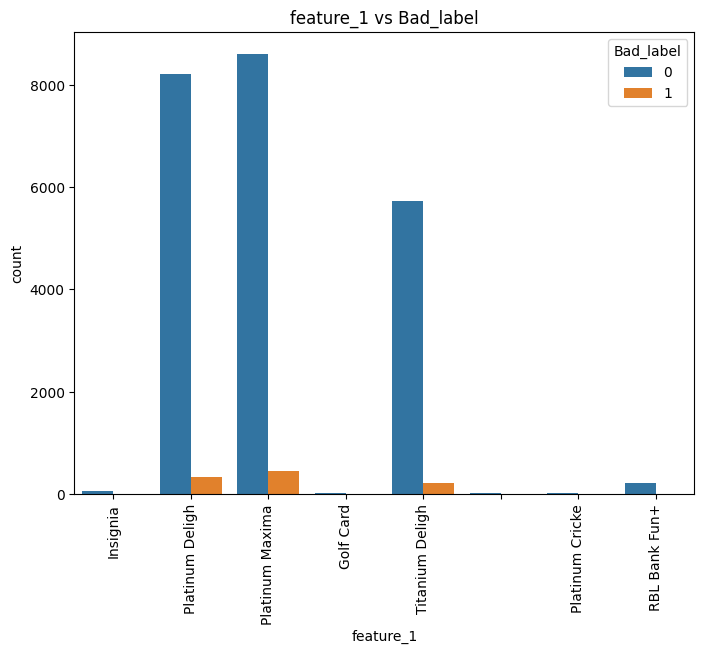

In [77]:
# Categorical vs Categorical plot for feature_1 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_1', hue='Bad_label')
plt.title('feature_1 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

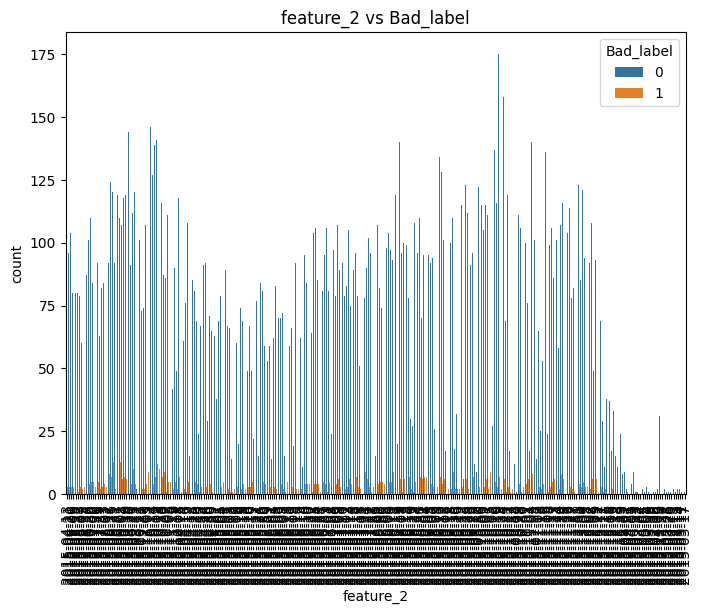

In [96]:
# Categorical vs Categorical plot for feature_2 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_2', hue='Bad_label')
plt.title('feature_2 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

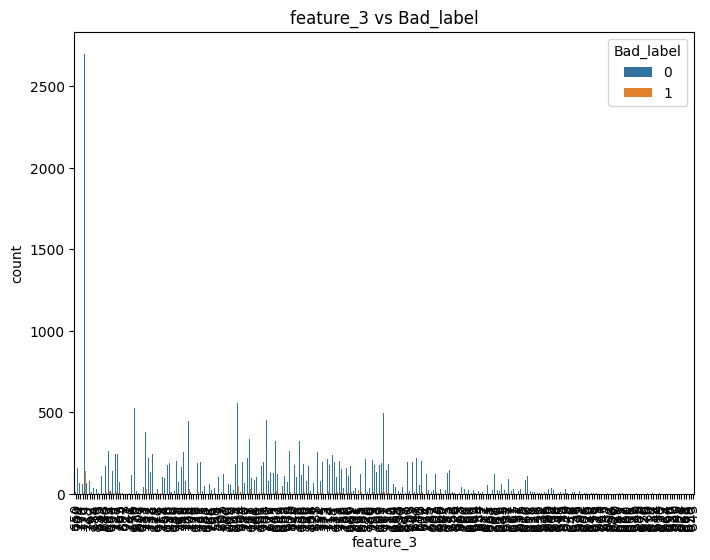

In [97]:
# Categorical vs Categorical plot for feature_3 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_3', hue='Bad_label')
plt.title('feature_3 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

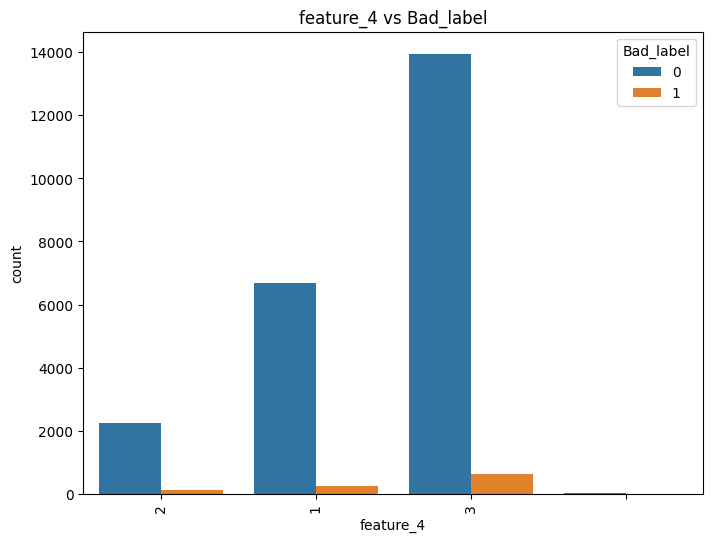

In [98]:
# Categorical vs Categorical plot for feature_4 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_4', hue='Bad_label')
plt.title('feature_4 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

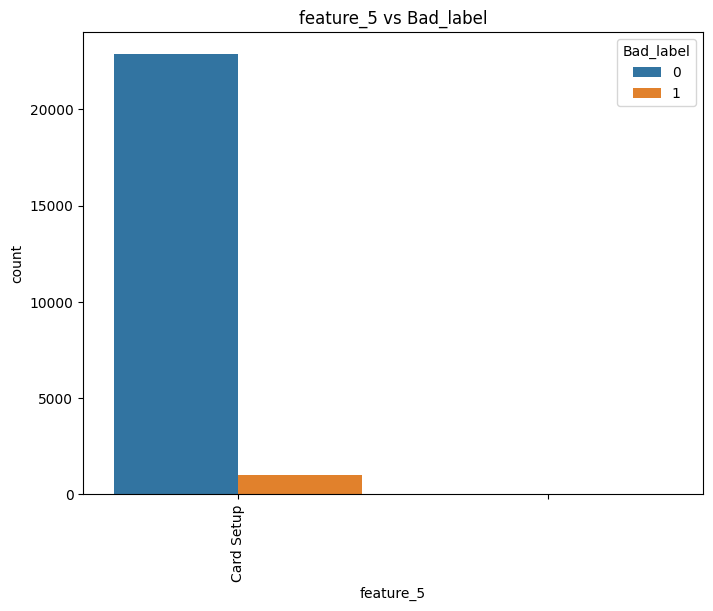

In [99]:
# Categorical vs Categorical plot for feature_5 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_5', hue='Bad_label')
plt.title('feature_5 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

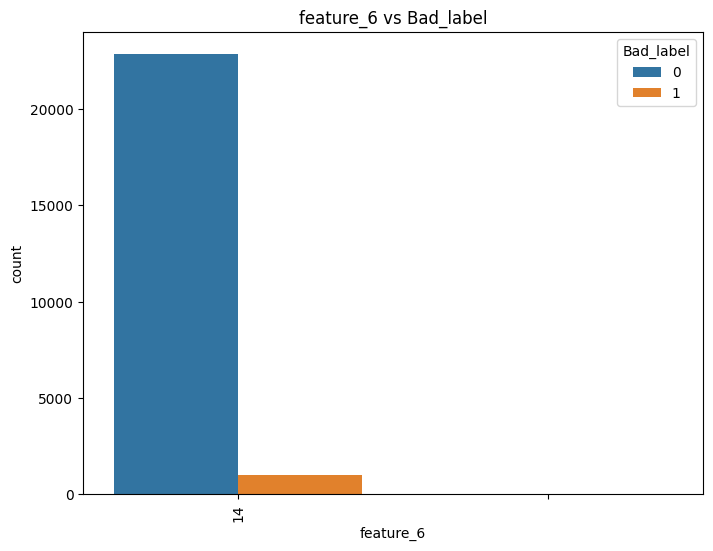

In [100]:
# Categorical vs Categorical plot for feature_6 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_6', hue='Bad_label')
plt.title('feature_6 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

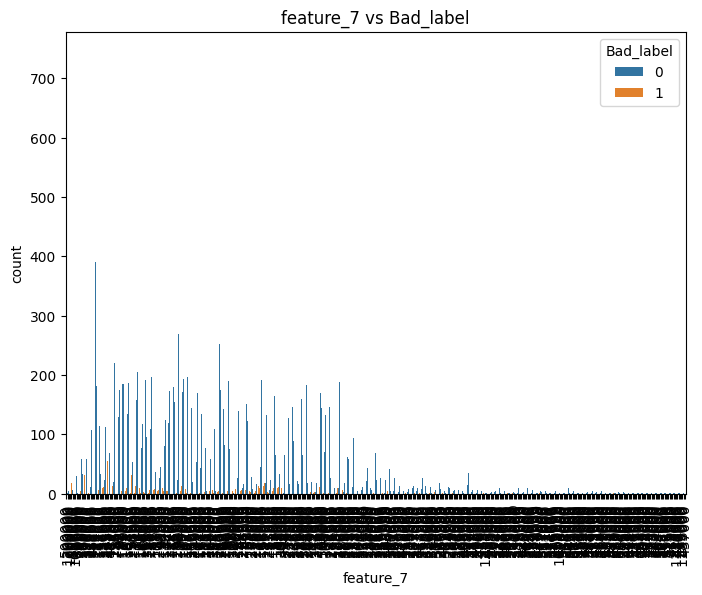

In [101]:
# Categorical vs Categorical plot for feature_7 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_7', hue='Bad_label')
plt.title('feature_7 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

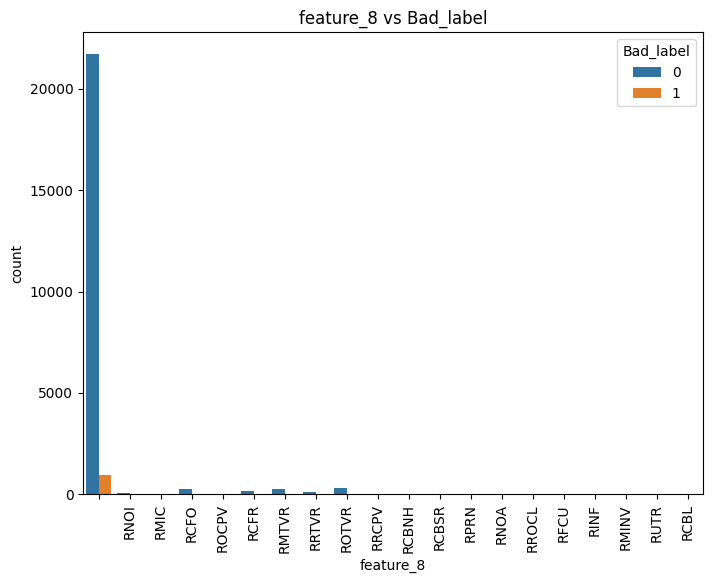

In [102]:
# Categorical vs Categorical plot for feature_8 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_8', hue='Bad_label')
plt.title('feature_8 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

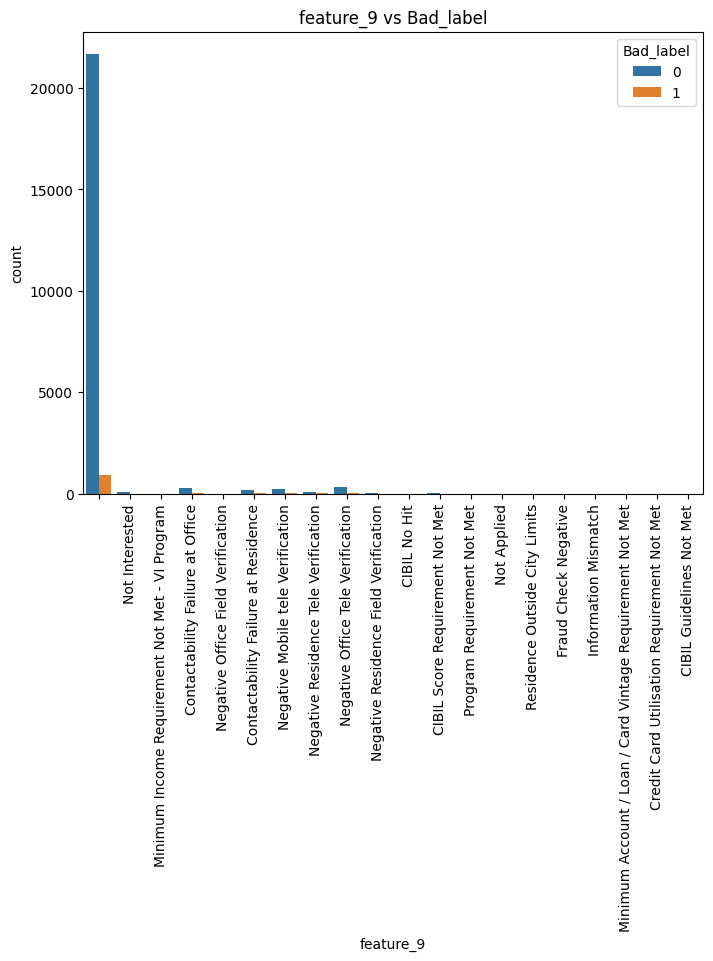

In [103]:
# Categorical vs Categorical plot for feature_9 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_9', hue='Bad_label')
plt.title('feature_9 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

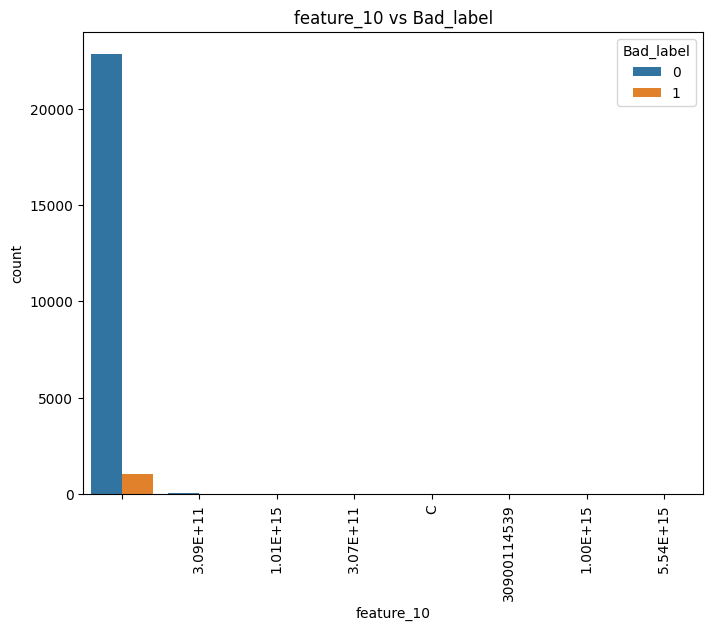

In [104]:
# Categorical vs Categorical plot for feature_10 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_10', hue='Bad_label')
plt.title('feature_10 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

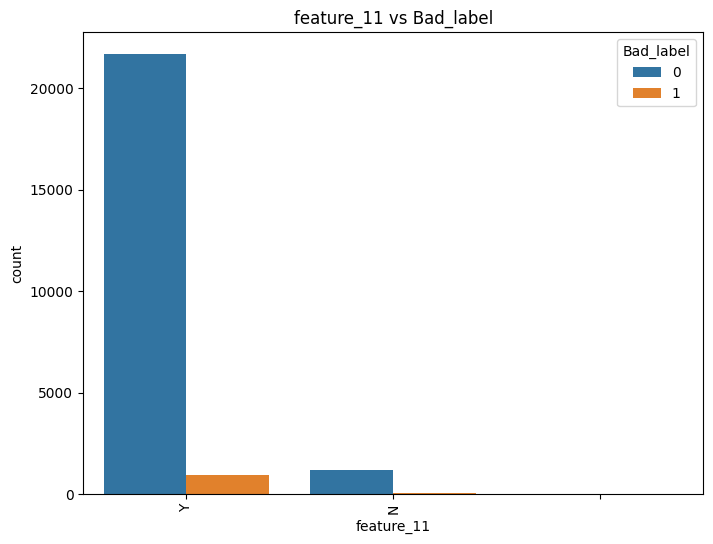

In [105]:
# Categorical vs Categorical plot for feature_11 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_11', hue='Bad_label')
plt.title('feature_11 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

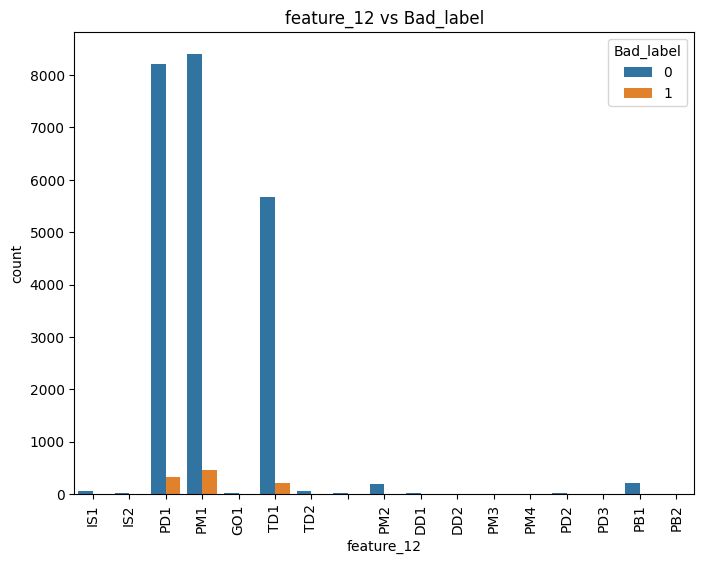

In [106]:
# Categorical vs Categorical plot for feature_12 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_12', hue='Bad_label')
plt.title('feature_12 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

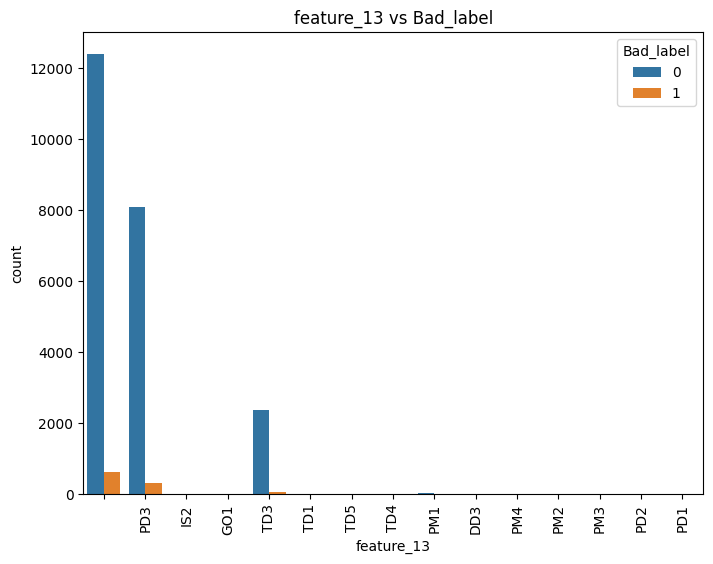

In [107]:
# Categorical vs Categorical plot for feature_13 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_13', hue='Bad_label')
plt.title('feature_13 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

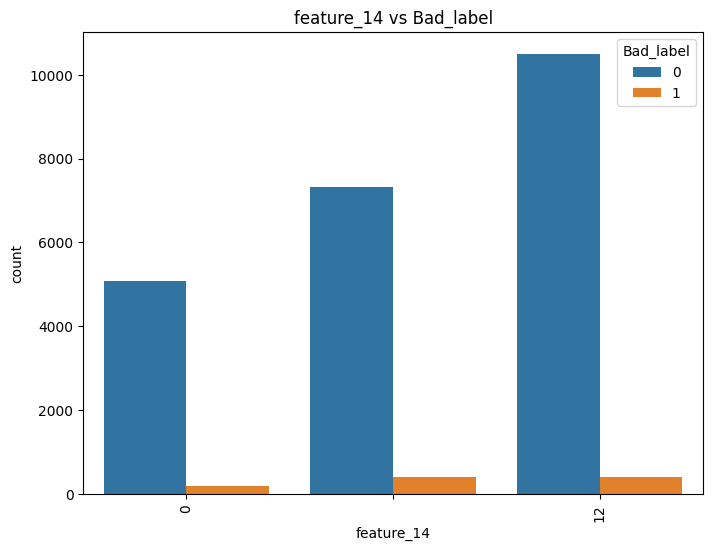

In [109]:
# Categorical vs Categorical plot for feature_14 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_14', hue='Bad_label')
plt.title('feature_14 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

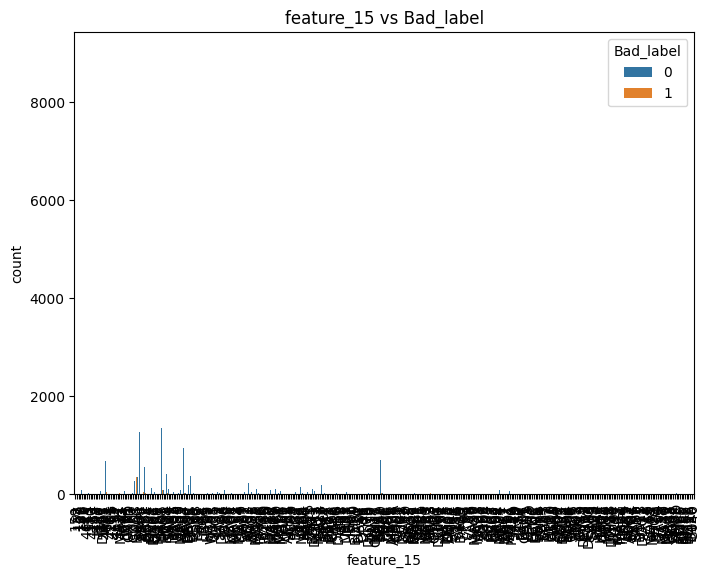

In [110]:
# Categorical vs Categorical plot for feature_15 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_15', hue='Bad_label')
plt.title('feature_15 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

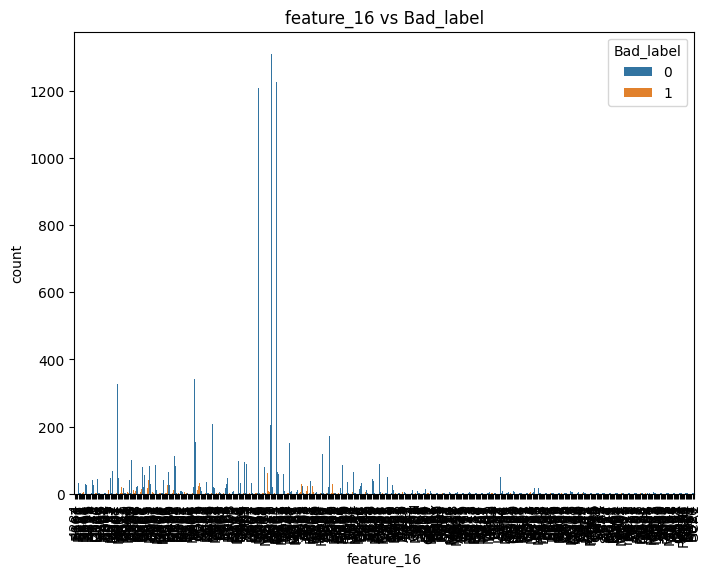

In [111]:
# Categorical vs Categorical plot for feature_16 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_16', hue='Bad_label')
plt.title('feature_16 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

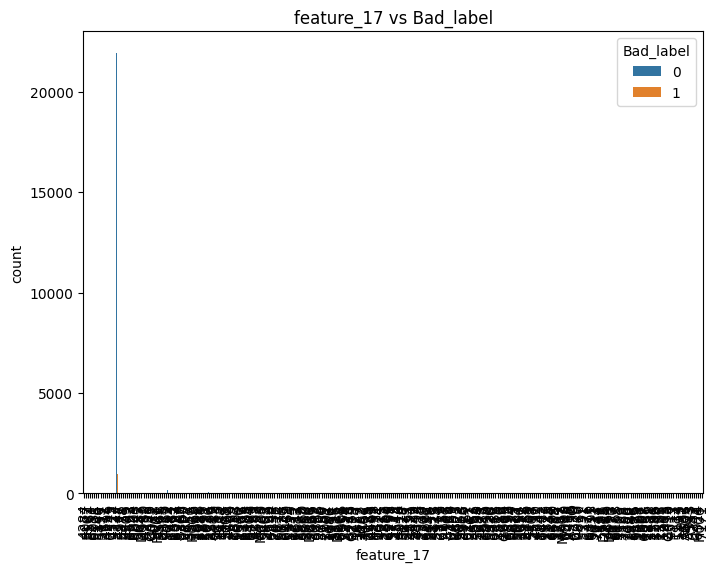

In [112]:
# Categorical vs Categorical plot for feature_17 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_17', hue='Bad_label')
plt.title('feature_17 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

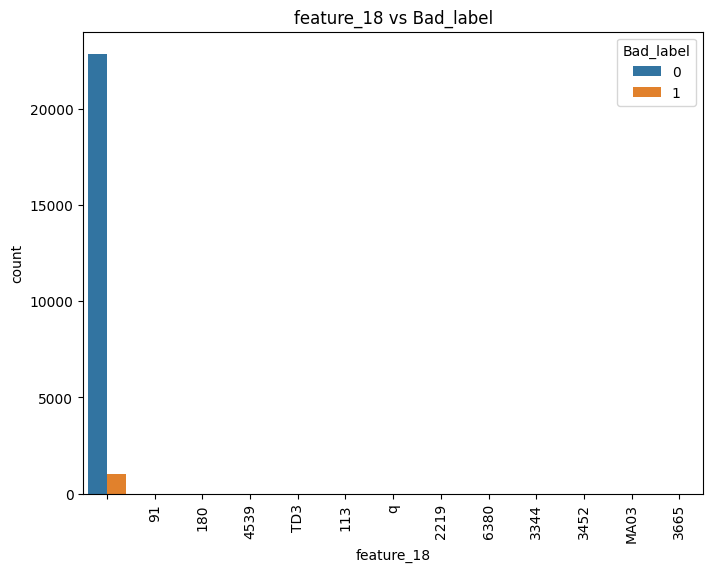

In [113]:
# Categorical vs Categorical plot for feature_18 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_18', hue='Bad_label')
plt.title('feature_18 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

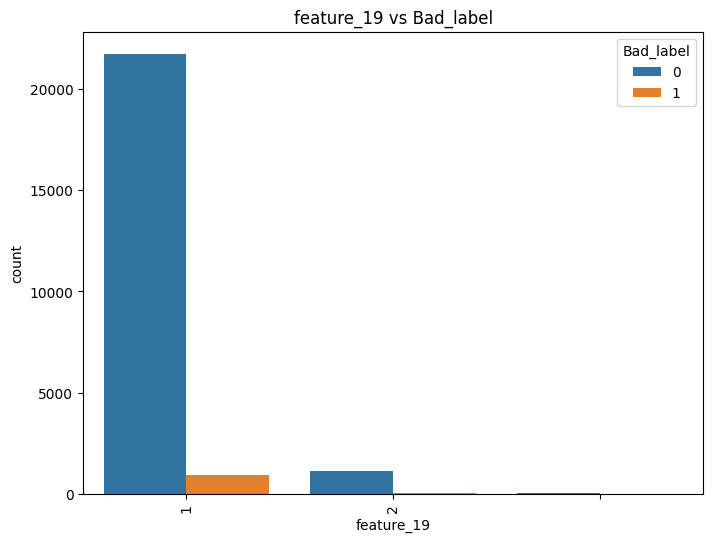

In [114]:
# Categorical vs Categorical plot for feature_19 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_19', hue='Bad_label')
plt.title('feature_19 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

In [116]:
# Categorical vs Categorical plot for feature_20 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_20', hue='Bad_label')
plt.title('feature_20 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

KeyboardInterrupt: 

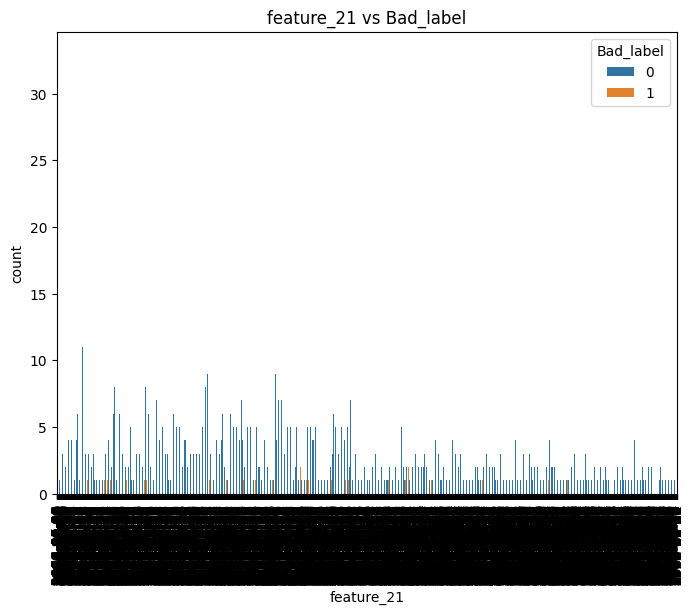

In [117]:
# Categorical vs Categorical plot for feature_21 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_21', hue='Bad_label')
plt.title('feature_21 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

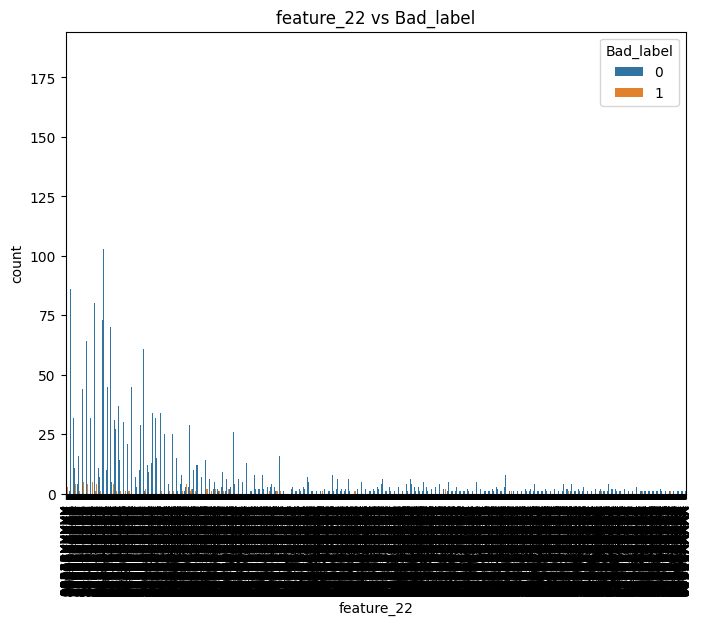

In [119]:
# Categorical vs Categorical plot for feature_22 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_22', hue='Bad_label')
plt.title('feature_22 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

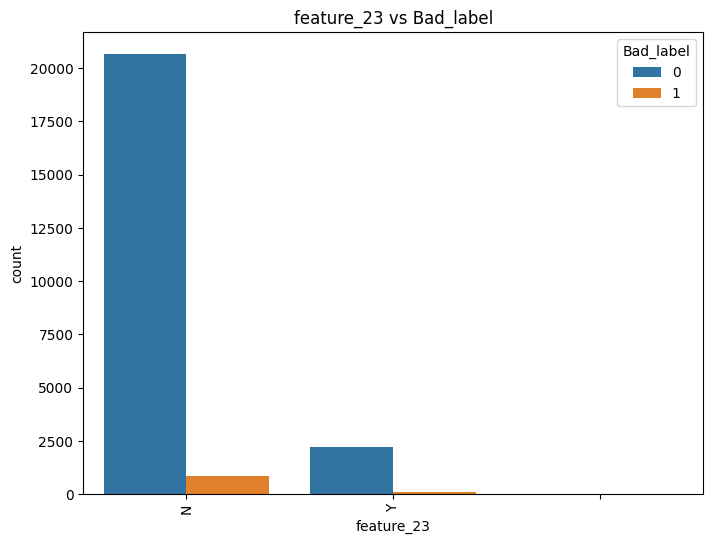

In [120]:
# Categorical vs Categorical plot for feature_23 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_23', hue='Bad_label')
plt.title('feature_23 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

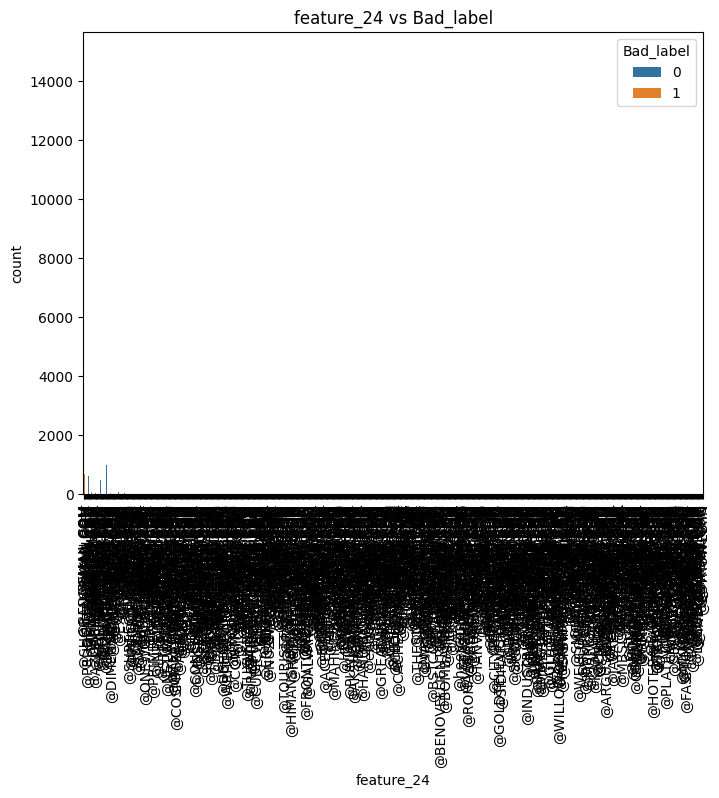

In [121]:
# Categorical vs Categorical plot for feature_24 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_24', hue='Bad_label')
plt.title('feature_24 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

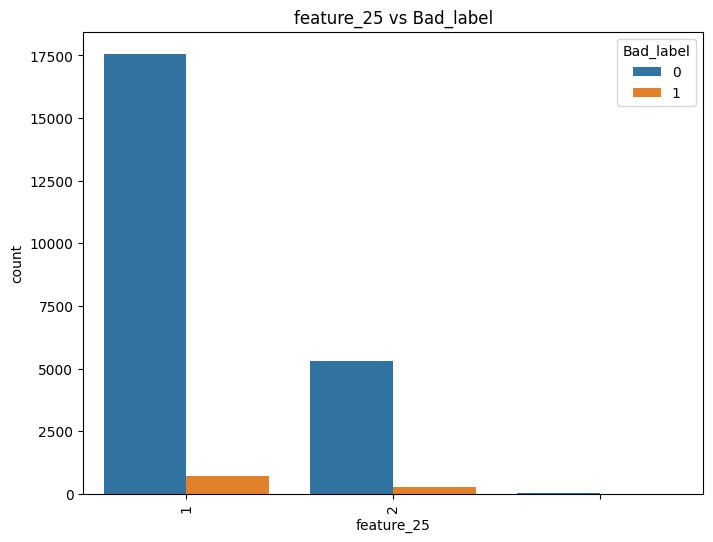

In [122]:
# Categorical vs Categorical plot for feature_25 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_25', hue='Bad_label')
plt.title('feature_25 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

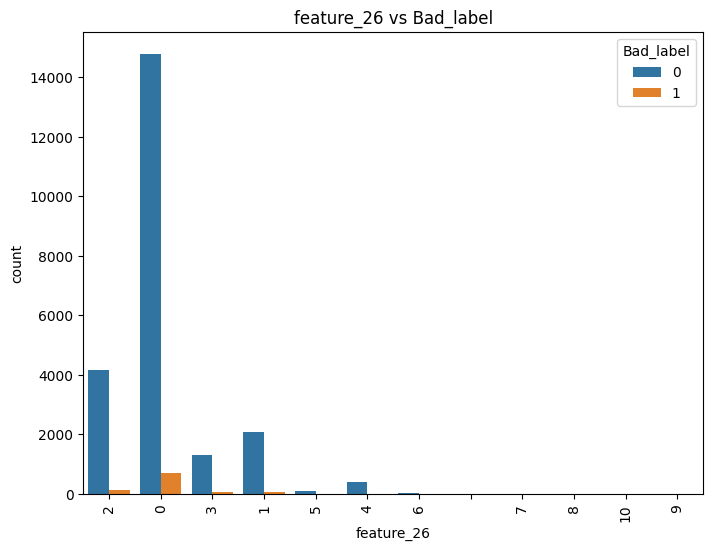

In [123]:
# Categorical vs Categorical plot for feature_26 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_26', hue='Bad_label')
plt.title('feature_26 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

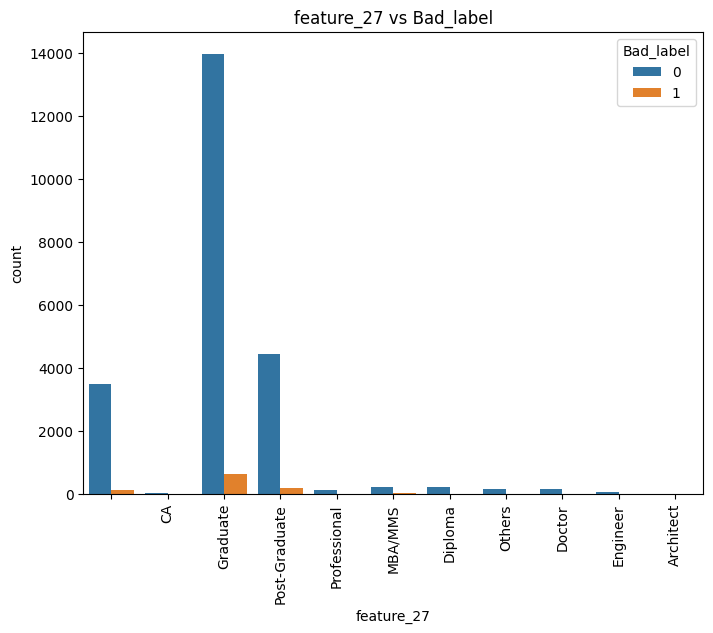

In [124]:
# Categorical vs Categorical plot for feature_27 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_27', hue='Bad_label')
plt.title('feature_27 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

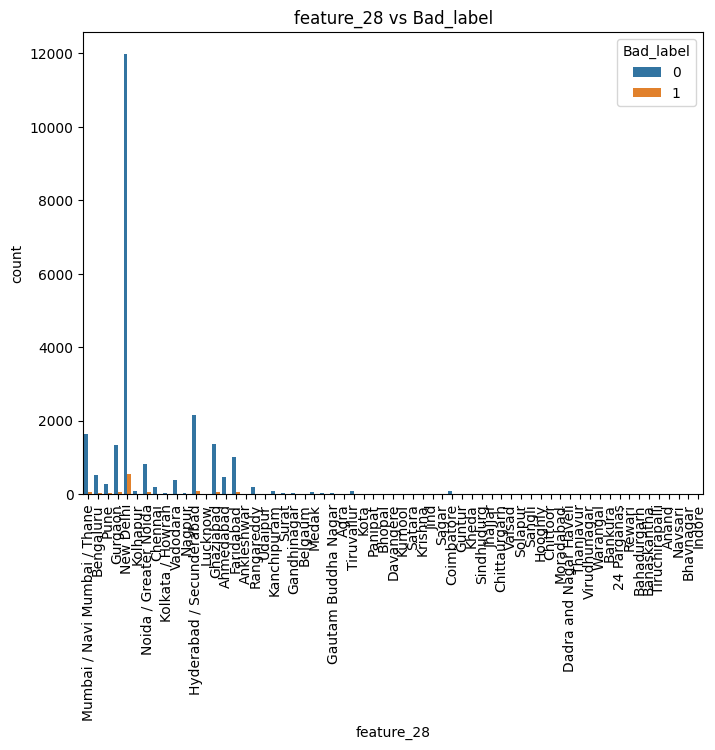

In [125]:
# Categorical vs Categorical plot for feature_28 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_28', hue='Bad_label')
plt.title('feature_28 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

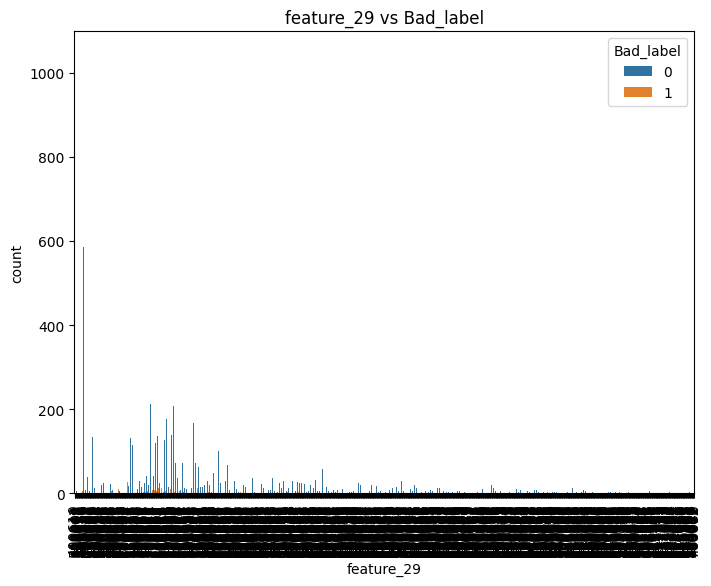

In [126]:
# Categorical vs Categorical plot for feature_29 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_29', hue='Bad_label')
plt.title('feature_29 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

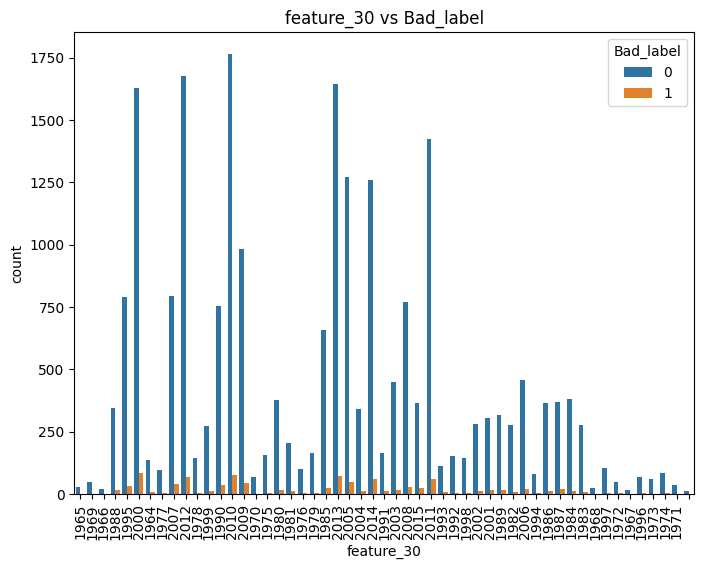

In [127]:
# Categorical vs Categorical plot for feature_30 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_30', hue='Bad_label')
plt.title('feature_30 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

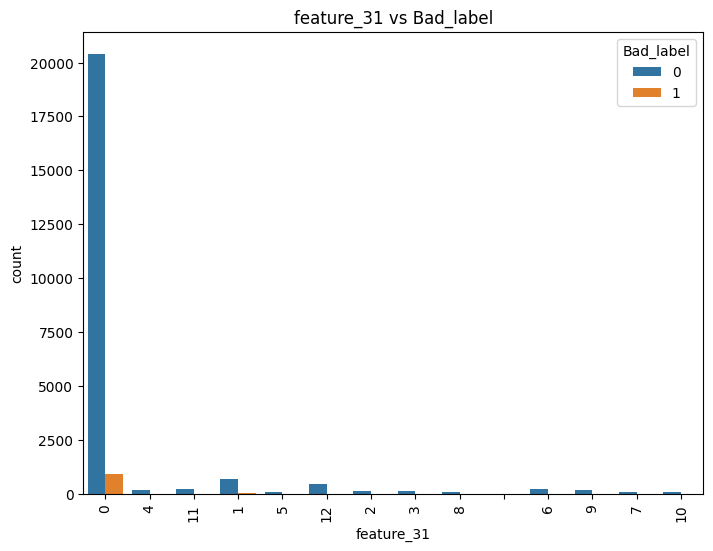

In [128]:
# Categorical vs Categorical plot for feature_31 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_31', hue='Bad_label')
plt.title('feature_31 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

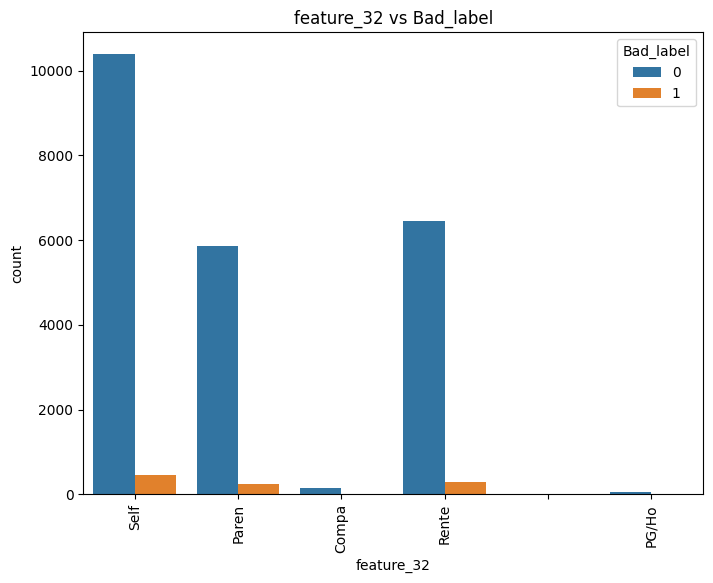

In [129]:
# Categorical vs Categorical plot for feature_32 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_32', hue='Bad_label')
plt.title('feature_32 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

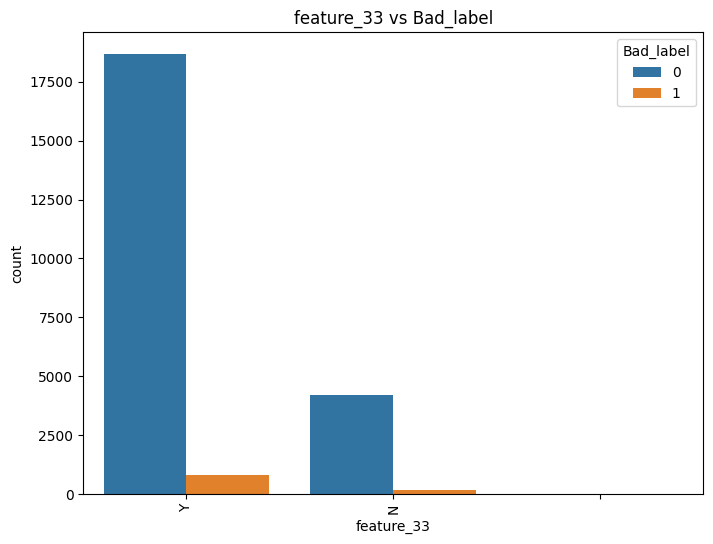

In [130]:
# Categorical vs Categorical plot for feature_33 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_33', hue='Bad_label')
plt.title('feature_33 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

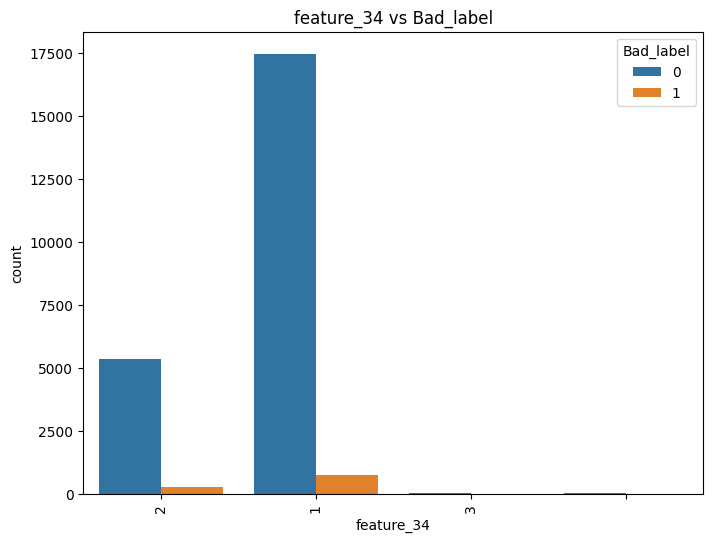

In [131]:
# Categorical vs Categorical plot for feature_34 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_34', hue='Bad_label')
plt.title('feature_34 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

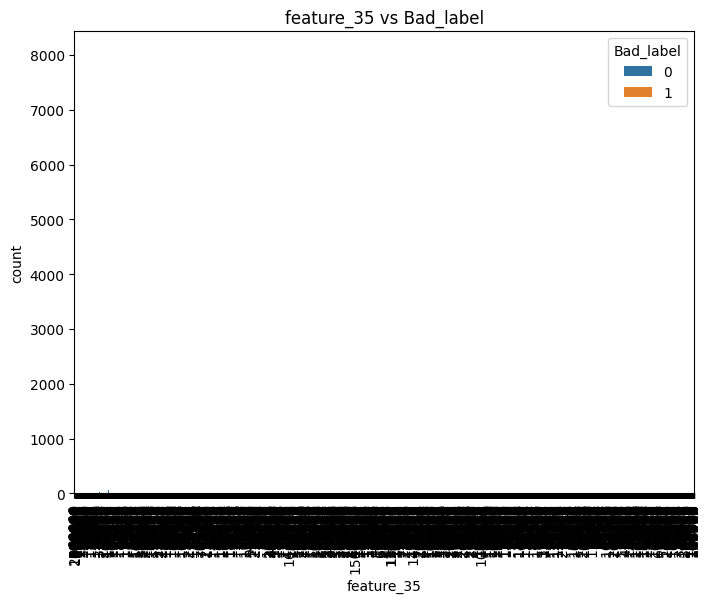

In [132]:
# Categorical vs Categorical plot for feature_35 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_35', hue='Bad_label')
plt.title('feature_35 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

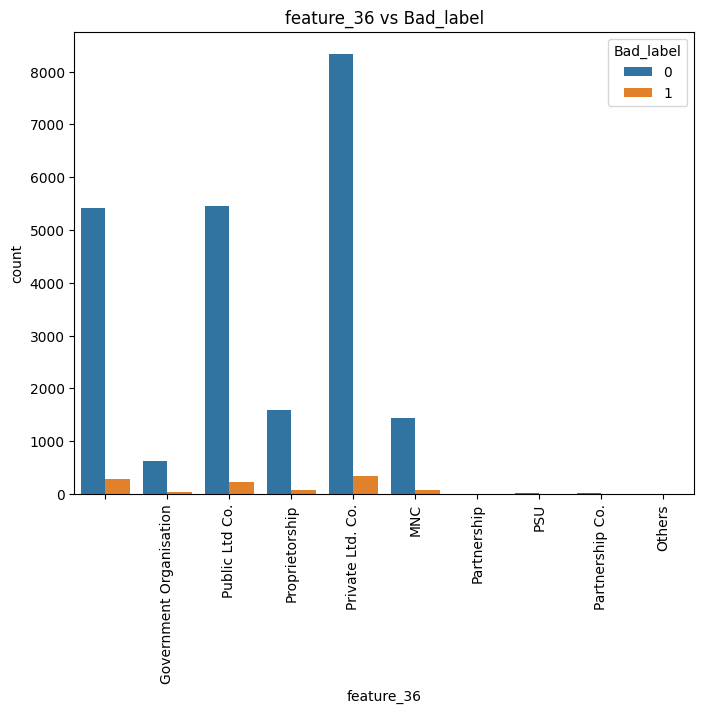

In [133]:
# Categorical vs Categorical plot for feature_36 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_36', hue='Bad_label')
plt.title('feature_36 vs Bad_label')
plt.xticks(rotation=90)
plt.show()


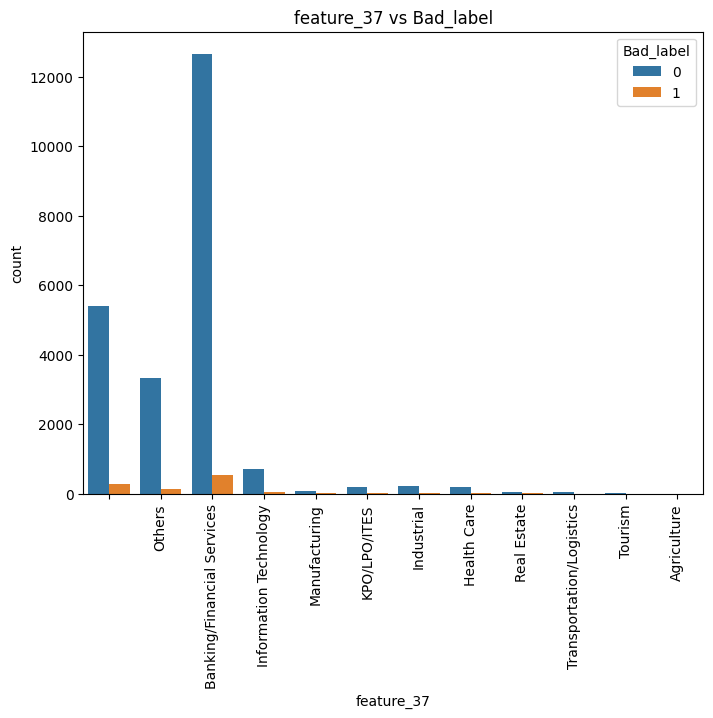

In [134]:
# Categorical vs Categorical plot for feature_37 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_37', hue='Bad_label')
plt.title('feature_37 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

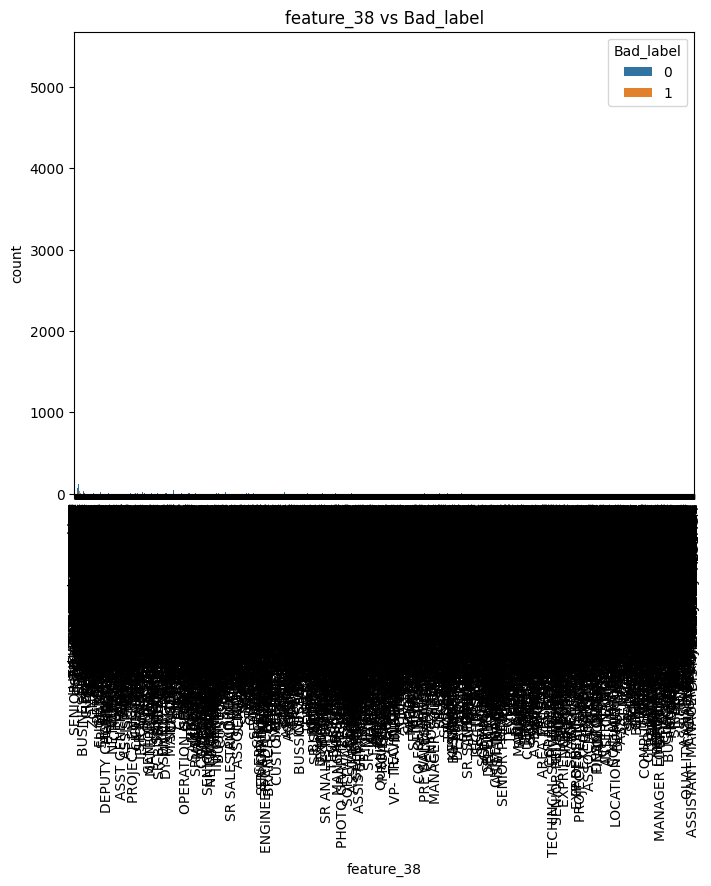

In [135]:
# Categorical vs Categorical plot for feature_38 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_38', hue='Bad_label')
plt.title('feature_38 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

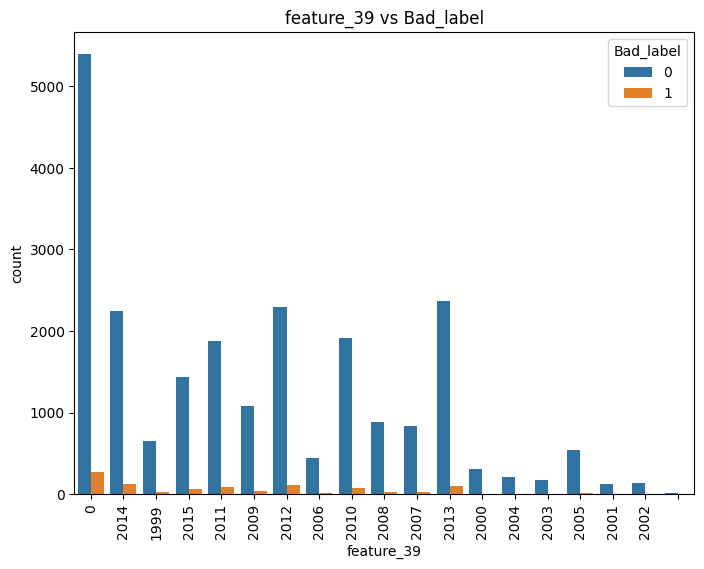

In [136]:
# Categorical vs Categorical plot for feature_39 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_39', hue='Bad_label')
plt.title('feature_39 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

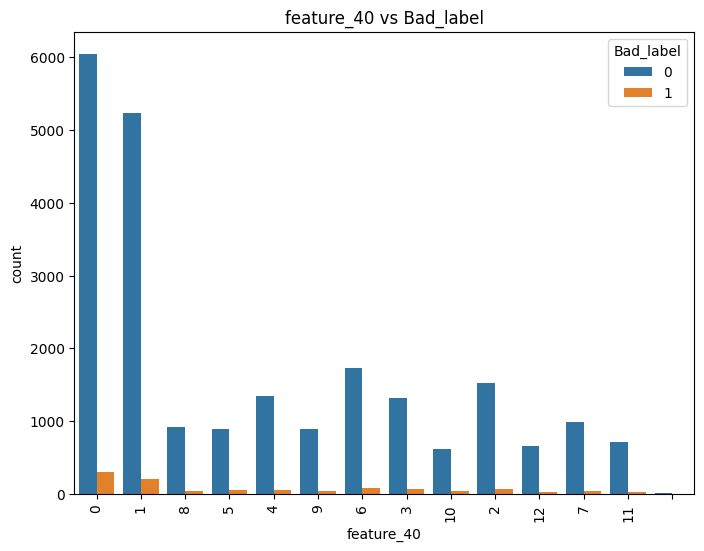

In [137]:
# Categorical vs Categorical plot for feature_40 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_40', hue='Bad_label')
plt.title('feature_40 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

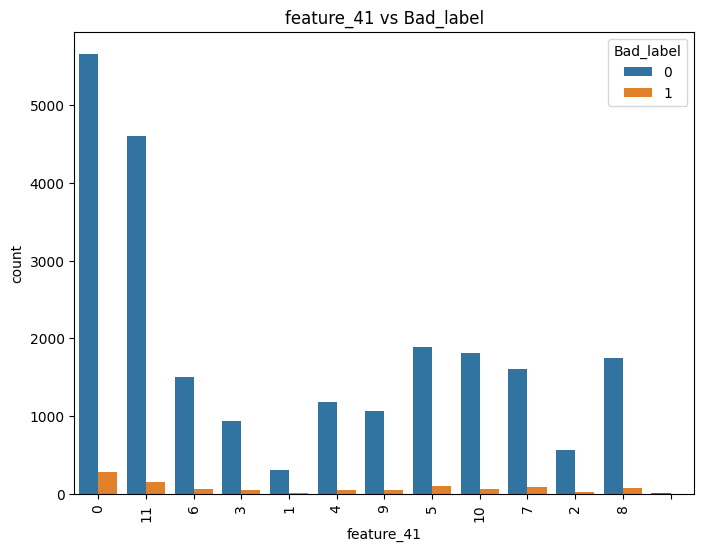

In [138]:
# Categorical vs Categorical plot for feature_41 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_41', hue='Bad_label')
plt.title('feature_41 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

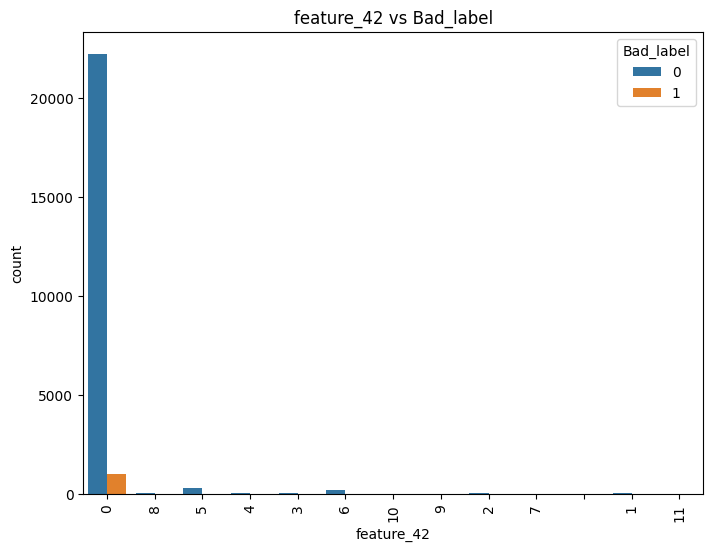

In [139]:
# Categorical vs Categorical plot for feature_42 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_42', hue='Bad_label')
plt.title('feature_42 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

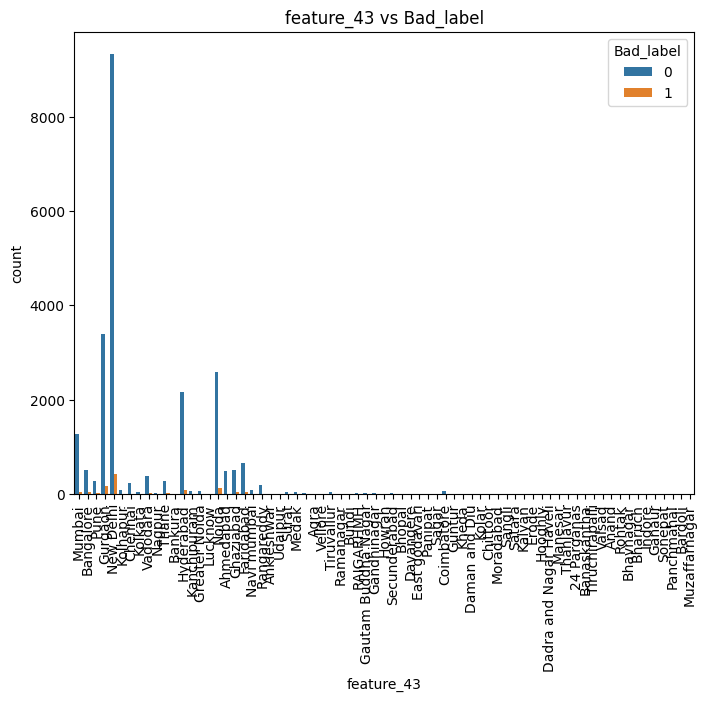

In [140]:
# Categorical vs Categorical plot for feature_43 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_43', hue='Bad_label')
plt.title('feature_43 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

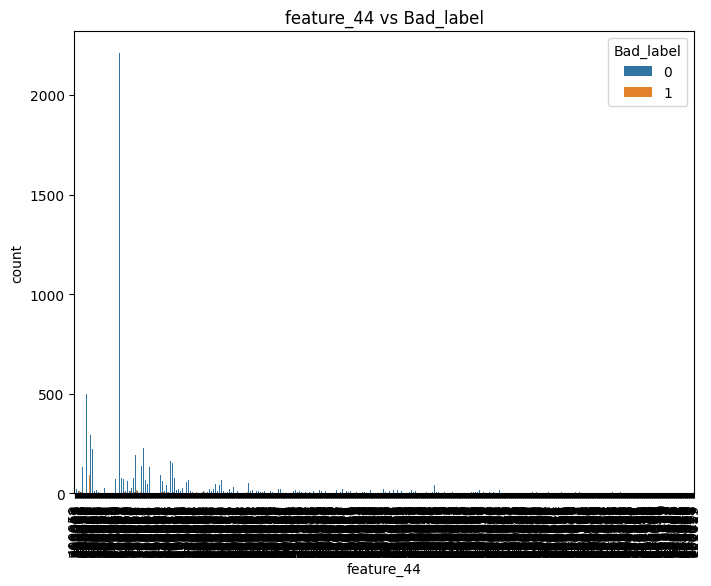

In [141]:
# Categorical vs Categorical plot for feature_44 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_44', hue='Bad_label')
plt.title('feature_44 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

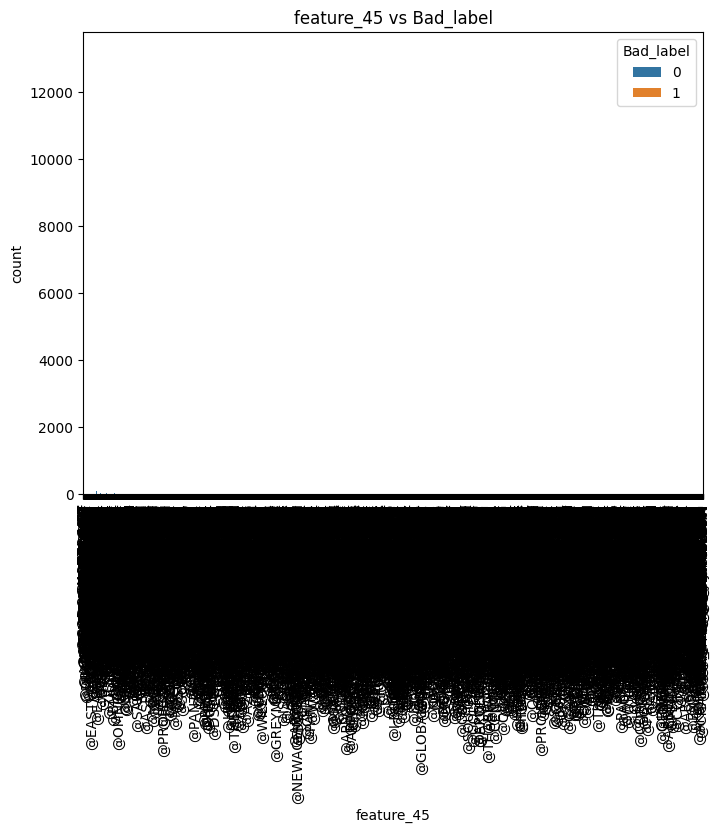

In [142]:
# Categorical vs Categorical plot for feature_45 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_45', hue='Bad_label')
plt.title('feature_45 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

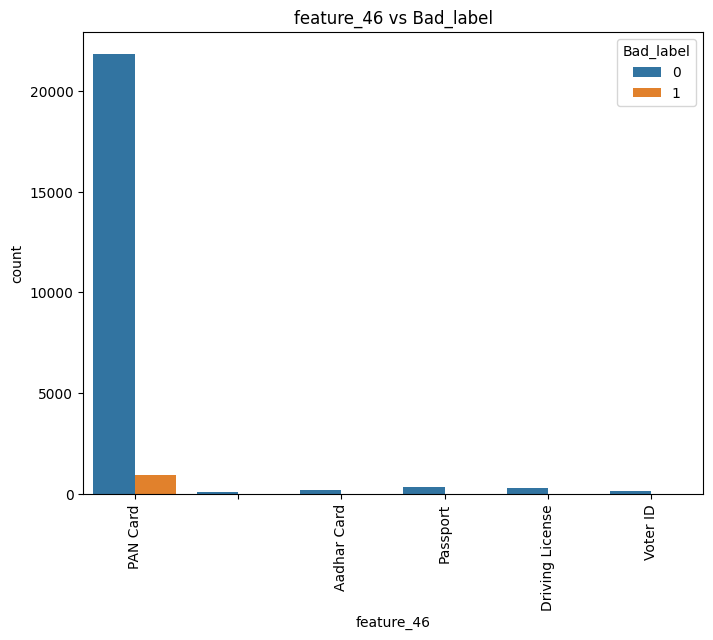

In [143]:
# Categorical vs Categorical plot for feature_46 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_46', hue='Bad_label')
plt.title('feature_46 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

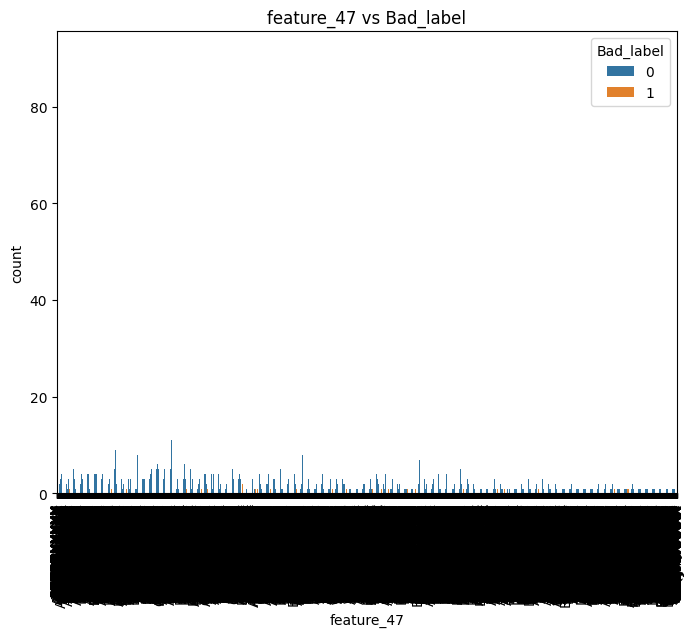

In [144]:
# Categorical vs Categorical plot for feature_47 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_47', hue='Bad_label')
plt.title('feature_47 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

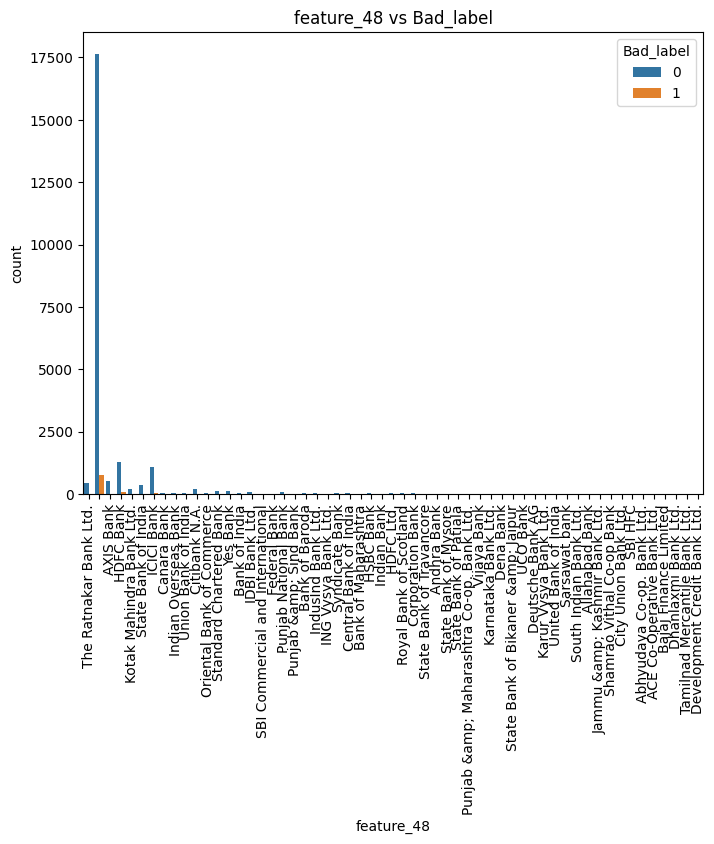

In [145]:
# Categorical vs Categorical plot for feature_48 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_48', hue='Bad_label')
plt.title('feature_48 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

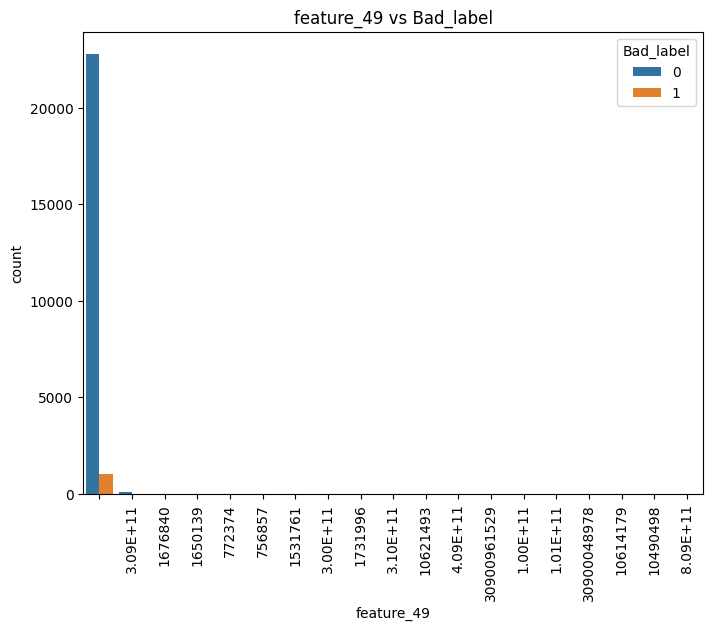

In [146]:
# Categorical vs Categorical plot for feature_49 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_49', hue='Bad_label')
plt.title('feature_49 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

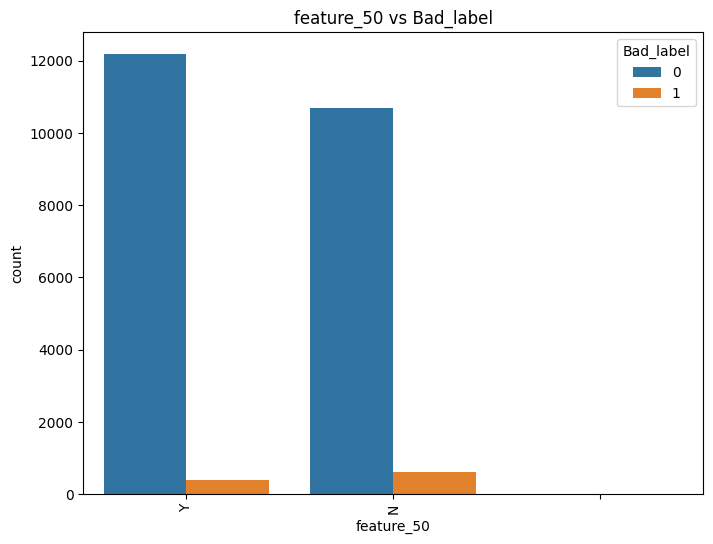

In [147]:
# Categorical vs Categorical plot for feature_50 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_50', hue='Bad_label')
plt.title('feature_50 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

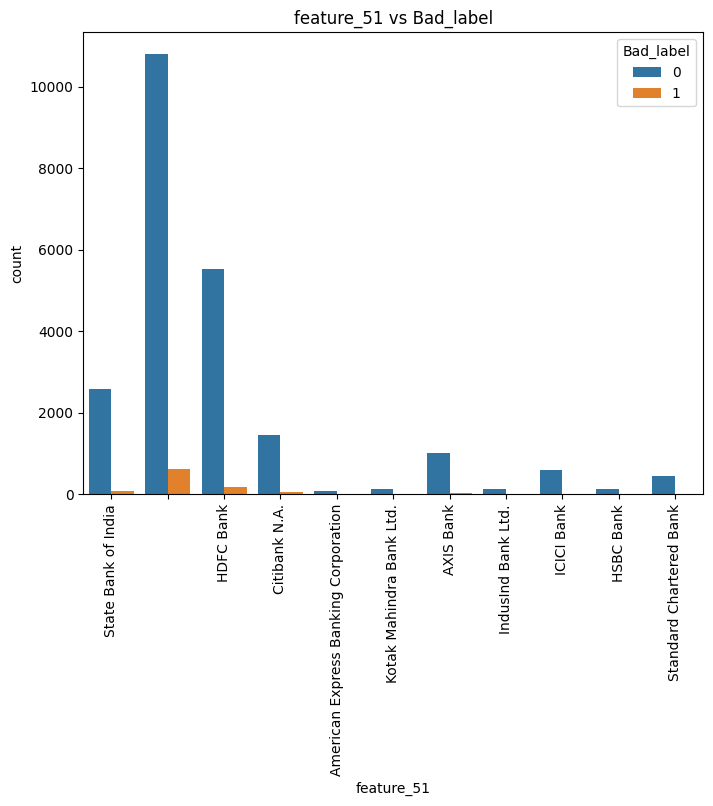

In [148]:
# Categorical vs Categorical plot for feature_51 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_51', hue='Bad_label')
plt.title('feature_51 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

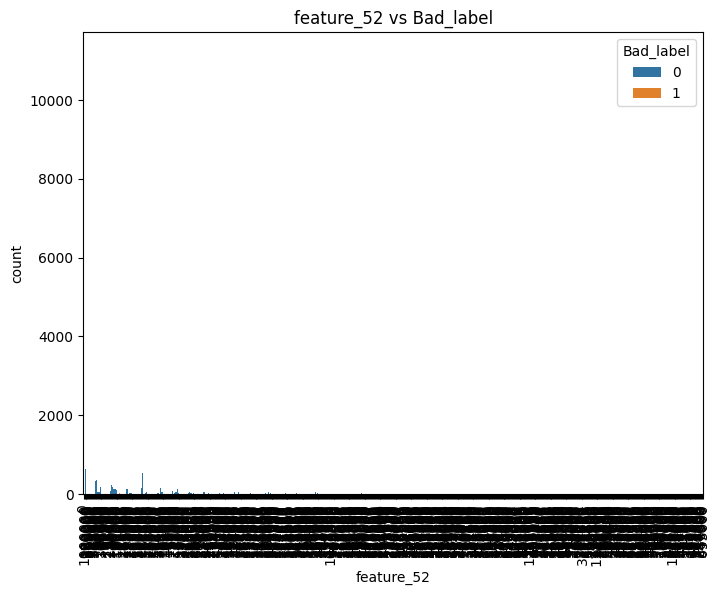

In [149]:
# Categorical vs Categorical plot for feature_52 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_52', hue='Bad_label')
plt.title('feature_52 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

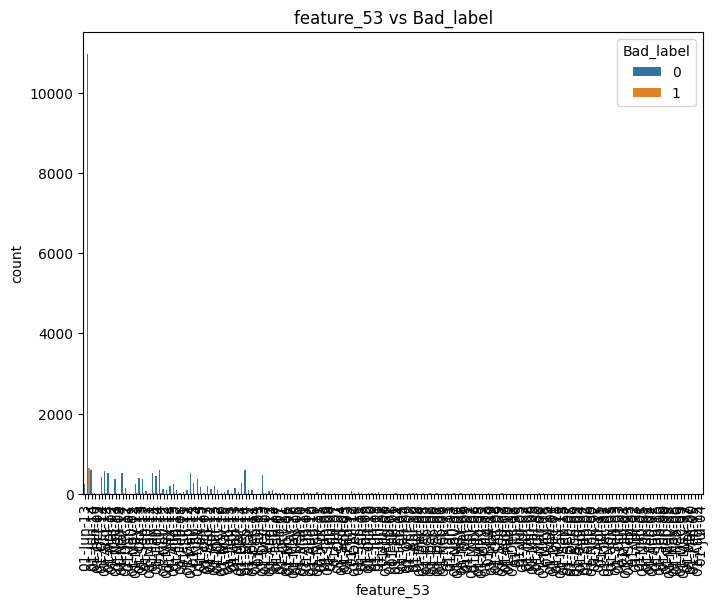

In [150]:
# Categorical vs Categorical plot for feature_53 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_53', hue='Bad_label')
plt.title('feature_53 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

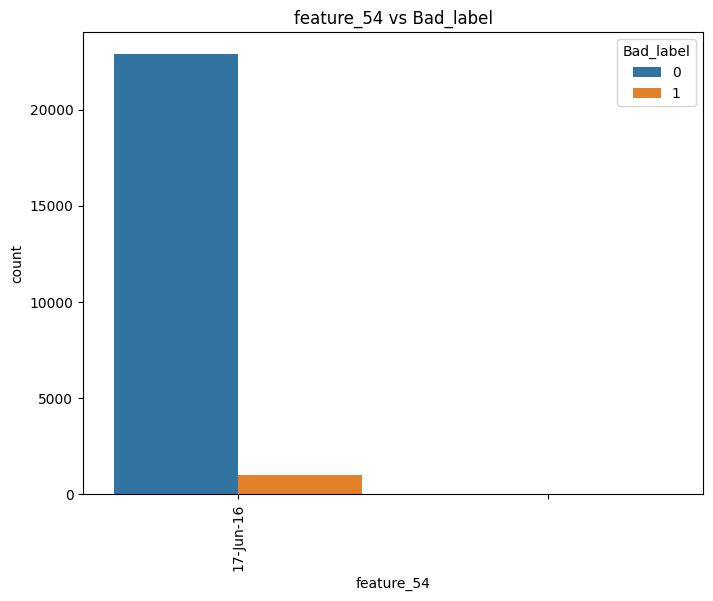

In [151]:
# Categorical vs Categorical plot for feature_54 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_54', hue='Bad_label')
plt.title('feature_54 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

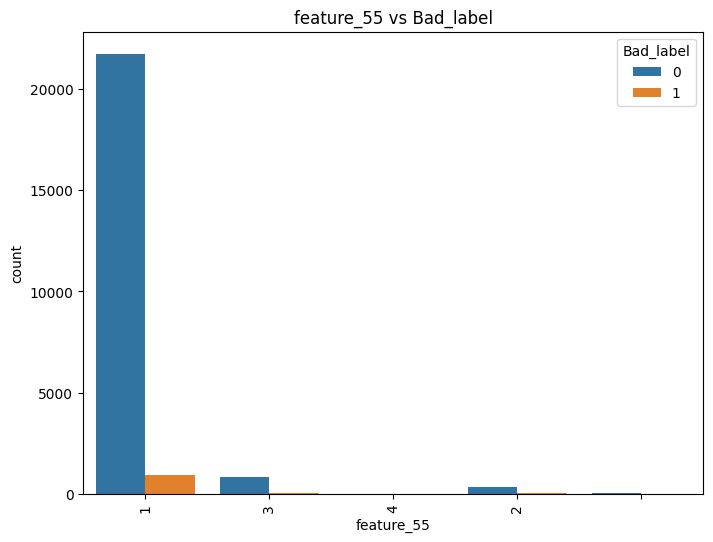

In [152]:
# Categorical vs Categorical plot for feature_55 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_55', hue='Bad_label')
plt.title('feature_55 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

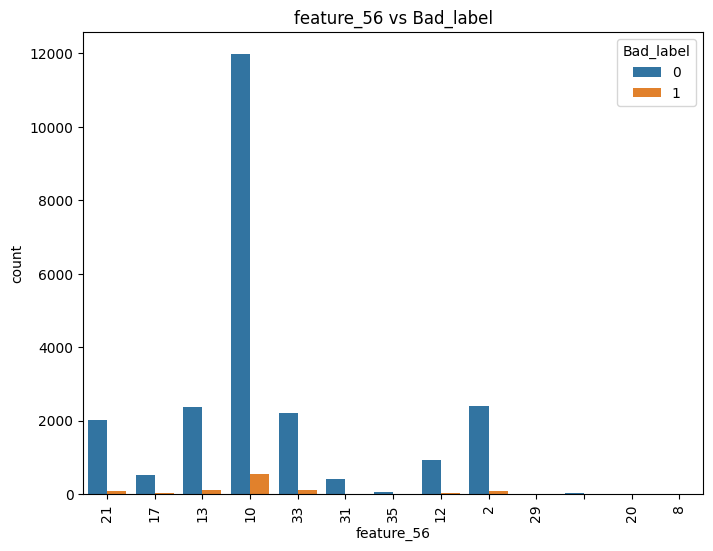

In [153]:
# Categorical vs Categorical plot for feature_56 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_56', hue='Bad_label')
plt.title('feature_56 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

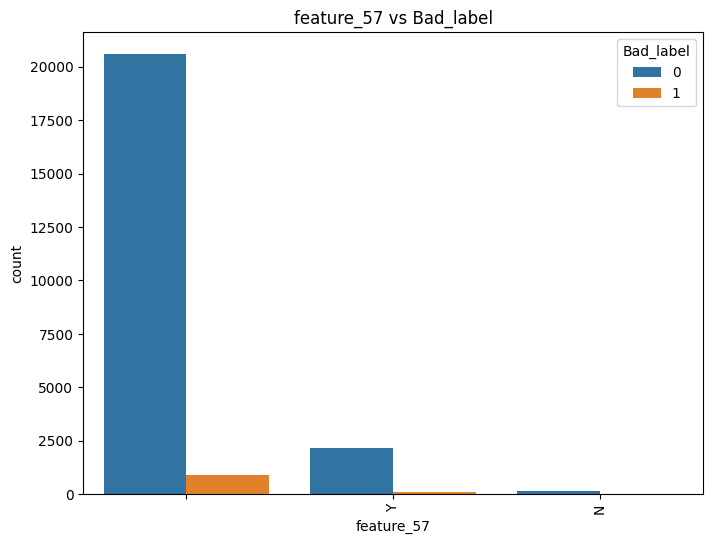

In [154]:
# Categorical vs Categorical plot for feature_57 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_57', hue='Bad_label')
plt.title('feature_57 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

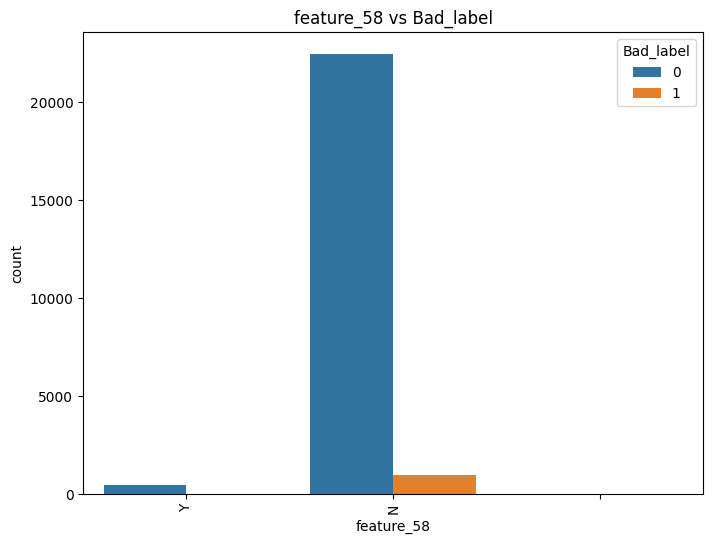

In [155]:
# Categorical vs Categorical plot for feature_58 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_58', hue='Bad_label')
plt.title('feature_58 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

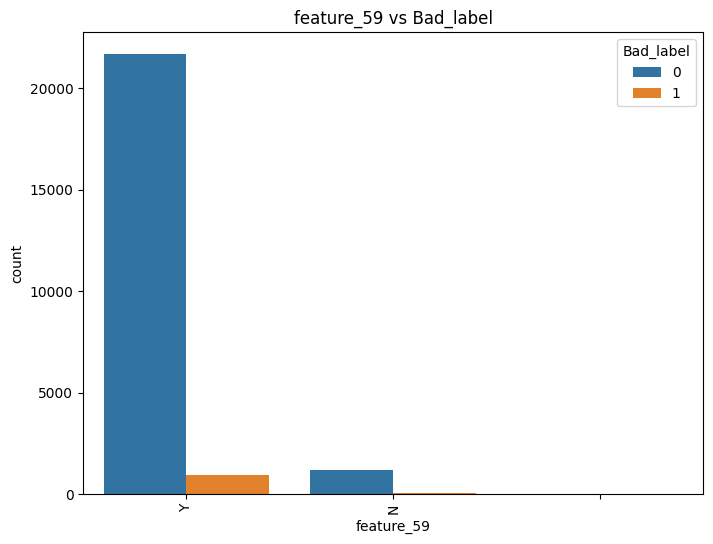

In [156]:
# Categorical vs Categorical plot for feature_59 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_59', hue='Bad_label')
plt.title('feature_59 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

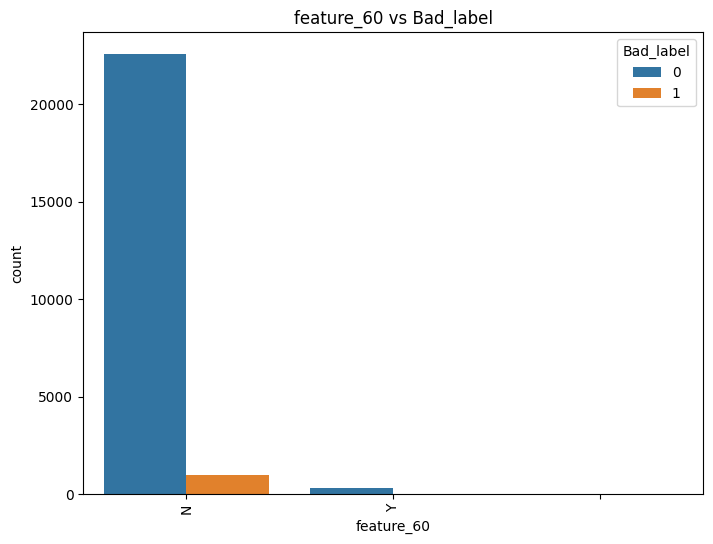

In [157]:
# Categorical vs Categorical plot for feature_60 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_60', hue='Bad_label')
plt.title('feature_60 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

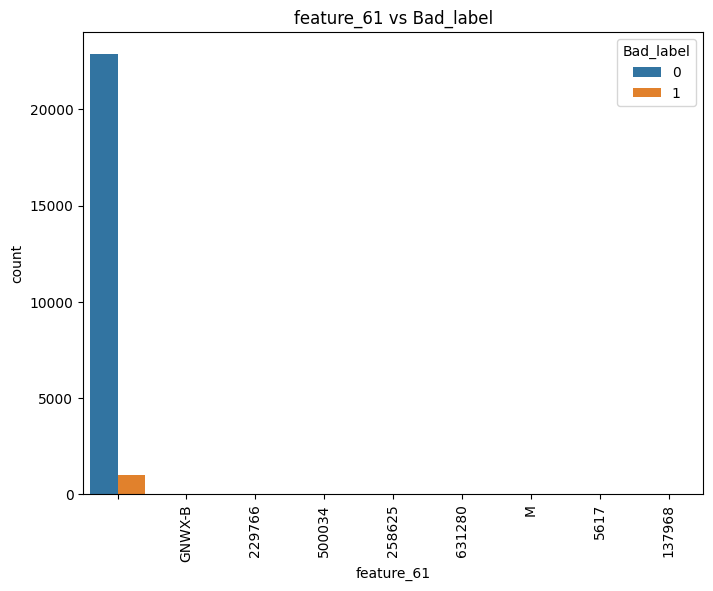

In [158]:
# Categorical vs Categorical plot for feature_61 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_61', hue='Bad_label')
plt.title('feature_61 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

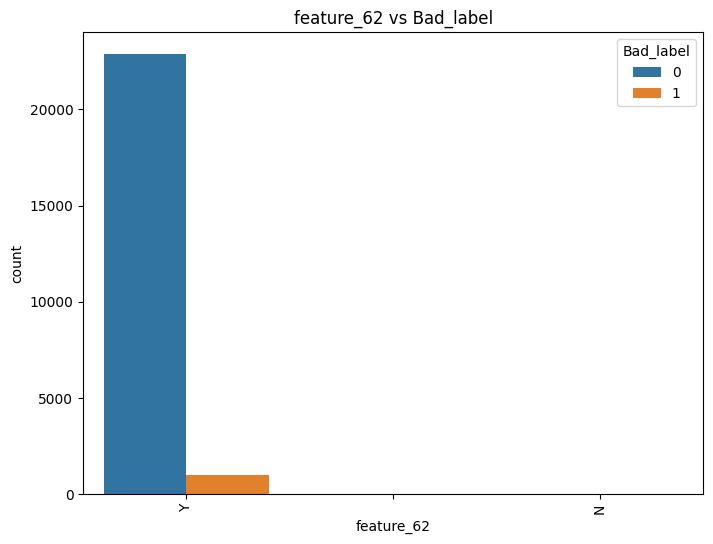

In [159]:
# Categorical vs Categorical plot for feature_62 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_62', hue='Bad_label')
plt.title('feature_62 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

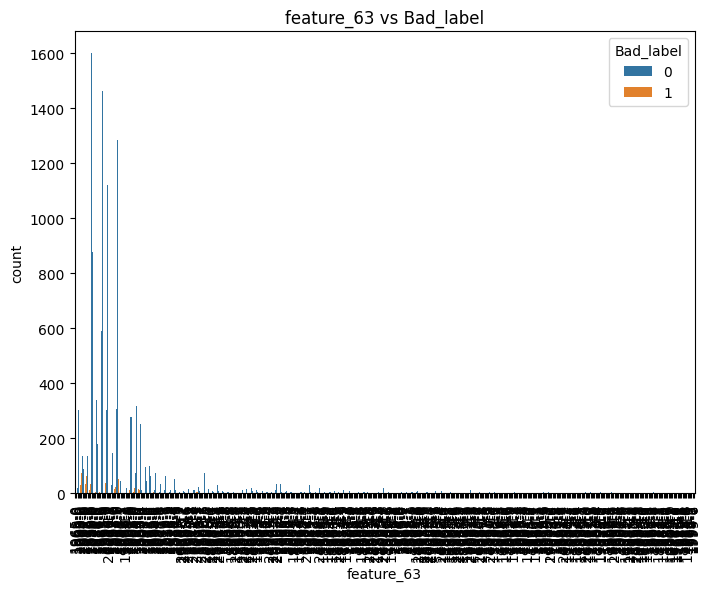

In [160]:
# Categorical vs Categorical plot for feature_63 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_63', hue='Bad_label')
plt.title('feature_63 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

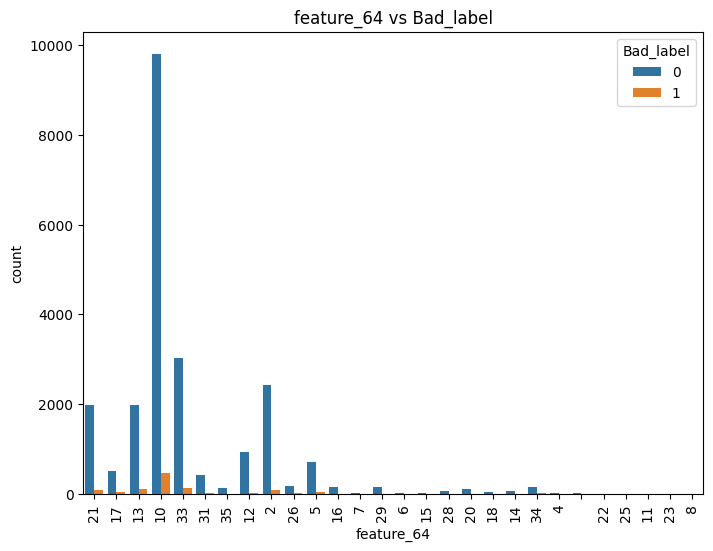

In [161]:
# Categorical vs Categorical plot for feature_64 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_64', hue='Bad_label')
plt.title('feature_64 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

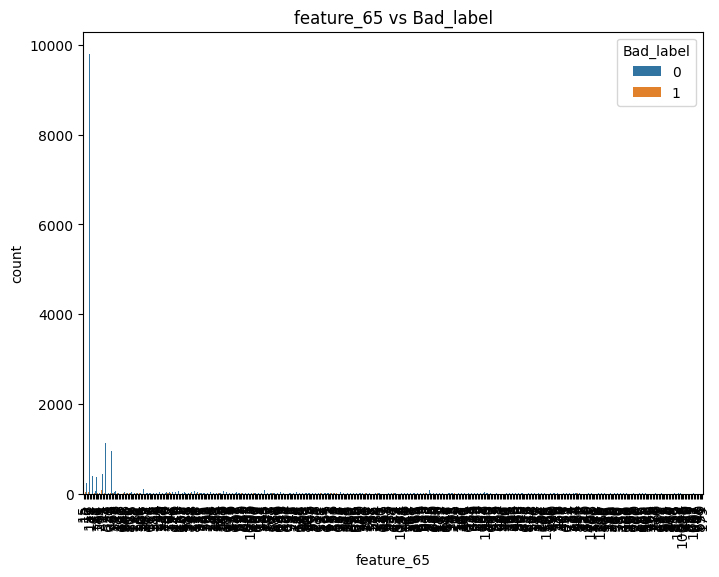

In [162]:
# Categorical vs Categorical plot for feature_65 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_65', hue='Bad_label')
plt.title('feature_65 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

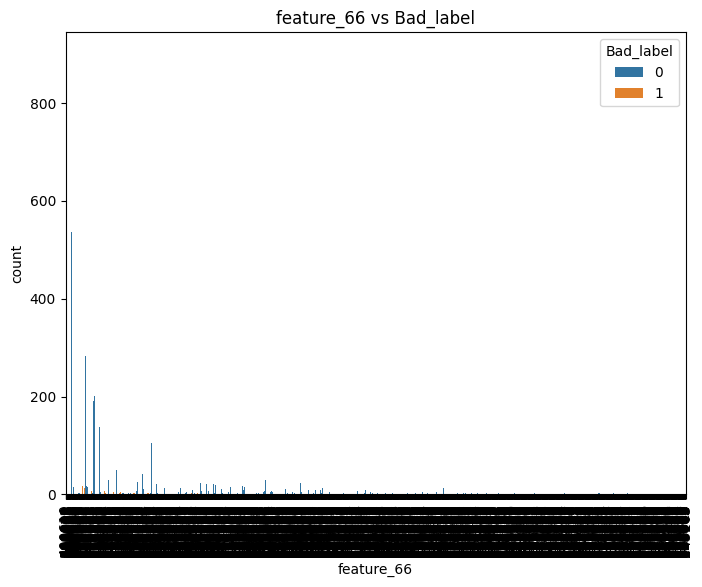

In [163]:
# Categorical vs Categorical plot for feature_66 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_66', hue='Bad_label')
plt.title('feature_66 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

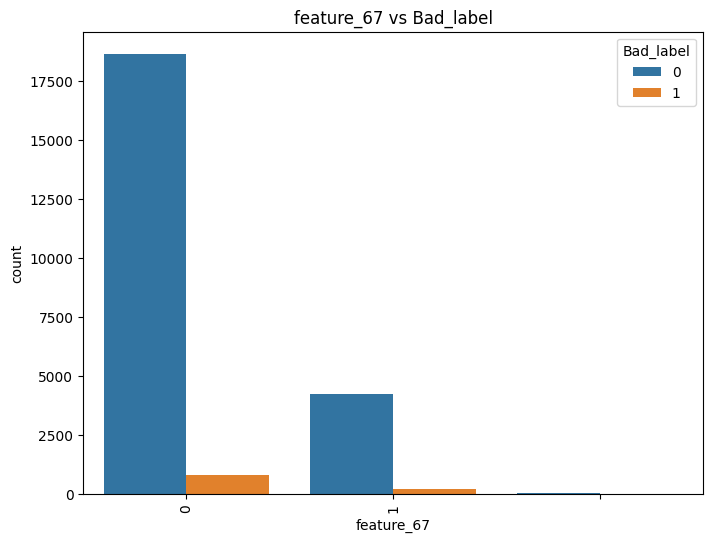

In [164]:
# Categorical vs Categorical plot for feature_67 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_67', hue='Bad_label')
plt.title('feature_67 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

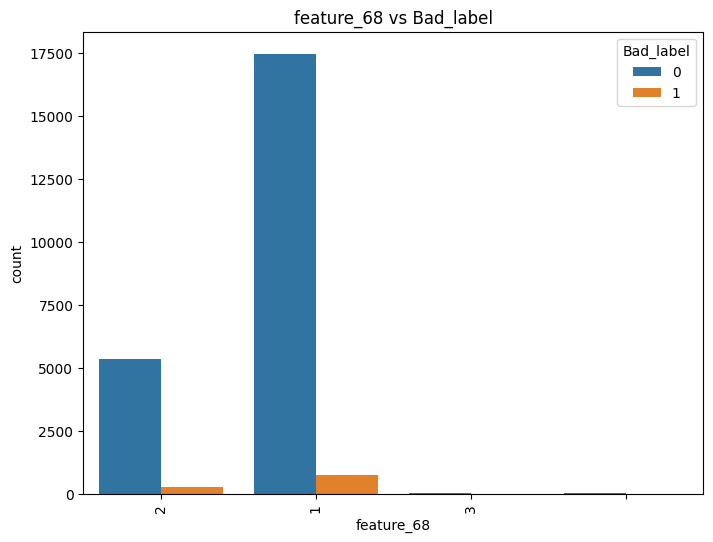

In [165]:
# Categorical vs Categorical plot for feature_68 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_68', hue='Bad_label')
plt.title('feature_68 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

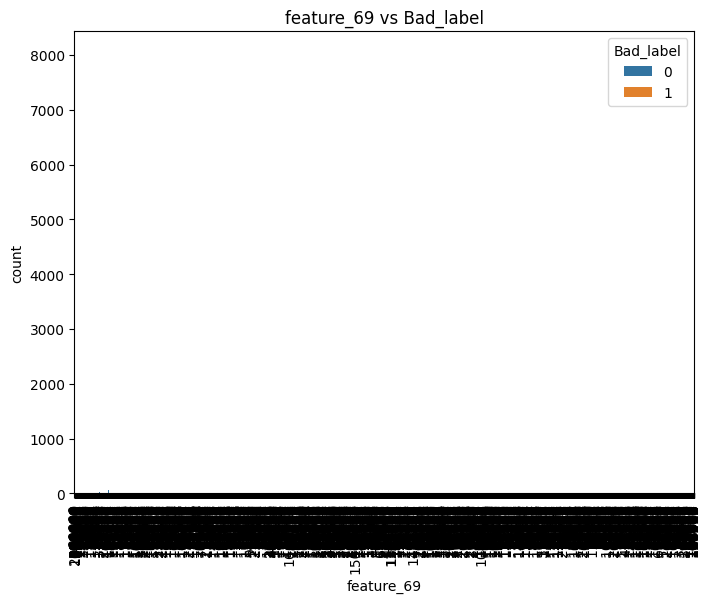

In [166]:
# Categorical vs Categorical plot for feature_69 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_69', hue='Bad_label')
plt.title('feature_69 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

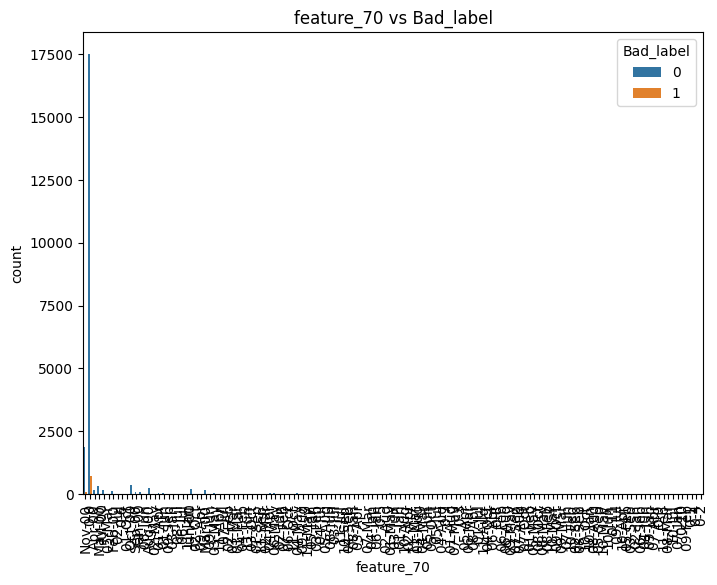

In [167]:
# Categorical vs Categorical plot for feature_70 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_70', hue='Bad_label')
plt.title('feature_70 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

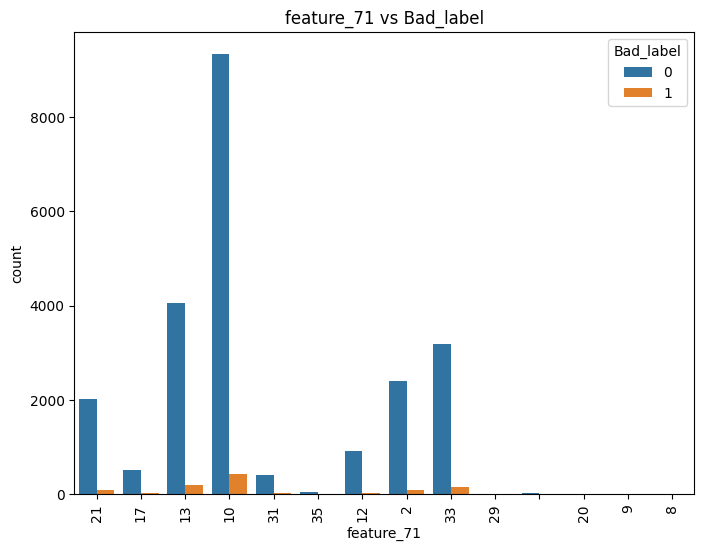

In [168]:
# Categorical vs Categorical plot for feature_71 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_71', hue='Bad_label')
plt.title('feature_71 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

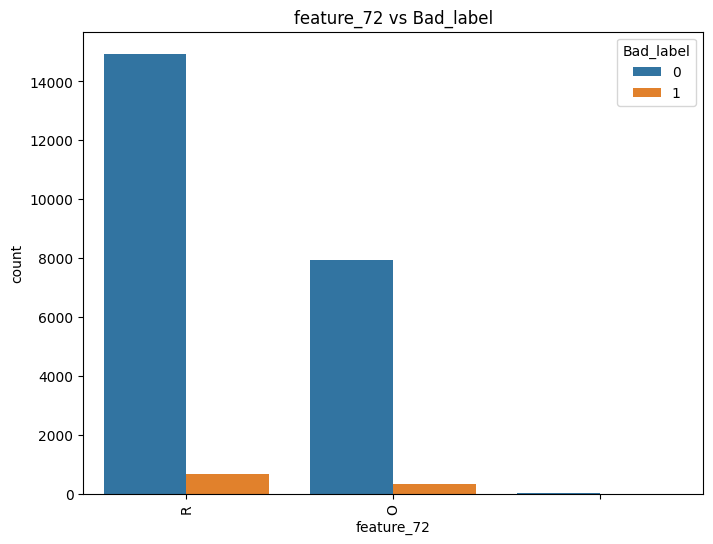

In [169]:
# Categorical vs Categorical plot for feature_72 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_72', hue='Bad_label')
plt.title('feature_72 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

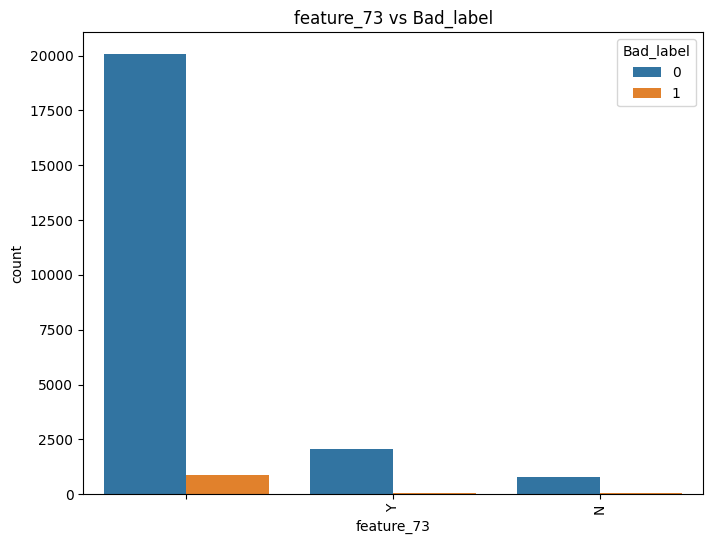

In [170]:
# Categorical vs Categorical plot for feature_73 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_73', hue='Bad_label')
plt.title('feature_73 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

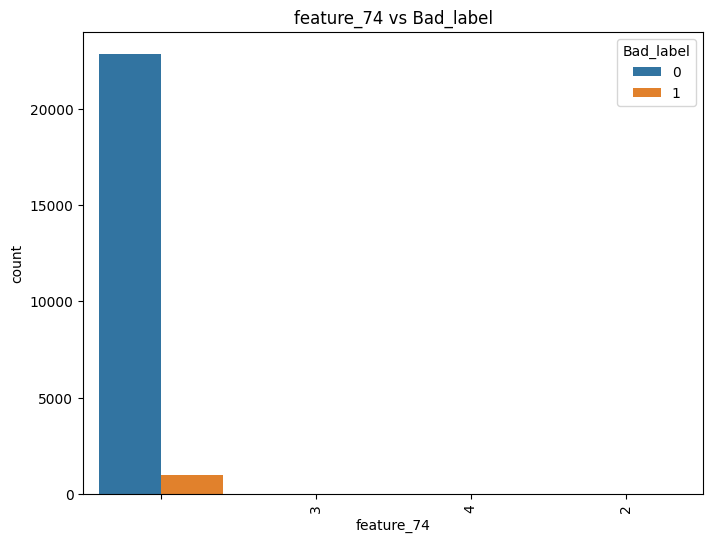

In [171]:
# Categorical vs Categorical plot for feature_74 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_74', hue='Bad_label')
plt.title('feature_74 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

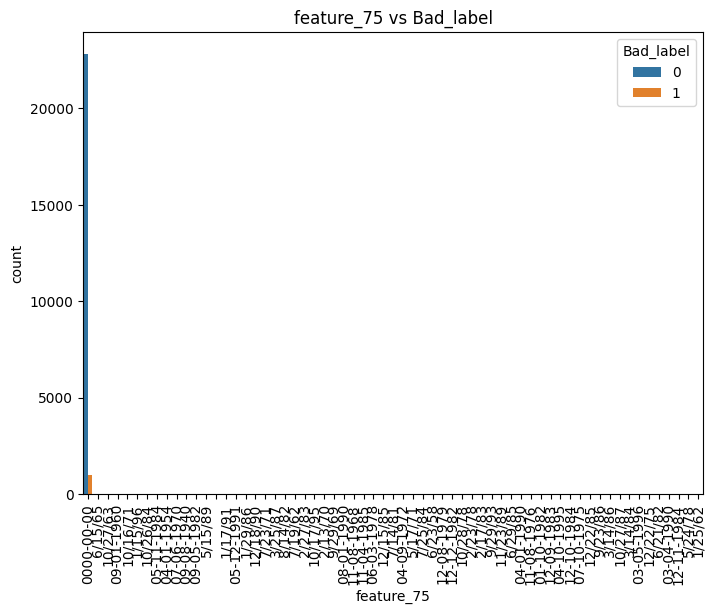

In [173]:
# Categorical vs Categorical plot for feature_75 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_75', hue='Bad_label')
plt.title('feature_75 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

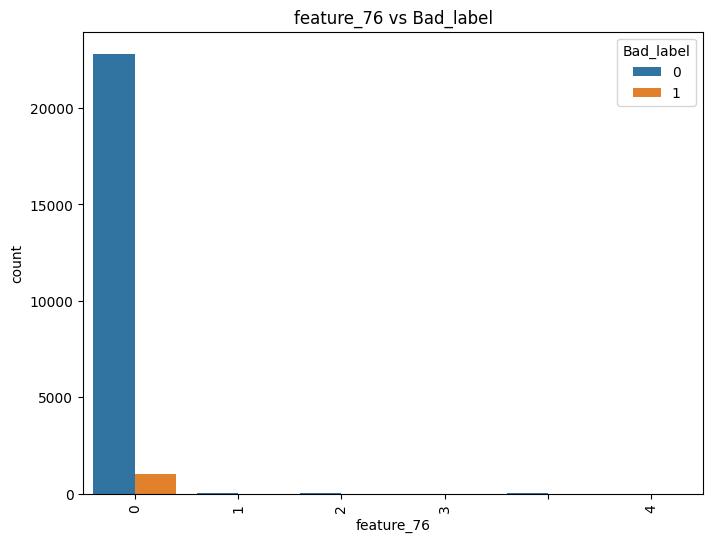

In [174]:
# Categorical vs Categorical plot for feature_76 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_76', hue='Bad_label')
plt.title('feature_76 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

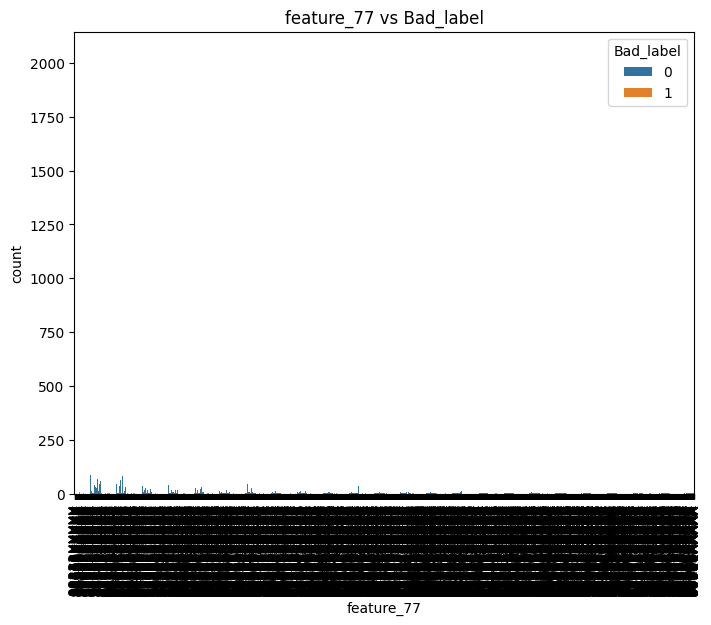

In [175]:
# Categorical vs Categorical plot for feature_77 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_77', hue='Bad_label')
plt.title('feature_77 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

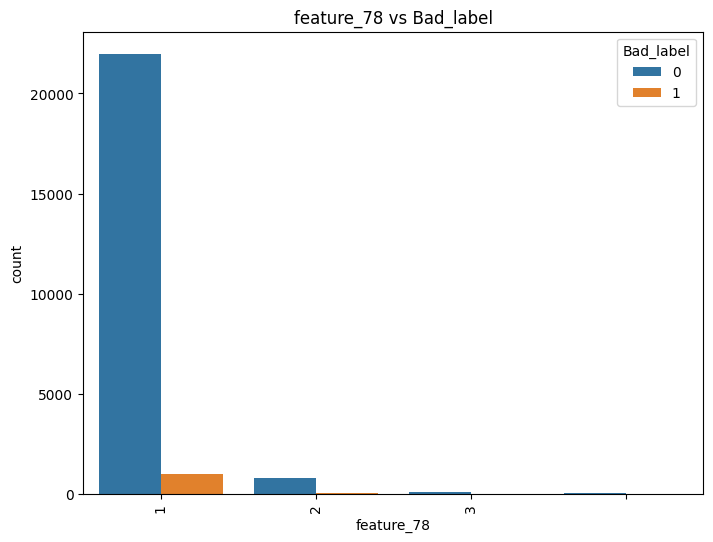

In [176]:
# Categorical vs Categorical plot for feature_78 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_78', hue='Bad_label')
plt.title('feature_78 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

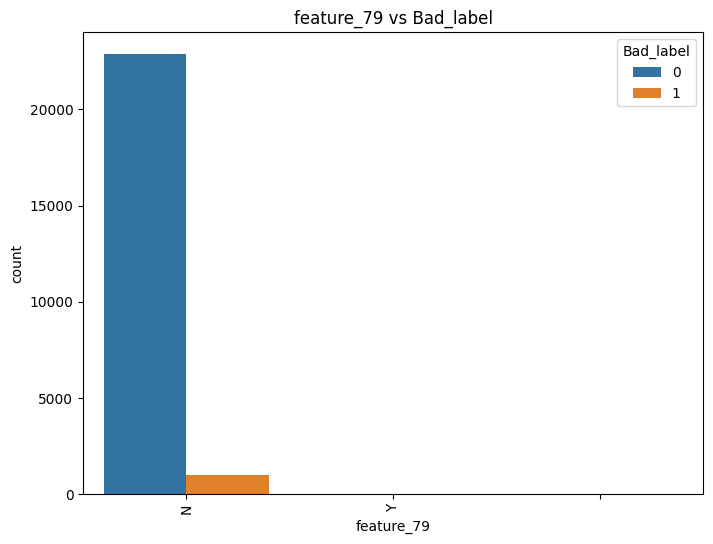

In [177]:
# Categorical vs Categorical plot for feature_79 vs Bad_label
plt.figure(figsize=(8,6))
sns.countplot(data=cust_demographics, x='feature_79', hue='Bad_label')
plt.title('feature_79 vs Bad_label')
plt.xticks(rotation=90)
plt.show()

# Data preprocessing

### Missing values

In [78]:
# Display all columns in the output
pd.set_option('display.max_rows', None)

# Check missing values again
missing_values = cust_demographics.isnull().sum()
missing_percentage = (missing_values / len(cust_demographics)) * 100
missing_data = pd.DataFrame({'Missing Values': missing_values, 'Percentage': missing_percentage})
print(missing_data[missing_data['Missing Values'] > 0])

            Missing Values  Percentage
entry_time              15    0.062772
feature_2             2836   11.868095
feature_21              15    0.062772


In [79]:
# Handling 'entry_time'
cust_demographics['entry_time'] = cust_demographics['entry_time'].fillna(method='ffill')  # Forward fill

# Handling 'feature_2'
if cust_demographics['feature_2'].dtype in ['float64', 'int64']:
    cust_demographics['feature_2'] = cust_demographics['feature_2'].fillna(df['feature_2'].median())  # Median for numerical
else:
    cust_demographics['feature_2'] = cust_demographics['feature_2'].fillna(cust_demographics['feature_2'].mode()[0])  # Mode for categorical

# Handling 'feature_21'
cust_demographics['feature_21'] = cust_demographics['feature_21'].fillna(method='bfill')  # Backward fill

# Verify no missing values
print(cust_demographics.isnull().sum())

dt_opened      0
customer_no    0
entry_time     0
feature_1      0
feature_2      0
feature_3      0
feature_4      0
feature_5      0
feature_6      0
feature_7      0
feature_8      0
feature_9      0
feature_10     0
feature_11     0
feature_12     0
feature_13     0
feature_14     0
feature_15     0
feature_16     0
feature_17     0
feature_18     0
feature_19     0
feature_20     0
feature_21     0
feature_22     0
feature_23     0
feature_24     0
feature_25     0
feature_26     0
feature_27     0
feature_28     0
feature_29     0
feature_30     0
feature_31     0
feature_32     0
feature_33     0
feature_34     0
feature_35     0
feature_36     0
feature_37     0
feature_38     0
feature_39     0
feature_40     0
feature_41     0
feature_42     0
feature_43     0
feature_44     0
feature_45     0
feature_46     0
feature_47     0
feature_48     0
feature_49     0
feature_50     0
feature_51     0
feature_52     0
feature_53     0
feature_54     0
feature_55     0
feature_56    

**Forward/Backward Fill**: For datetime columns, this keeps continuity in time-series data.

**Median**: For numerical data with outliers, it's robust compared to the mean.

**Mode**: For categorical data, it’s logical to use the most frequent value to replace missing entries.

# Categorical to numerical

In [80]:
cust_demographics.dtypes

dt_opened      datetime64[ns]
customer_no            object
entry_time     datetime64[ns]
feature_1              object
feature_2      datetime64[ns]
feature_3              object
feature_4              object
feature_5              object
feature_6              object
feature_7              object
feature_8              object
feature_9              object
feature_10             object
feature_11             object
feature_12             object
feature_13             object
feature_14             object
feature_15             object
feature_16             object
feature_17             object
feature_18             object
feature_19             object
feature_20             object
feature_21     datetime64[ns]
feature_22             object
feature_23             object
feature_24             object
feature_25             object
feature_26             object
feature_27             object
feature_28             object
feature_29             object
feature_30             object
feature_31

## Handling datetime columns

In [81]:
# Converting datetime columns to numerical features (year, month, etc.)
cust_demographics['dt_opened_year'] = cust_demographics['dt_opened'].dt.year
cust_demographics['dt_opened_month'] = cust_demographics['dt_opened'].dt.month
cust_demographics['entry_time_year'] = cust_demographics['entry_time'].dt.year
cust_demographics['entry_time_month'] = cust_demographics['entry_time'].dt.month
cust_demographics['feature_2_year'] = cust_demographics['feature_2'].dt.year
cust_demographics['feature_2_month'] = cust_demographics['feature_2'].dt.month
cust_demographics['feature_21_year'] = cust_demographics['feature_21'].dt.year
cust_demographics['feature_21_month'] = cust_demographics['feature_21'].dt.month

In [82]:
from sklearn.preprocessing import LabelEncoder

# Initialize the LabelEncoder
le = LabelEncoder()

# Apply label encoding to all object columns
object_columns = cust_demographics.select_dtypes(include=['object']).columns

for col in object_columns:
    cust_demographics[col] = le.fit_transform(cust_demographics[col])

In [83]:
cust_demographics.dtypes

dt_opened           datetime64[ns]
customer_no                  int32
entry_time          datetime64[ns]
feature_1                    int32
feature_2           datetime64[ns]
feature_3                    int32
feature_4                    int32
feature_5                    int32
feature_6                    int32
feature_7                    int32
feature_8                    int32
feature_9                    int32
feature_10                   int32
feature_11                   int32
feature_12                   int32
feature_13                   int32
feature_14                   int32
feature_15                   int32
feature_16                   int32
feature_17                   int32
feature_18                   int32
feature_19                   int32
feature_20                   int32
feature_21          datetime64[ns]
feature_22                   int32
feature_23                   int32
feature_24                   int32
feature_25                   int32
feature_26          

# Handling Outliers

In [84]:
from scipy import stats

### dt_opened_year

<Axes: xlabel='dt_opened_year'>

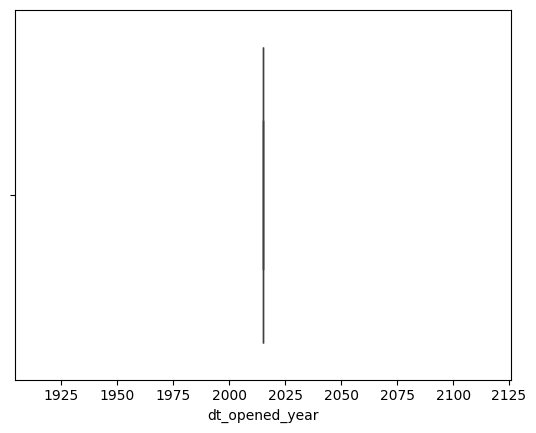

In [76]:
sns.boxplot(x='dt_opened_year',data=cust_demographics)

### dt_opened_month

<Axes: xlabel='dt_opened_month'>

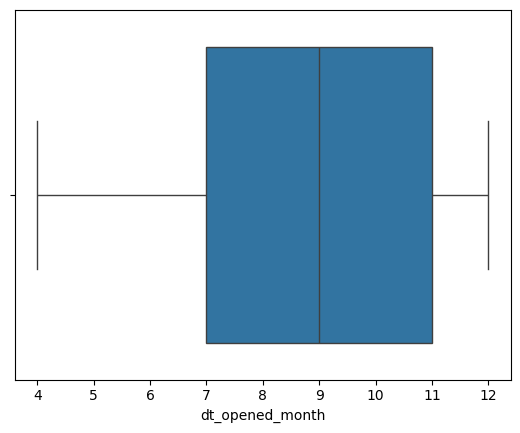

In [83]:
sns.boxplot(x='dt_opened_month',data=cust_demographics)

### entry_time_year

<Axes: xlabel='entry_time_year'>

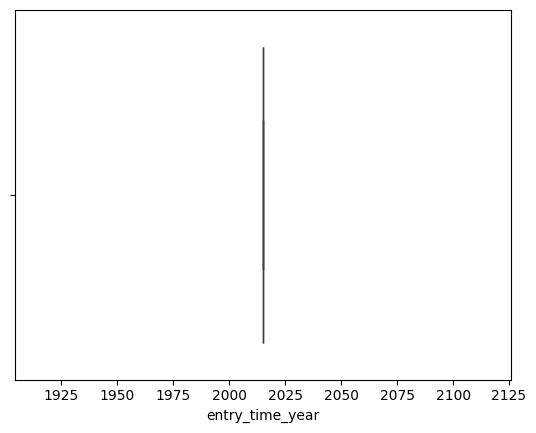

In [84]:
sns.boxplot(x='entry_time_year',data=cust_demographics)

### entry_time_month

<Axes: xlabel='entry_time_month'>

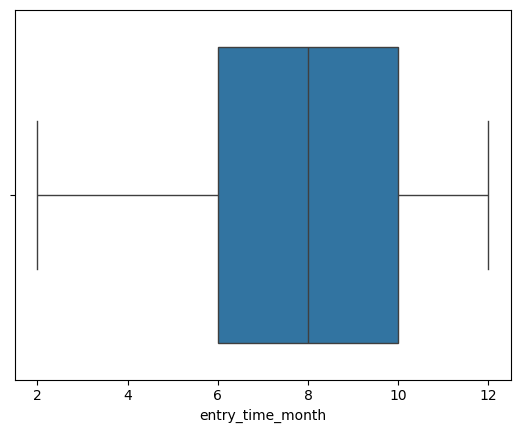

In [85]:
sns.boxplot(x='entry_time_month',data=cust_demographics)

### feature_2_year

<Axes: xlabel='feature_2_year'>

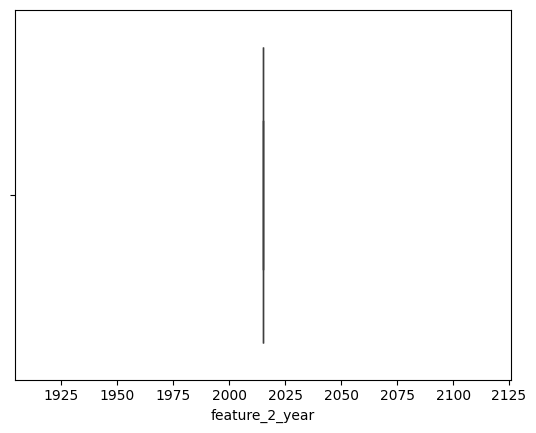

In [86]:
sns.boxplot(x='feature_2_year',data=cust_demographics)

### feature_2_month

<Axes: xlabel='feature_2_month'>

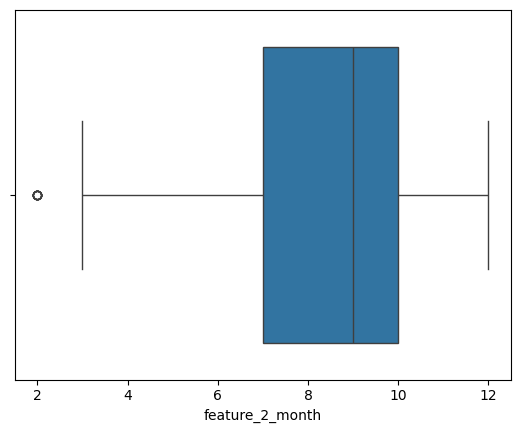

In [85]:
sns.boxplot(x='feature_2_month',data=cust_demographics)

In [86]:
# Select only numeric columns from the dataset
numeric_columns = [
    'dt_opened_year', 'dt_opened_month', 'entry_time_year', 'entry_time_month',
    'feature_2_year', 'feature_2_month', 'feature_21_year', 'feature_21_month'
]

# Calculate IQR for each numeric column
from scipy import stats

# Loop through each column and detect outliers using IQR
for col in numeric_columns:
    Q1 = cust_demographics[col].quantile(0.25)
    Q3 = cust_demographics[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Get the outliers in the column
    outliers = cust_demographics[(cust_demographics[col] < lower_bound) | (cust_demographics[col] > upper_bound)]
    print(f"Outliers in {col}:")
    print(outliers[col])


Outliers in dt_opened_year:
Series([], Name: dt_opened_year, dtype: int32)
Outliers in dt_opened_month:
Series([], Name: dt_opened_month, dtype: int32)
Outliers in entry_time_year:
Series([], Name: entry_time_year, dtype: int32)
Outliers in entry_time_month:
Series([], Name: entry_time_month, dtype: int32)
Outliers in feature_2_year:
Series([], Name: feature_2_year, dtype: int32)
Outliers in feature_2_month:
9226     2
12565    2
13602    2
17314    2
18045    2
18079    2
18083    2
18225    2
Name: feature_2_month, dtype: int32
Outliers in feature_21_year:
0        2065
1        2062
2        2066
3        2064
4        2054
5        2063
6        2054
7        2051
9        1969
11       2051
12       2051
15       2058
17       2066
20       2061
21       2051
22       2060
24       2063
29       2068
30       2051
31       2053
32       2051
35       2051
36       2055
40       2068
41       2055
43       2064
44       2067
49       2058
57       2048
58       2062
59       2067
6

In [87]:
# Calculate the Q1 (25th percentile) and Q3 (75th percentile) for 'feature_21_year'
Q1 = cust_demographics['feature_21_year'].quantile(0.25)
Q3 = cust_demographics['feature_21_year'].quantile(0.75)

# Calculate the IQR
IQR = Q3 - Q1

# Calculate the lower and upper bounds for capping
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Capping the outliers in 'feature_21_year' to the lower and upper bounds
cust_demographics['feature_21_year'] = cust_demographics['feature_21_year'].clip(lower=lower_bound, upper=upper_bound)

# Verify the result
print(cust_demographics['feature_21_year'].describe())

count    23896.000000
mean      1983.636090
std          6.415072
min       1969.500000
25%       1980.000000
50%       1984.000000
75%       1987.000000
max       1997.500000
Name: feature_21_year, dtype: float64


<Axes: xlabel='feature_21_year'>

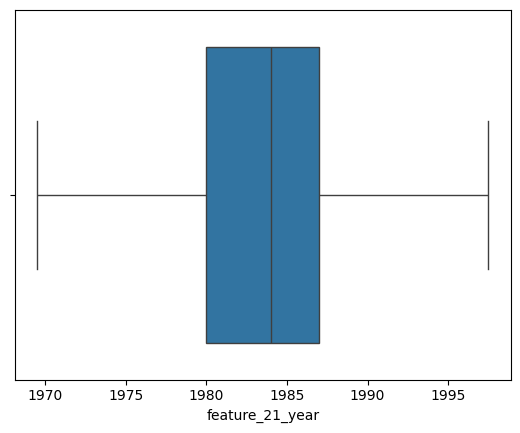

In [88]:
sns.boxplot(x='feature_21_year',data=cust_demographics)

# 3] cust_enquiry

In [89]:
cust_enquiry.columns

Index(['dt_opened', 'customer_no', 'upload_dt', 'enquiry_dt', 'enq_purpose',
       'enq_amt'],
      dtype='object')

In [97]:
cust_enquiry.head()

,dt_opened,customer_no,upload_dt,enquiry_dt,enq_purpose,enq_amt
0,18-Apr-15,1,21-Apr-15,19-Dec-14,2,3500000
1,18-Apr-15,1,21-Apr-15,05-Mar-14,5,500000
2,18-Apr-15,1,21-Apr-15,05-Mar-14,0,50000
3,18-Apr-15,1,21-Apr-15,22-Feb-14,10,50000
4,18-Apr-15,1,21-Apr-15,11-Jun-13,10,1000


In [50]:
cust_enquiry.tail()

,dt_opened,customer_no,upload_dt,enquiry_dt,enq_purpose,enq_amt
413183,04-Dec-15,23896,09-Nov-15,22-Oct-11,5,200000
413184,04-Dec-15,23896,09-Nov-15,06-Jan-11,10,50000
413185,04-Dec-15,23896,09-Nov-15,01-Apr-10,10,50000
413186,04-Dec-15,23896,09-Nov-15,21-Feb-10,1,330000
413187,04-Dec-15,23896,09-Nov-15,17-Oct-07,2,682000


In [51]:
cust_enquiry.shape

(413188, 6)

In [52]:
cust_enquiry.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 413188 entries, 0 to 413187
Data columns (total 6 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   dt_opened    413188 non-null  object
 1   customer_no  413188 non-null  object
 2   upload_dt    413188 non-null  object
 3   enquiry_dt   413188 non-null  object
 4   enq_purpose  413188 non-null  object
 5   enq_amt      413188 non-null  object
dtypes: object(6)
memory usage: 18.9+ MB


In [53]:
cust_enquiry.describe()

,dt_opened,customer_no,upload_dt,enquiry_dt,enq_purpose,enq_amt
count,413188,413188,413188,413188,413188,413188
unique,197,23896,76,3772,37,7384
top,16-Nov-15,10076,21-Apr-15,17-Mar-15,10,50000
freq,10538,308,11770,495,238150,79949


General Distribution:

The dataset contains 413,188 rows, with no missing values for the columns (count is equal for all features), indicating the data is well-populated.
Date-Based Insights:

dt_opened: The most frequent date is 16-Nov-15, which suggests that most records in the dataset were created or recorded on this specific date. It might be worth investigating if there are any time-based patterns that could be useful for the analysis.
upload_dt: The most frequent upload date is 21-Apr-15, showing that data uploads might be concentrated around specific time periods.
enquiry_dt: The most frequent enquiry date is 17-Mar-15, which indicates that a significant number of entries were made on this date. This might suggest some seasonal or periodic pattern in the data entries.
Customer Identification:

customer_no: There are 23,896 unique customer numbers in the dataset. This represents the number of distinct customers, which is much smaller than the total number of records (413,188), meaning that some customers may have multiple entries (e.g., multiple enquiries).
customer_no Frequency: The most frequent customer number is 10076, which has 308 entries. This could indicate that a few customers have multiple records, possibly with different enquiries.
Enquiry Details:

enq_purpose: This column has 37 unique values, with the most frequent purpose being 10. This suggests that the majority of the enquiries fall under a particular purpose, but there are other purposes with fewer occurrences, indicating diversity in the types of enquiries.
enq_amt: This feature, which seems to represent the amount associated with an enquiry, has 7,384 unique values. The most frequent amount is 50,000, which appears 79,949 times. This could indicate a common enquiry amount or a fixed value for many customers. It’s worth investigating whether this amount has any predictive power for other features.
Potential Patterns:

Frequent Values: The frequency distribution for enq_amt (with 50,000 being the top value) suggests that there could be a skew or concentration around a few specific amounts, which may warrant further analysis. It might be useful to see how the amount correlates with other features or the target variable, if any.
Multiple Entries for Customers: Given that some customers have multiple entries (as shown by customer_no with a frequency of 308), it would be beneficial to check for repeated patterns or trends across those multiple enquiries. This could lead to better customer profiling or more accurate predictive models.
Unique Data Patterns:

upload_dt and enquiry_dt: Both of these date-related columns show variation in terms of frequency (upload_dt has 21-Apr-15 as the most frequent date, and enquiry_dt has 17-Mar-15). This might suggest either seasonal or cyclical patterns in how data is recorded or processed. If upload_dt and enquiry_dt are not aligned, it could point to delays in uploading records.

In [90]:
# Check for duplicate rows
print(cust_enquiry.duplicated().sum())

13827


In [91]:
# Drop duplicates from the DataFrame
cust_enquiry = cust_enquiry.drop_duplicates()

# Check how many duplicates remain after removal
print(cust_enquiry.duplicated().sum())

0


In [92]:
# Check unique values in each column
for col in cust_enquiry.columns:
    print(f"Unique values in {col}: {cust_enquiry[col].nunique()}")

Unique values in dt_opened: 197
Unique values in customer_no: 23896
Unique values in upload_dt: 76
Unique values in enquiry_dt: 3772
Unique values in enq_purpose: 37
Unique values in enq_amt: 7384


# Exploratory Data Analysis

### Convert Date Columns to Datetime Format

In [94]:
# Convert date columns to datetime
cust_enquiry['dt_opened'] = pd.to_datetime(cust_enquiry['dt_opened'], errors='coerce')
cust_enquiry['upload_dt'] = pd.to_datetime(cust_enquiry['upload_dt'], errors='coerce')
cust_enquiry['enquiry_dt'] = pd.to_datetime(cust_enquiry['enquiry_dt'], errors='coerce')

# Convert 'enq_amt' to numeric
cust_enquiry['enq_amt'] = pd.to_numeric(cust_enquiry['enq_amt'], errors='coerce')

# Check data types after conversion
print(cust_enquiry.dtypes)

dt_opened      datetime64[ns]
customer_no            object
upload_dt      datetime64[ns]
enquiry_dt     datetime64[ns]
enq_purpose            object
enq_amt               float64
dtype: object


In [ ]:
# Categorical columns
categorical_cols = cust_enquiry.select_dtypes(include=['object']).columns

# Frequency distribution for categorical columns
for col in categorical_cols:
    print(f"Value counts for {col}:")
    print(cust_enquiry[col].value_counts())
    print("-" * 50)

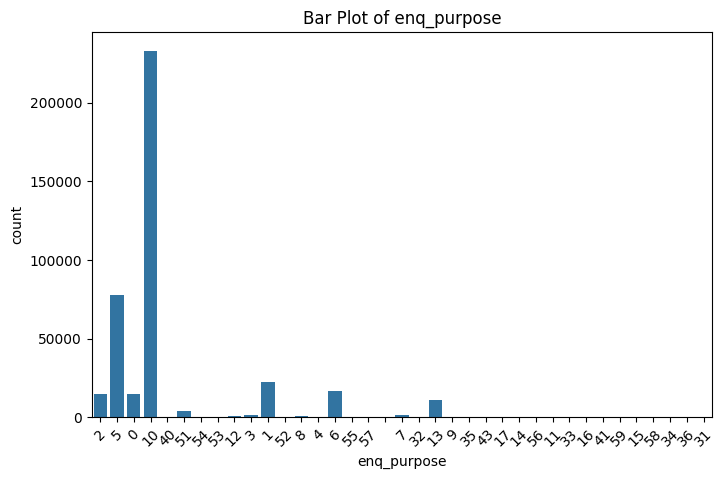

In [86]:
# Plot for the 'enq_purpose' column
plt.figure(figsize=(8, 5))
sns.countplot(data=cust_enquiry, x='enq_purpose')
plt.title("Bar Plot of enq_purpose")
plt.xticks(rotation=45)  # Rotate x-axis labels if needed
plt.show()


# Bivariate Analysis

### enq_purpose vs customer_no

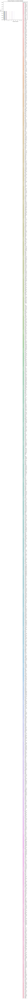

In [69]:
cust_enquiry_sampled = cust_enquiry.sample(n=1000)  # Sample 1000 rows for faster plotting
sns.countplot(x='enq_purpose', hue='customer_no', data=cust_enquiry_sampled)
plt.title('Enquiry Purpose vs Customer Number')
plt.xlabel('Enquiry Purpose')
plt.ylabel('Count')
plt.show()

### enq_amt vs enq_purpose

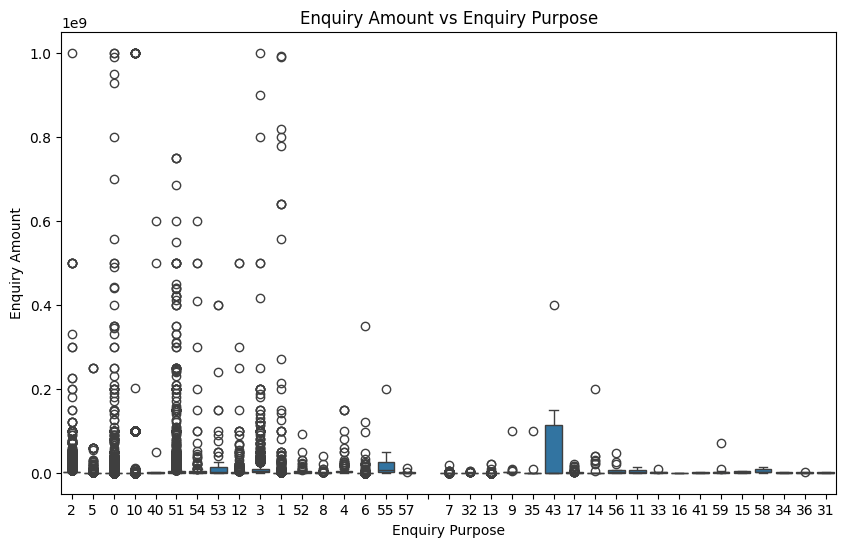

In [67]:
# Boxplot for 'enq_amt' across 'enq_purpose'
plt.figure(figsize=(10, 6))
sns.boxplot(x='enq_purpose', y='enq_amt', data=cust_enquiry)
plt.title('Enquiry Amount vs Enquiry Purpose')
plt.xlabel('Enquiry Purpose')
plt.ylabel('Enquiry Amount')
plt.show()

### enq_amt vs enquiry_dt

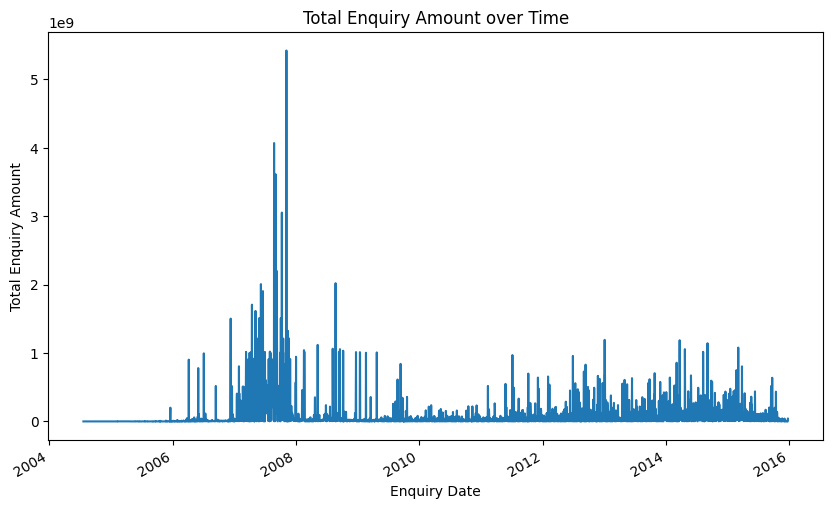

In [68]:
# Group by 'enquiry_dt' and calculate the sum of 'enq_amt'
enq_amt_by_date = cust_enquiry.groupby('enquiry_dt')['enq_amt'].sum()

# Plot the time series data
plt.figure(figsize=(10, 6))
enq_amt_by_date.plot()
plt.title('Total Enquiry Amount over Time')
plt.xlabel('Enquiry Date')
plt.ylabel('Total Enquiry Amount')
plt.show()

### 1. **Enquiry Purpose vs Customer Number (Stacked Bar Plot)**
   - **Customer Segments by Enquiry Purpose**: By visualizing how customers inquire about different services, you can identify which customer groups (based on `customer_no`) are associated with specific `enq_purpose` categories.
   - **Dominant Enquiry Purpose**: If a significant portion of customers are inquiring for the same purpose, it might indicate that this service or product is in high demand. For instance, if `enq_purpose` like "Loan" has more customer interactions than other purposes, this can indicate a focus area.
   - **Possible Trends in Customer Behavior**: If you notice certain purposes are associated with particular customer segments (e.g., high-value customers may be more interested in large-scale projects or loans), this can inform marketing and sales strategies.

### 2. **Enquiry Amount vs Enquiry Purpose (Boxplot/Violin Plot)**
   - **Enquiry Amount Distribution by Purpose**: The distribution of `enq_amt` (enquiry amount) for each `enq_purpose` will give insights into which types of enquiries tend to involve higher amounts. For example, "Loan" may have a higher range of enquiry amounts compared to "Product Purchase".
   - **Outliers in Enquiry Amount**: If there are significant outliers, they may indicate abnormal or high-value transactions, which could be worth investigating for further analysis (such as fraud detection or identifying high-value clients).
   - **Budget Allocation Insights**: If certain purposes are associated with larger amounts, this could influence how resources or budgets are allocated across different purposes.

### 3. **Enquiry Amount Over Time (Line Plot with `enquiry_dt`)**
   - **Trends in Enquiry Amounts**: A line plot of total `enq_amt` over time will help identify if enquiry amounts are growing, staying stable, or declining. This trend could inform decisions about how to allocate resources or plan for growth.
   - **Seasonality**: If there are certain peaks or dips in the amount over time (e.g., during holidays, festivals, or specific months), this could indicate seasonal behavior that might require adjustments in business operations.
   - **Marketing Impact**: You can analyze if marketing campaigns or promotional periods result in spikes in enquiry amounts. If, for example, more enquiries happen in specific months, it could indicate successful marketing efforts during that time.
   
### Overall Insights  Could Gain:
- **Customer Behavior**: Understand which types of enquiries are more prevalent across different customer segments, and which enquiry types involve higher amounts. This could inform product/service development, targeting of high-value customers, and resource allocation.
- **Trends Over Time**: Identify any seasonal trends or overall growth/decline patterns in enquiry amounts, which could help with forecasting and planning.
- **Outliers and Anomalies**: Outliers in `enq_amt` can highlight either exceptional cases or data quality issues, such as incorrect data entry or fraud.
- **Market Demand**: The most common enquiry purposes, and the amount tied to them, can indicate which products or services are in higher demand, aiding strategic decision-making.


# Data preprocessing

### Missing values

In [95]:
cust_enquiry.isnull().sum()

dt_opened        0
customer_no      0
upload_dt      109
enquiry_dt     109
enq_purpose      0
enq_amt        109
dtype: int64

In [96]:
# Handling missing values for date columns (upload_dt, enquiry_dt)
# Imputing with the mode (most frequent) value 
cust_enquiry['upload_dt'].fillna(cust_enquiry['upload_dt'].mode()[0], inplace=True)
cust_enquiry['enquiry_dt'].fillna(cust_enquiry['enquiry_dt'].mode()[0], inplace=True)

# Handling missing values for the 'enq_amt' numerical column
# Imputing missing values with the median 
cust_enquiry['enq_amt'].fillna(cust_enquiry['enq_amt'].median(), inplace=True)

# Checking the result
print(cust_enquiry.isnull().sum())

dt_opened      0
customer_no    0
upload_dt      0
enquiry_dt     0
enq_purpose    0
enq_amt        0
dtype: int64


# Categorical to numerical

In [97]:
from sklearn.preprocessing import LabelEncoder
# Instantiate the encoder
label_encoder = LabelEncoder()


In [98]:
# Apply label encoding directly to 'enq_purpose'
cust_enquiry['enq_purpose'] = label_encoder.fit_transform(cust_enquiry['enq_purpose'])

# Display the result
print(cust_enquiry[['enq_purpose']].head())

   enq_purpose
0           11
1           23
2            1
3            3
4            3


### Extracting Features from Datetime Columns

In [99]:
cust_enquiry['dt_opened'] = pd.to_datetime(cust_enquiry['dt_opened'], format='%d-%b-%y')
cust_enquiry['upload_dt'] = pd.to_datetime(cust_enquiry['upload_dt'], format='%d-%b-%y')
cust_enquiry['enquiry_dt'] = pd.to_datetime(cust_enquiry['enquiry_dt'], format='%d-%b-%y')

# Extract year, month, and day from datetime columns
cust_enquiry['dt_opened_year'] = cust_enquiry['dt_opened'].dt.year
cust_enquiry['dt_opened_month'] = cust_enquiry['dt_opened'].dt.month
cust_enquiry['dt_opened_day'] = cust_enquiry['dt_opened'].dt.day

cust_enquiry['upload_dt_year'] = cust_enquiry['upload_dt'].dt.year
cust_enquiry['upload_dt_month'] = cust_enquiry['upload_dt'].dt.month
cust_enquiry['upload_dt_day'] = cust_enquiry['upload_dt'].dt.day

cust_enquiry['enquiry_dt_year'] = cust_enquiry['enquiry_dt'].dt.year
cust_enquiry['enquiry_dt_month'] = cust_enquiry['enquiry_dt'].dt.month
cust_enquiry['enquiry_dt_day'] = cust_enquiry['enquiry_dt'].dt.day

# Display the transformed columns
print(cust_enquiry[['dt_opened_year', 'dt_opened_month', 'dt_opened_day',
                    'upload_dt_year', 'upload_dt_month', 'upload_dt_day',
                    'enquiry_dt_year', 'enquiry_dt_month', 'enquiry_dt_day']].head())


   dt_opened_year  dt_opened_month  dt_opened_day  upload_dt_year  \
0            2015                4             18            2015   
1            2015                4             18            2015   
2            2015                4             18            2015   
3            2015                4             18            2015   
4            2015                4             18            2015   

   upload_dt_month  upload_dt_day  enquiry_dt_year  enquiry_dt_month  \
0                4             21             2014                12   
1                4             21             2014                 3   
2                4             21             2014                 3   
3                4             21             2014                 2   
4                4             21             2013                 6   

   enquiry_dt_day  
0              19  
1               5  
2               5  
3              22  
4              11  


In [100]:
cust_enquiry.head()

,dt_opened,customer_no,upload_dt,enquiry_dt,enq_purpose,enq_amt,dt_opened_year,dt_opened_month,dt_opened_day,upload_dt_year,upload_dt_month,upload_dt_day,enquiry_dt_year,enquiry_dt_month,enquiry_dt_day
0,2015-04-18,1,2015-04-21,2014-12-19,11,3500000.0,2015,4,18,2015,4,21,2014,12,19
1,2015-04-18,1,2015-04-21,2014-03-05,23,500000.0,2015,4,18,2015,4,21,2014,3,5
2,2015-04-18,1,2015-04-21,2014-03-05,1,50000.0,2015,4,18,2015,4,21,2014,3,5
3,2015-04-18,1,2015-04-21,2014-02-22,3,50000.0,2015,4,18,2015,4,21,2014,2,22
4,2015-04-18,1,2015-04-21,2013-06-11,3,1000.0,2015,4,18,2015,4,21,2013,6,11


In [101]:
cust_enquiry.dtypes

dt_opened           datetime64[ns]
customer_no                 object
upload_dt           datetime64[ns]
enquiry_dt          datetime64[ns]
enq_purpose                  int32
enq_amt                    float64
dt_opened_year               int32
dt_opened_month              int32
dt_opened_day                int32
upload_dt_year               int32
upload_dt_month              int32
upload_dt_day                int32
enquiry_dt_year              int32
enquiry_dt_month             int32
enquiry_dt_day               int32
dtype: object

# Handling outliers

In [102]:
from scipy import stats

<Axes: xlabel='enq_amt'>

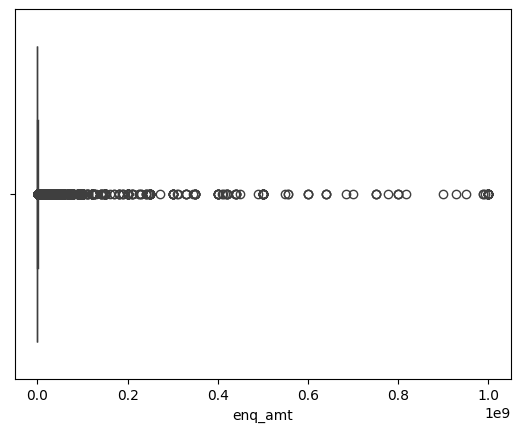

In [103]:
sns.boxplot(x='enq_amt',data=cust_enquiry)

In [104]:
## using IQR to remove the outliers
IQR = stats.iqr(cust_enquiry['enq_amt'], interpolation = 'midpoint') 

IQR

110000.0

In [105]:
# Calculate the IQR for the 'enq_amt' column
Q1 = cust_enquiry['enq_amt'].quantile(0.25)
Q3 = cust_enquiry['enq_amt'].quantile(0.75)
IQR = Q3 - Q1

# Define the upper and lower bounds for capping
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Cap the outliers in 'enq_amt' column
cust_enquiry['enq_amt'] = cust_enquiry['enq_amt'].clip(lower=lower_bound, upper=upper_bound)

# Check the updated column
print(cust_enquiry['enq_amt'].describe())


count    399361.000000
mean      91596.073234
std      103395.026652
min           1.000000
25%       10000.000000
50%       50000.000000
75%      120000.000000
max      285000.000000
Name: enq_amt, dtype: float64


<Axes: xlabel='enq_amt'>

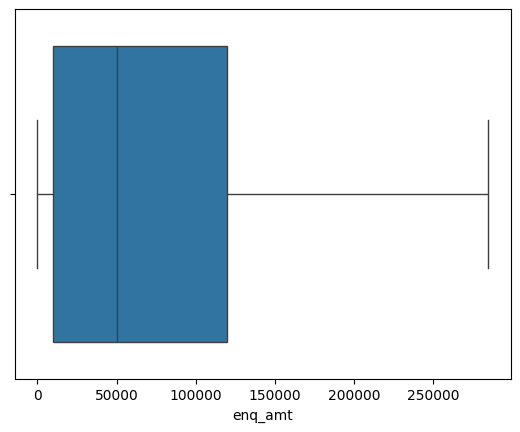

In [106]:
sns.boxplot(x='enq_amt',data=cust_enquiry)

In [107]:
# Step 1: Check for duplicates in customer_no
print(cust_account['customer_no'].duplicated().sum())
print(cust_demographics['customer_no'].duplicated().sum())
print(cust_enquiry['customer_no'].duplicated().sum())

162433
0
375465


## Deduplication of cust_account

In [108]:
# Drop duplicate customer_no, keeping the first occurrence
cust_account_dedup = cust_account.drop_duplicates(subset='customer_no', keep='first')
print("After deduplication (cust_account):", cust_account_dedup.shape)

After deduplication (cust_account): (23896, 40)


## Aggregation for cust_enquiry

In [109]:
cust_enquiry_agg = cust_enquiry.groupby('customer_no').agg({
    'enq_purpose': 'count',  # Count of enquiries
    'enq_amt': 'mean'       # Average enquiry amount
}).reset_index()

cust_enquiry_agg.rename(columns={'enq_purpose': 'total_enquiries', 'enq_amt': 'avg_enq_amt'}, inplace=True)

In [110]:
print(cust_account_dedup['customer_no'].duplicated().sum())
print(cust_demographics['customer_no'].duplicated().sum())
print(cust_enquiry_agg['customer_no'].duplicated().sum())

0
0
0


In [111]:
print(cust_account_dedup['customer_no'].dtype)
print(cust_demographics['customer_no'].dtype)
print(cust_enquiry_agg['customer_no'].dtype)

int32
int32
object


In [112]:
cust_enquiry_agg['customer_no'] = cust_enquiry_agg['customer_no'].astype(int)

## Mergging the 3 datasets

In [113]:
# Merge deduplicated/aggregated datasets
merged_data = pd.merge(cust_account_dedup, cust_demographics, on='customer_no', how='inner')
final_data = pd.merge(merged_data, cust_enquiry_agg, on='customer_no', how='inner')

print("Shape of final merged dataset:", final_data.shape)

Shape of final merged dataset: (23895, 132)


In [114]:
print(final_data.isnull().sum())

dt_opened_x            0
customer_no            0
upload_dt              0
acct_type              0
owner_indic            0
opened_dt              0
last_paymt_dt          0
reporting_dt           0
high_credit_amt        0
cur_balance_amt        0
paymenthistory1        0
paymenthistory2        0
paymt_str_dt           0
paymt_end_dt           0
creditlimit            0
cashlimit              0
rateofinterest         0
paymentfrequency       0
actualpaymentamount    0
dt_opened_year_x       0
dt_opened_month_x      0
dt_opened_day          0
upload_dt_year         0
upload_dt_month        0
upload_dt_day          0
opened_dt_year         0
opened_dt_month        0
opened_dt_day          0
last_paymt_dt_year     0
last_paymt_dt_month    0
last_paymt_dt_day      0
reporting_dt_year      0
reporting_dt_month     0
reporting_dt_day       0
paymt_str_dt_year      0
paymt_str_dt_month     0
paymt_str_dt_day       0
paymt_end_dt_year      0
paymt_end_dt_month     0
paymt_end_dt_day       0


In [115]:
final_data.head()

,dt_opened_x,customer_no,upload_dt,acct_type,owner_indic,opened_dt,last_paymt_dt,reporting_dt,high_credit_amt,cur_balance_amt,paymenthistory1,paymenthistory2,paymt_str_dt,paymt_end_dt,creditlimit,cashlimit,rateofinterest,paymentfrequency,actualpaymentamount,dt_opened_year_x,dt_opened_month_x,dt_opened_day,upload_dt_year,upload_dt_month,upload_dt_day,opened_dt_year,opened_dt_month,opened_dt_day,last_paymt_dt_year,last_paymt_dt_month,last_paymt_dt_day,reporting_dt_year,reporting_dt_month,reporting_dt_day,paymt_str_dt_year,paymt_str_dt_month,paymt_str_dt_day,paymt_end_dt_year,paymt_end_dt_month,paymt_end_dt_day,dt_opened_y,entry_time,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_77,feature_78,feature_79,Bad_label,dt_opened_year_y,dt_opened_month_y,entry_time_year,entry_time_month,feature_2_year,feature_2_month,feature_21_year,feature_21_month,total_enquiries,avg_enq_amt
0,2015-11-10,2519,2015-10-20,27,0,2013-06-09,2014-06-30,2015-09-30,20900.0,0,15698,0,2015-09-01,2014-07-01,60000,12500,37.8,0,7590,2015,11,10,2015,10,20,2013,6,9,2014,6,30,2015,9,30,2015,9,1,2014,7,1,2015-11-10,2015-10-15,5,2015-10-15,74,3,1,1,419,0,0,0,2,11,0,0,304,361,0,0,1,5383,1984-06-15,752,1,197,1,1,7,43,59,43,1,3,2,1,1814,7,8,4510,12,2,7,1,29,119,0,3,5495,0,0,1,0,1,0,1,1,1,0,1,2,1,0,2,366,1,55,59,1,1,1814,1,3,2,0,0,1,1,711,1,1,1,2015,11,2015,10,2015,10,1984.0,6,9,59558.888889
1,2015-07-20,6231,2015-07-09,2,0,2006-01-13,2015-03-05,2009-01-31,93473.0,0,14004,0,2007-07-01,2006-02-01,60000,12500,37.8,0,7590,2015,7,20,2015,7,9,2006,1,13,2015,3,5,2009,1,31,2007,7,1,2006,2,1,2015-07-20,2015-07-06,4,2015-07-06,78,3,1,1,35,0,0,0,2,8,6,2,323,428,0,0,1,2275,1980-06-20,752,1,623,1,4,9,19,101,46,1,5,2,1,4,7,2,2020,16,2,5,1,22,105,3849,3,2429,26,0,1,0,1,0,1,1,3,0,1,2,1,0,2,402,4,174,101,1,1,4,1,3,2,0,0,1,1,3123,1,1,1,2015,7,2015,7,2015,7,1980.0,6,2,50000.500000
2,2015-11-02,1938,2015-10-13,2,0,2015-08-27,2015-03-05,2015-08-31,45223.5,0,0,0,2015-08-01,2015-08-01,60000,12500,37.8,0,7590,2015,11,2,2015,10,13,2015,8,27,2015,3,5,2015,8,31,2015,8,1,2015,8,1,2015-11-02,2015-10-10,5,2015-10-10,137,3,1,1,475,0,0,0,2,11,0,0,323,429,0,0,2,5364,1987-10-07,2846,1,658,1,1,6,43,73,24,1,3,2,1,1,7,8,894,12,2,3,1,48,67,0,3,5476,0,0,2,4,1,0,1,3,1,0,1,2,1,0,2,173,1,55,73,1,1,1,1,1,1,0,0,1,1,3123,1,1,0,2015,11,2015,10,2015,10,1987.0,10,12,43595.833333
3,2015-11-16,2645,2015-07-30,2,0,2007-08-24,2011-02-28,2015-05-31,195074.0,0,12766,11911,2014-01-01,2011-02-01,60000,12500,37.8,2,7590,2015,11,16,2015,7,30,2007,8,24,2011,2,28,2015,5,31,2014,1,1,2011,2,1,2015-11-16,2015-07-27,5,2015-07-27,148,1,1,1,49,0,0,0,2,11,0,1,262,174,183,0,1,2930,1975-10-29,2530,2,621,1,1,3,13,776,13,1,3,2,2,3188,0,0,0,1,1,1,1,14,786,0,3,3070,0,0,1,0,1,0,1,1,9,0,1,2,1,0,2,56,19,33,2066,1,2,3188,131,9,1,0,0,1,1,2424,1,1,0,2015,11,2015,7,2015,7,1975.0,10,20,96500.000000
4,2015-08-27,8606,2015-08-10,2,0,2014-08-22,2015-06-25,2015-07-11,15702.0,15183,10,0,2015-07-01,2014-09-01,60000,12500,37.8,2,7590,2015,8,27,2015,8,10,2014,8,22,2015,6,25,2015,7,11,2015,7,1,2014,9,1,2015-08-27,2015-08-06,4,2015-08-06,131,3,1,1,62,0,0,0,2,8,6,2,302,127,0,0,1,4889,1980-08-22,2846,1,197,1,1,6,43,67,17,1,4,1,1,1,8,2,248,8,2,3,2,49,173,0,3,5009,0,0,2,10,38,29,1,1,1,0,1,2,

# Scaling

In [116]:
numerical_columns = final_data.select_dtypes(include=['int64', 'float64']).columns
print(numerical_columns)

Index(['high_credit_amt', 'cur_balance_amt', 'creditlimit', 'cashlimit',
       'rateofinterest', 'actualpaymentamount', 'feature_21_year',
       'total_enquiries', 'avg_enq_amt'],
      dtype='object')


In [117]:
from sklearn.preprocessing import StandardScaler

# Initialize the StandardScaler
scaler = StandardScaler()

# List of numerical columns to scale
numerical_columns = ['high_credit_amt', 'cur_balance_amt', 'creditlimit', 'cashlimit',
                     'rateofinterest', 'actualpaymentamount', 'feature_21_year',
                     'total_enquiries', 'avg_enq_amt']

# Apply StandardScaler to the numerical columns
final_data[numerical_columns] = scaler.fit_transform(final_data[numerical_columns])

# Verify the scaling by checking the mean and std of the scaled columns
print(final_data[numerical_columns].mean())
print(final_data[numerical_columns].std())

high_credit_amt       -1.008052e-16
cur_balance_amt       -1.709822e-17
creditlimit            0.000000e+00
cashlimit              0.000000e+00
rateofinterest         0.000000e+00
actualpaymentamount    0.000000e+00
feature_21_year       -3.588546e-15
total_enquiries        1.164166e-16
avg_enq_amt           -5.144335e-17
dtype: float64
high_credit_amt        1.000021
cur_balance_amt        1.000021
creditlimit            0.000000
cashlimit              0.000000
rateofinterest         0.000000
actualpaymentamount    0.000000
feature_21_year        1.000021
total_enquiries        1.000021
avg_enq_amt            1.000021
dtype: float64


#### The results show that your numerical columns have been successfully scaled, with most columns now having a mean close to 0 and a standard deviation close to 1, except for creditlimit, cashlimit, rateofinterest, actualpaymentamount, and feature_21_year, which have 0 standard deviation. This suggests that the values in these columns may be constant or not vary across samples, which could indicate a lack of useful variance for modeling.

#### For columns with 0 standard deviation (like creditlimit, cashlimit, rateofinterest, actualpaymentamount), we may consider dropping them since they don't provide useful information to the model.

# Feature Engineering

In [118]:
# Drop the datetime columns
datetime_columns = [
    'dt_opened_x', 'dt_opened_y', 'upload_dt', 'opened_dt', 'last_paymt_dt', 
    'reporting_dt', 'paymt_str_dt', 'paymt_end_dt', 'entry_time', 
    'feature_2', 'feature_21'
]

# Drop columns containing extracted datetime features if they are redundant
datetime_extracted_columns = [
    'dt_opened_year_x', 'dt_opened_month_x', 'dt_opened_day',
    'upload_dt_year', 'upload_dt_month', 'upload_dt_day',
    'opened_dt_year', 'opened_dt_month', 'opened_dt_day',
    'last_paymt_dt_year', 'last_paymt_dt_month', 'last_paymt_dt_day',
    'reporting_dt_year', 'reporting_dt_month', 'reporting_dt_day',
    'paymt_str_dt_year', 'paymt_str_dt_month', 'paymt_str_dt_day',
    'paymt_end_dt_year', 'paymt_end_dt_month', 'paymt_end_dt_day',
    'entry_time_year', 'entry_time_month', 'feature_2_year', 'feature_2_month', 
    'feature_21_year', 'feature_21_month'
]

# Combine all columns to drop (excluding the target column)
columns_to_drop = datetime_columns + datetime_extracted_columns

# Drop the columns from the dataframe
final_data_cleaned = final_data.drop(columns=columns_to_drop)

# Drop columns with little or no variance
final_data_cleaned = final_data_cleaned.drop(columns=['creditlimit', 'cashlimit', 'rateofinterest', 'actualpaymentamount'])

# Check the final dataframe after dropping columns
final_data_cleaned.head()

,customer_no,acct_type,owner_indic,high_credit_amt,cur_balance_amt,paymenthistory1,paymenthistory2,paymentfrequency,feature_1,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_77,feature_78,feature_79,Bad_label,dt_opened_year_y,dt_opened_month_y,total_enquiries,avg_enq_amt
0,2519,27,0,-0.692356,-1.006286,15698,0,0,5,74,3,1,1,419,0,0,0,2,11,0,0,304,361,0,0,1,5383,752,1,197,1,1,7,43,59,43,1,3,2,1,1814,7,8,4510,12,2,7,1,29,119,0,3,5495,0,0,1,0,1,0,1,1,1,0,1,2,1,0,2,366,1,55,59,1,1,1814,1,3,2,0,0,1,1,711,1,1,1,2015,11,-0.544182,-0.410834
1,6231,2,0,0.334061,-1.006286,14004,0,0,4,78,3,1,1,35,0,0,0,2,8,6,2,323,428,0,0,1,2275,752,1,623,1,4,9,19,101,46,1,5,2,1,4,7,2,2020,16,2,5,1,22,105,3849,3,2429,26,0,1,0,1,0,1,1,3,0,1,2,1,0,2,402,4,174,101,1,1,4,1,3,2,0,0,1,1,3123,1,1,1,2015,7,-1.038092,-0.612807
2,1938,2,0,-0.348343,-1.006286,0,0,0,5,137,3,1,1,475,0,0,0,2,11,0,0,323,429,0,0,2,5364,2846,1,658,1,1,6,43,73,24,1,3,2,1,1,7,8,894,12,2,3,1,48,67,0,3,5476,0,0,2,4,1,0,1,3,1,0,1,2,1,0,2,173,1,55,73,1,1,1,1,1,1,0,0,1,1,3123,1,1,0,2015,11,-0.332507,-0.748141
3,2645,2,0,1.771028,-1.006286,12766,11911,2,5,148,1,1,1,49,0,0,0,2,11,0,1,262,174,183,0,1,2930,2530,2,621,1,1,3,13,776,13,1,3,2,2,3188,0,0,0,1,1,1,1,14,786,0,3,3070,0,0,1,0,1,0,1,1,9,0,1,2,1,0,2,56,19,33,2066,1,2,3188,131,9,1,0,0,1,1,2424,1,1,0,2015,11,0.231962,0.369750
4,8606,2,0,-0.765873,-0.303596,10,0,2,4,131,3,1,1,62,0,0,0,2,8,6,2,302,127,0,0,1,4889,2846,1,197,1,1,6,43,67,17,1,4,1,1,1,8,2,248,8,2,3,2,49,173,0,3,5009,0,0,2,10,38,29,1,1,1,0,1,2,1,0,2,86,1,55,94,2,1,1,1,10,1,0,0,1,1,2732,1,1,0,2015,8,-0.685300,2.768062


In [119]:
# Add 'customer_no' to the columns you want to drop
columns_to_drop.append('customer_no')

# Drop the columns from the dataframe
final_data_cleaned = final_data.drop(columns=columns_to_drop)

# Check the final dataframe after dropping columns
final_data_cleaned.head()

,acct_type,owner_indic,high_credit_amt,cur_balance_amt,paymenthistory1,paymenthistory2,creditlimit,cashlimit,rateofinterest,paymentfrequency,actualpaymentamount,feature_1,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_77,feature_78,feature_79,Bad_label,dt_opened_year_y,dt_opened_month_y,total_enquiries,avg_enq_amt
0,27,0,-0.692356,-1.006286,15698,0,0.0,0.0,0.0,0,0.0,5,74,3,1,1,419,0,0,0,2,11,0,0,304,361,0,0,1,5383,752,1,197,1,1,7,43,59,43,1,3,2,1,1814,7,8,4510,12,2,7,1,29,119,0,3,5495,0,0,1,0,1,0,1,1,1,0,1,2,1,0,2,366,1,55,59,1,1,1814,1,3,2,0,0,1,1,711,1,1,1,2015,11,-0.544182,-0.410834
1,2,0,0.334061,-1.006286,14004,0,0.0,0.0,0.0,0,0.0,4,78,3,1,1,35,0,0,0,2,8,6,2,323,428,0,0,1,2275,752,1,623,1,4,9,19,101,46,1,5,2,1,4,7,2,2020,16,2,5,1,22,105,3849,3,2429,26,0,1,0,1,0,1,1,3,0,1,2,1,0,2,402,4,174,101,1,1,4,1,3,2,0,0,1,1,3123,1,1,1,2015,7,-1.038092,-0.612807
2,2,0,-0.348343,-1.006286,0,0,0.0,0.0,0.0,0,0.0,5,137,3,1,1,475,0,0,0,2,11,0,0,323,429,0,0,2,5364,2846,1,658,1,1,6,43,73,24,1,3,2,1,1,7,8,894,12,2,3,1,48,67,0,3,5476,0,0,2,4,1,0,1,3,1,0,1,2,1,0,2,173,1,55,73,1,1,1,1,1,1,0,0,1,1,3123,1,1,0,2015,11,-0.332507,-0.748141
3,2,0,1.771028,-1.006286,12766,11911,0.0,0.0,0.0,2,0.0,5,148,1,1,1,49,0,0,0,2,11,0,1,262,174,183,0,1,2930,2530,2,621,1,1,3,13,776,13,1,3,2,2,3188,0,0,0,1,1,1,1,14,786,0,3,3070,0,0,1,0,1,0,1,1,9,0,1,2,1,0,2,56,19,33,2066,1,2,3188,131,9,1,0,0,1,1,2424,1,1,0,2015,11,0.231962,0.369750
4,2,0,-0.765873,-0.303596,10,0,0.0,0.0,0.0,2,0.0,4,131,3,1,1,62,0,0,0,2,8,6,2,302,127,0,0,1,4889,2846,1,197,1,1,6,43,67,17,1,4,1,1,1,8,2,248,8,2,3,2,49,173,0,3,5009,0,0,2,10,38,29,1,1,1,0,1,2,1,0,2,86,1,55,94,2,1,1,1,10,1,0,0,1,1,2732,1,1,0,2015,8,-0.685300,2.768062


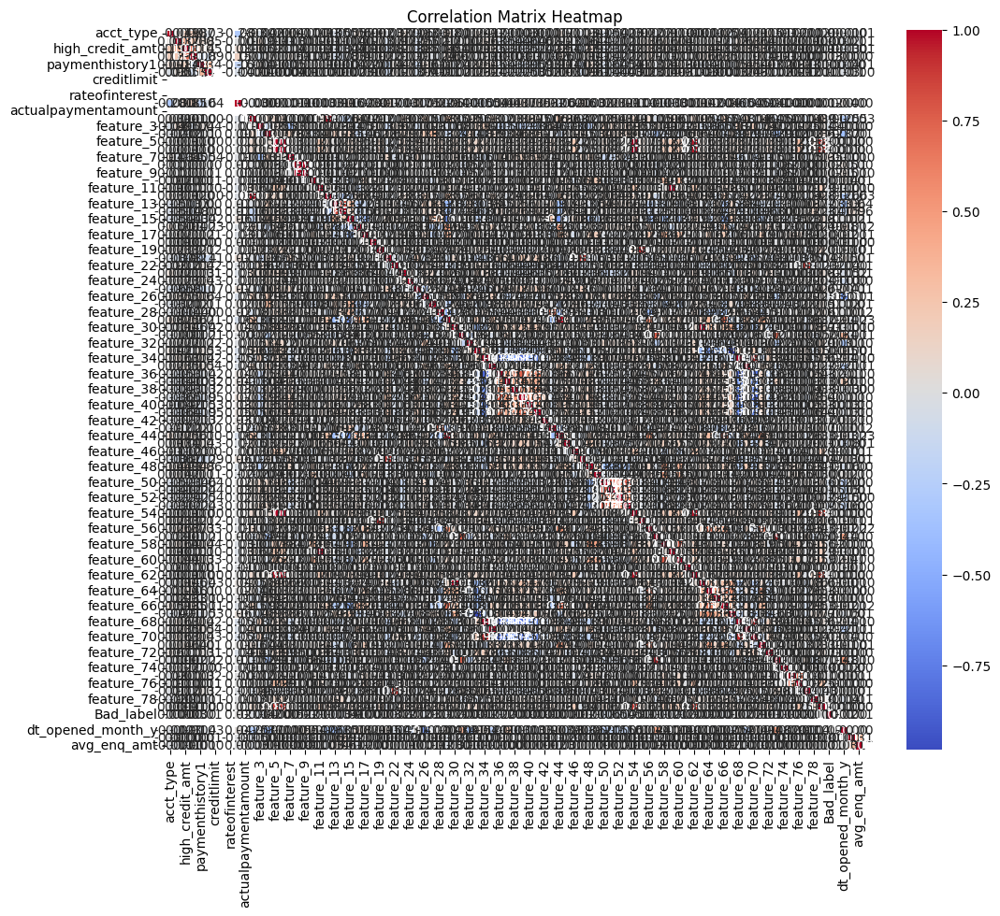

In [120]:
import seaborn as sns
import matplotlib.pyplot as plt

# Compute the correlation matrix
corr_matrix = final_data_cleaned.corr()

# Plot the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix Heatmap')
plt.show()

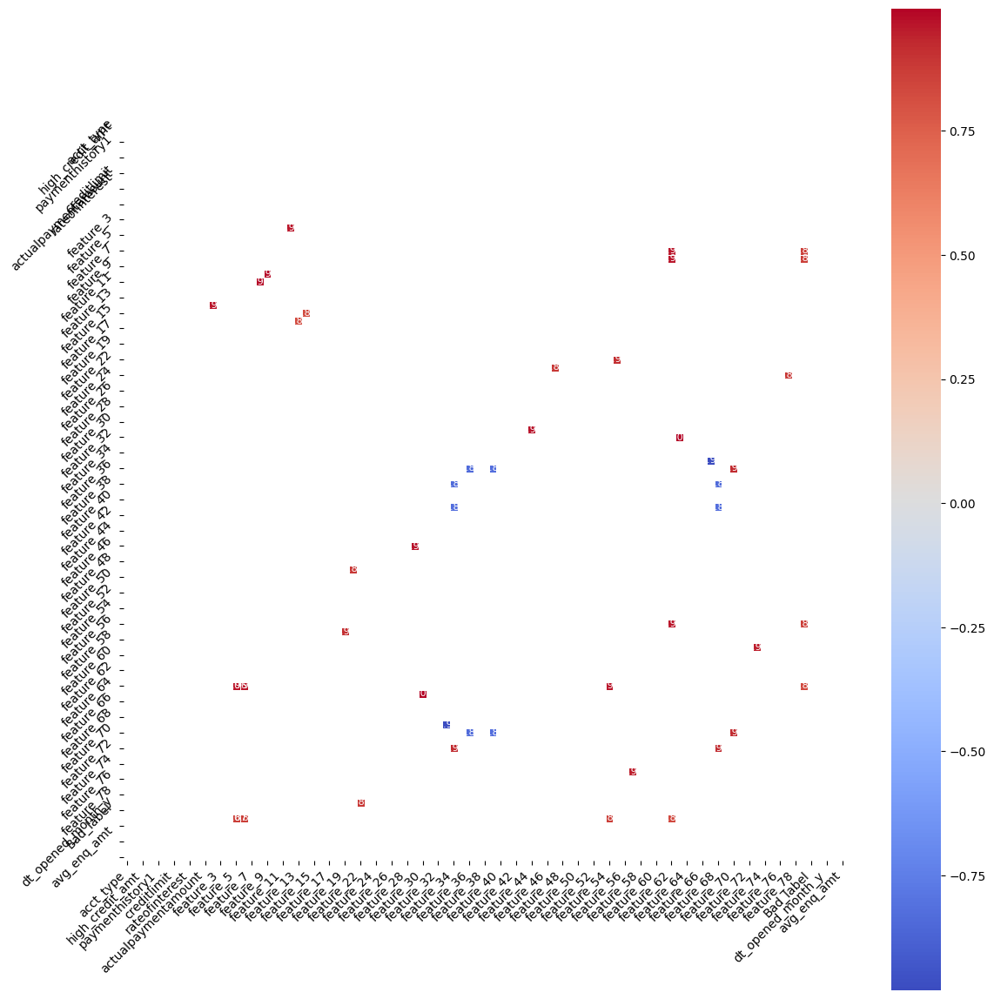

In [121]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate correlation matrix
corr_matrix = final_data_cleaned.corr()

# Set the correlation threshold
threshold = 0.8

# Mask correlations below the threshold
corr_matrix_filtered = corr_matrix[(corr_matrix.abs() >= threshold) & (corr_matrix != 1.0)]

# Set the size of the heatmap
plt.figure(figsize=(12, 12))

# Generate the heatmap
sns.heatmap(corr_matrix_filtered, annot=True, cmap='coolwarm', fmt='.2f', cbar=True, 
            square=True, linewidths=0.5, annot_kws={'size': 8}, mask=corr_matrix_filtered.isnull())

# Rotate x and y labels for better readability
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=45, ha='right')

# Show the plot
plt.tight_layout()
plt.show()

In [122]:
import pandas as pd

# Calculate the correlation matrix
corr_matrix = final_data_cleaned.corr()

# Set the threshold for highly correlated features
threshold = 0.8

# Get the pairs of features with correlation greater than the threshold
high_corr_pairs = []

for column in corr_matrix.columns:
    for row in corr_matrix.index:
        if column != row and abs(corr_matrix.loc[row, column]) > threshold:
            high_corr_pairs.append((row, column, corr_matrix.loc[row, column]))

# Convert to DataFrame for better readability
high_corr_df = pd.DataFrame(high_corr_pairs, columns=['Feature 1', 'Feature 2', 'Correlation'])
high_corr_df = high_corr_df.sort_values(by='Correlation', ascending=False)

# Display the highly correlated pairs
print(high_corr_df)

     Feature 1   Feature 2  Correlation
49  feature_35  feature_69     1.000000
2   feature_54   feature_5     1.000000
38  feature_11  feature_59     1.000000
33   feature_6  feature_54     1.000000
5    feature_5   feature_6     1.000000
6   feature_54   feature_6     1.000000
32   feature_5  feature_54     1.000000
45  feature_34  feature_68     1.000000
23  feature_68  feature_34     1.000000
25  feature_69  feature_35     1.000000
11  feature_59  feature_11     1.000000
1    feature_6   feature_5     1.000000
43  feature_30  feature_63     0.996513
19  feature_63  feature_30     0.996513
10   feature_8   feature_9     0.985619
9    feature_9   feature_8     0.985619
18  feature_44  feature_29     0.972103
30  feature_29  feature_44     0.972103
0   feature_12   feature_1     0.962187
12   feature_1  feature_12     0.962187
34  feature_62  feature_54     0.960746
41  feature_54  feature_62     0.960746
40   feature_6  feature_62     0.960746
39   feature_5  feature_62     0.960746


In [123]:
# List of features to drop based on the correlation matrix
features_to_drop = [
    'feature_69',  # Highly correlated with 'feature_35'
    'feature_5',   # Highly correlated with 'feature_54' and 'feature_6'
    'feature_59',  # Highly correlated with 'feature_11'
    'feature_34',  # Highly correlated with 'feature_68' and 'feature_39'
    'feature_68',  # Highly correlated with 'feature_34', 'feature_39', and 'feature_70'
    'feature_6',   # Highly correlated with 'feature_54', 'feature_5', 'feature_62'
    'feature_62',  # Highly correlated with 'feature_5', 'feature_54', 'feature_79'
    'feature_73',  # Highly correlated with 'feature_57'
    'feature_79',  # Highly correlated with 'feature_54', 'feature_5', 'feature_62'
    'feature_20',  # Highly correlated with 'feature_47'
    'feature_77',  # Highly correlated with 'feature_22'
    'feature_36',  # Highly correlated with 'feature_34', 'feature_68'
    'feature_33',  # Highly correlated with 'feature_67'
    'feature_67',  # Highly correlated with 'feature_33'
    'feature_1',   # Highly correlated with 'feature_12'
    'feature_12'   # Highly correlated with 'feature_1'
]

# Drop the selected features from the cleaned dataframe
final_data_cleaned = final_data_cleaned.drop(columns=features_to_drop)

# Check the cleaned dataframe after dropping columns
final_data_cleaned.head()

,acct_type,owner_indic,high_credit_amt,cur_balance_amt,paymenthistory1,paymenthistory2,creditlimit,cashlimit,rateofinterest,paymentfrequency,actualpaymentamount,feature_3,feature_4,feature_7,feature_8,feature_9,feature_10,feature_11,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_35,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_60,feature_61,feature_63,feature_64,feature_65,feature_66,feature_70,feature_71,feature_72,feature_74,feature_75,feature_76,feature_78,Bad_label,dt_opened_year_y,dt_opened_month_y,total_enquiries,avg_enq_amt
0,27,0,-0.692356,-1.006286,15698,0,0.0,0.0,0.0,0,0.0,74,3,419,0,0,0,2,0,0,304,361,0,0,1,752,1,197,1,1,7,43,59,43,1,3,1814,8,4510,12,2,7,1,29,119,0,3,5495,0,0,1,0,1,0,1,1,1,0,1,1,0,366,1,55,59,1,3,2,0,1,1,1,1,2015,11,-0.544182,-0.410834
1,2,0,0.334061,-1.006286,14004,0,0.0,0.0,0.0,0,0.0,78,3,35,0,0,0,2,6,2,323,428,0,0,1,752,1,623,1,4,9,19,101,46,1,5,4,2,2020,16,2,5,1,22,105,3849,3,2429,26,0,1,0,1,0,1,1,3,0,1,1,0,402,4,174,101,1,3,2,0,1,1,1,1,2015,7,-1.038092,-0.612807
2,2,0,-0.348343,-1.006286,0,0,0.0,0.0,0.0,0,0.0,137,3,475,0,0,0,2,0,0,323,429,0,0,2,2846,1,658,1,1,6,43,73,24,1,3,1,8,894,12,2,3,1,48,67,0,3,5476,0,0,2,4,1,0,1,3,1,0,1,1,0,173,1,55,73,1,1,1,0,1,1,1,0,2015,11,-0.332507,-0.748141
3,2,0,1.771028,-1.006286,12766,11911,0.0,0.0,0.0,2,0.0,148,1,49,0,0,0,2,0,1,262,174,183,0,1,2530,2,621,1,1,3,13,776,13,1,3,3188,0,0,1,1,1,1,14,786,0,3,3070,0,0,1,0,1,0,1,1,9,0,1,1,0,56,19,33,2066,131,9,1,0,1,1,1,0,2015,11,0.231962,0.369750
4,2,0,-0.765873,-0.303596,10,0,0.0,0.0,0.0,2,0.0,131,3,62,0,0,0,2,6,2,302,127,0,0,1,2846,1,197,1,1,6,43,67,17,1,4,1,2,248,8,2,3,2,49,173,0,3,5009,0,0,2,10,38,29,1,1,1,0,1,1,0,86,1,55,94,1,10,1,0,1,1,1,0,2015,8,-0.685300,2.768062


In [124]:
final_data_cleaned.shape

(23895, 77)

# Splitting the data

In [125]:
from sklearn.model_selection import train_test_split

X = final_data_cleaned.drop(columns=['Bad_label'])  # Features
y = final_data_cleaned['Bad_label']  # Target variable

# Split the data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Check the shape of the splits
print(f"Training data shape: {X_train.shape}, {y_train.shape}")
print(f"Testing data shape: {X_test.shape}, {y_test.shape}")

Training data shape: (19116, 76), (19116,)
Testing data shape: (4779, 76), (4779,)


# SMOTE

In [126]:
from imblearn.over_sampling import SMOTE
from collections import Counter

# Check the original class distribution
print(f"Original class distribution in y_train: {Counter(y_train)}")

# Apply SMOTE to the training set
smote = SMOTE(random_state=42)
X_train_res, y_train_res = smote.fit_resample(X_train, y_train)

# Check the class distribution after applying SMOTE
print(f"Class distribution after SMOTE: {Counter(y_train_res)}")

Original class distribution in y_train: Counter({0: 18316, 1: 800})
Class distribution after SMOTE: Counter({0: 18316, 1: 18316})


# Logistic Regression

In [114]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score
from sklearn.model_selection import cross_val_score

# Initialize the Logistic Regression model without max_iter
logreg = LogisticRegression(random_state=42)

# Fit the model on the resampled training data
logreg.fit(X_train_res, y_train_res)

# Make predictions on the test set
y_pred = logreg.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.4f}")

# Detailed classification report (precision, recall, F1-score)
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Confusion Matrix
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))

# AUC-ROC Score
y_pred_prob = logreg.predict_proba(X_test)[:, 1]  # Get the probabilities for the positive class
roc_auc = roc_auc_score(y_test, y_pred_prob)
print(f"\nAUC-ROC Score: {roc_auc:.4f}")

# Cross-validation score (optional)
cv_score = cross_val_score(logreg, X_train_res, y_train_res, cv=5, scoring='f1')
print(f"\nCross-Validation Accuracy Score: {cv_score.mean():.4f}")

Accuracy: 0.5817

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.58      0.73      4575
           1       0.06      0.60      0.11       204

    accuracy                           0.58      4779
   macro avg       0.52      0.59      0.42      4779
weighted avg       0.93      0.58      0.70      4779


Confusion Matrix:
[[2657 1918]
 [  81  123]]

AUC-ROC Score: 0.6065

Cross-Validation Accuracy Score: 0.6101


Key Points:
Precision and Recall for Class 1 (positive class):

Precision is very low for class 1 (0.06), indicating that when the model predicts a positive outcome (class 1), it is often wrong.
However, recall for class 1 is higher (0.60), meaning that the model is able to capture a substantial portion of the actual positives, but it's still not ideal.
Confusion Matrix:

The confusion matrix shows that the model is doing well in predicting class 0 (Negative), but it's struggling to correctly predict class 1 (Positive).
There are 1918 false positives and 81 false negatives, meaning that it’s incorrectly classifying a lot of negatives as positives.
AUC-ROC Score:

An AUC-ROC score of 0.6065 suggests that the model has some ability to distinguish between the classes, but there is still room for improvement.

## Hyperparameter Tuning

In [125]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, accuracy_score

# Hyperparameter grid for Logistic Regression
param_grid = {
    'C': [0.1,1],  # Regularization strength
    'penalty': ['l2'],  # Regularization type (l2 is standard for logistic regression)
    'solver': ['saga'],  # Solvers that work with l2 penalty
    'max_iter': [100]  # Maximum number of iterations
}

# Initialize Logistic Regression with class weights balanced
logreg = LogisticRegression(class_weight='balanced', random_state=42)

# Perform grid search with cross-validation (5-fold)
grid_search = GridSearchCV(estimator=logreg, param_grid=param_grid, cv=3, n_jobs=-1, scoring='f1', verbose=1)

# Fit the model
grid_search.fit(X_train_res, y_train_res)

# Get the best model from grid search
best_model = grid_search.best_estimator_

# Make predictions with the best model
y_pred = best_model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.4f}")

# Classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Confusion matrix
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))

# AUC-ROC Score
y_pred_prob = best_model.predict_proba(X_test)[:, 1]
roc_auc = roc_auc_score(y_test, y_pred_prob)
print(f"\nAUC-ROC Score: {roc_auc:.4f}")

# Cross-validation accuracy score
cross_val_accuracy = grid_search.best_score_
print(f"Cross-Validation Accuracy Score: {cross_val_accuracy:.4f}")

# Best hyperparameters
print(f"Best Hyperparameters: {grid_search.best_params_}")

Fitting 3 folds for each of 2 candidates, totalling 6 fits
Accuracy: 0.5830

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.58      0.73      4575
           1       0.06      0.58      0.11       204

    accuracy                           0.58      4779
   macro avg       0.51      0.58      0.42      4779
weighted avg       0.93      0.58      0.70      4779


Confusion Matrix:
[[2668 1907]
 [  86  118]]

AUC-ROC Score: 0.6057
Cross-Validation Accuracy Score: 0.6129
Best Hyperparameters: {'C': 0.1, 'max_iter': 100, 'penalty': 'l2', 'solver': 'saga'}


**It looks like  model is performing decently, with an accuracy of `0.5830`, though it has a high precision for class 0 but low precision and recall for class 1.**

### Key Insights:

* **High Precision for Class 0** : The model is able to classify the majority class (class 0) with very high precision (0.97). However, this can be misleading as it doesn't account for the misclassifications of class 1.

* **Low Precision and Recall for Class 1**: Class 1 (the minority class) has a very low precision (0.06) and recall (0.58). This indicates that the model is struggling to correctly identify class 1 instances and tends to misclassify them as class 0.

### Confusion Matrix:

* **True Negatives (2668)** and **False Positives (1907)** are high for class 0, indicating a lot of misclassification between the classes.

* **False Negatives (86)** and **True Positives (118)** are lower for class 1, indicating that while the model does identify some class 1 instances, it misses a lot of them.

* **AUC-ROC Score**: The AUC-ROC score is 0.6057, which is slightly above random guessing but still indicates room for improvement, especially for class 1.

* **Cross-Validation Accuracy Score**: The 0.6129 cross-validation accuracy indicates some variance between training and validation sets. This score is slightly higher than the test accuracy, suggesting potential overfitting on the training data.


# KNN Classifier

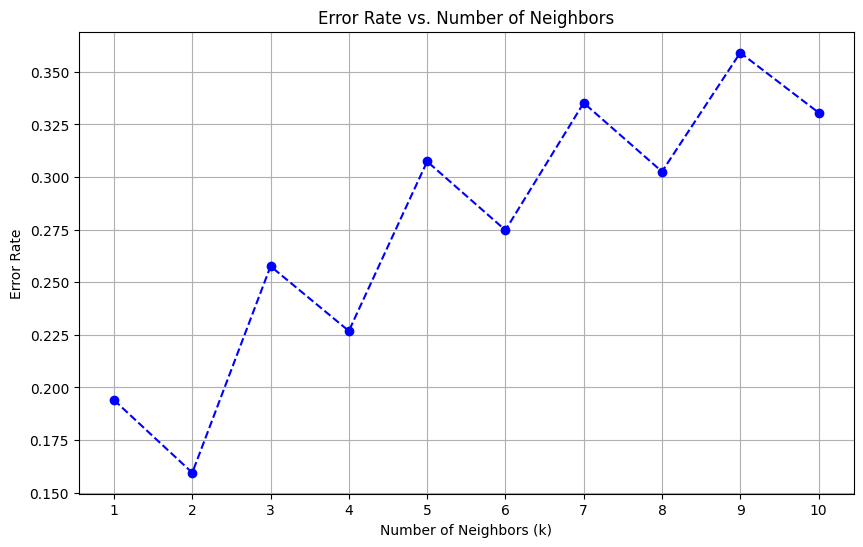

In [127]:
from sklearn.neighbors import KNeighborsClassifier
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt

# Apply SMOTE to balance the class distribution in the training set
smote = SMOTE(random_state=42)
X_train_res, y_train_res = smote.fit_resample(X_train, y_train)

# Initialize the scaler
scaler = StandardScaler()

# Fit and transform the training data, transform the test data
X_train_scaled = scaler.fit_transform(X_train_res)  # Apply scaling after SMOTE
X_test_scaled = scaler.transform(X_test)  # Apply scaling to the test set

# List to store error rates
error_rate = []

# Loop through different values of n_neighbors
for i in range(1, 11):  # Testing k values from 1 to 10
    knn = KNeighborsClassifier(n_neighbors=i)  # Initialize KNN with k=i
    knn.fit(X_train_scaled, y_train_res)  # Train the model with SMOTE data
    y_predict = knn.predict(X_test_scaled)  # Predict on the test data
    error_rate.append(np.mean(y_predict != y_test))  # Append error rate

# Plot the error rates to visualize
plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), error_rate, marker='o', linestyle='--', color='b')
plt.title('Error Rate vs. Number of Neighbors')
plt.xlabel('Number of Neighbors (k)')
plt.ylabel('Error Rate')
plt.xticks(range(1, 11))
plt.grid()
plt.show()

In [127]:
from sklearn.metrics import confusion_matrix , accuracy_score , recall_score,precision_score,f1_score,classification_report
# Initialize the KNN model with the best k value
knn = KNeighborsClassifier(n_neighbors=4)

# Fit the model on the training data (with SMOTE applied and scaled)
knn.fit(X_train_res, y_train_res)

# Make predictions on the test data (scaled)
y_pred_knn = knn.predict(X_test_scaled)

# Calculate the accuracy
accuracy = accuracy_score(y_test, y_pred_knn)

# Print the accuracy, classification report, and confusion matrix
print(f"Accuracy Score: {accuracy}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred_knn))
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred_knn))

Accuracy Score: 0.9573132454488387

Classification Report:
              precision    recall  f1-score   support

           0       0.96      1.00      0.98      4575
           1       0.00      0.00      0.00       204

    accuracy                           0.96      4779
   macro avg       0.48      0.50      0.49      4779
weighted avg       0.92      0.96      0.94      4779


Confusion Matrix:
[[4575    0]
 [ 204    0]]


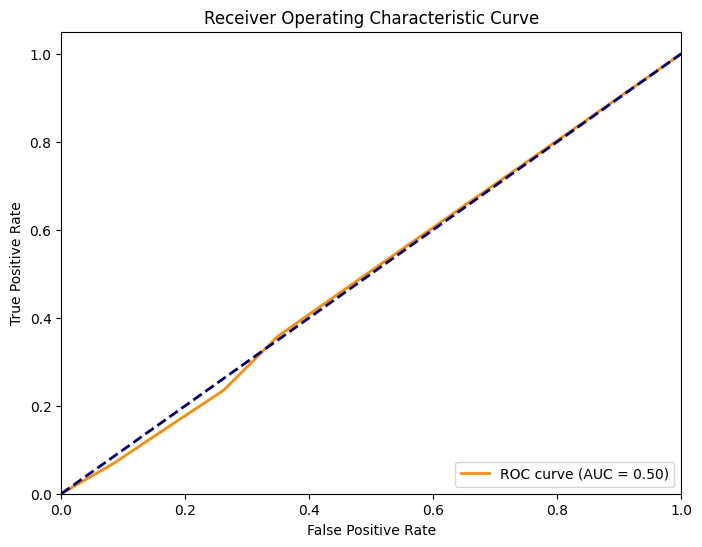

In [128]:
from sklearn.metrics import roc_curve, auc

y_prob = knn.predict_proba(X_test)[:, 1]  # Get the probability for class 1

# Calculate the false positive rate (fpr), true positive rate (tpr), and thresholds
fpr, tpr, thresholds = roc_curve(y_test, y_prob)

# Calculate AUC
roc_auc = auc(fpr, tpr)

# Plotting the ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')  # Diagonal line (no skill)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic Curve')
plt.legend(loc='lower right')
plt.show()

* Even though SMOTE was applied, the model's performance suggests that KNN struggles with the underlying imbalance in the test data.

* The model predicts the majority class for all instances, resulting in a flat ROC curve

* KNN's performance is heavily influenced by the class distribution in the local neighborhood. In an imbalanced dataset, this often results in poor performance for the minority class.

# SVM Classifier

In [131]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report, roc_auc_score, accuracy_score

# Initialize the SVM classifier
svm = SVC(probability=True, random_state=42)

# Fit the model on the training data
svm.fit(X_train_res, y_train_res)

# Make predictions on the test set
y_pred_svm = svm.predict(X_test_scaled)
y_pred_prob_svm = svm.predict_proba(X_test_scaled)[:, 1]

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred_svm)
print(f"Accuracy: {accuracy:.4f}")

print("\nClassification Report:")
print(classification_report(y_test, y_pred_svm))

print(f"\nAUC-ROC Score: {roc_auc_score(y_test, y_pred_prob_svm):.4f}")

Accuracy: 0.9573

Classification Report:
              precision    recall  f1-score   support

           0       0.96      1.00      0.98      4575
           1       0.00      0.00      0.00       204

    accuracy                           0.96      4779
   macro avg       0.48      0.50      0.49      4779
weighted avg       0.92      0.96      0.94      4779


AUC-ROC Score: 0.5859


# Decision Tree Classifier

In [122]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score, roc_auc_score, confusion_matrix

# Initialize the Decision Tree
dt = DecisionTreeClassifier(random_state=42)

# Fit the model
dt.fit(X_train_res, y_train_res)

# Predict on the test data
y_pred_dt = dt.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred_dt)
print(f"Accuracy: {accuracy:.4f}")

print("\nClassification Report:")
print(classification_report(y_test, y_pred_dt))

print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred_dt))

# AUC-ROC Score
y_pred_prob_dt = dt.predict_proba(X_test)[:, 1]
roc_auc = roc_auc_score(y_test, y_pred_prob_dt)
print(f"\nAUC-ROC Score: {roc_auc:.4f}")

Accuracy: 0.8860

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.92      0.94      4575
           1       0.08      0.16      0.11       204

    accuracy                           0.89      4779
   macro avg       0.52      0.54      0.52      4779
weighted avg       0.92      0.89      0.90      4779


Confusion Matrix:
[[4202  373]
 [ 172   32]]

AUC-ROC Score: 0.5377


## Hyperparameter Tuning

In [124]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, f1_score

# Define a small hyperparameter grid
param_grid = {
    'max_depth': [5,10],  # Controls the depth of the tree
    'min_samples_split': [10,20],  # Minimum samples required to split a node
    'min_samples_leaf': [5,10],  # Minimum samples at a leaf node
    'criterion': ['gini', 'entropy']  # Splitting criteria
}

# Initialize the Decision Tree Classifier
dt = DecisionTreeClassifier(random_state=42,class_weight='balanced')

# Perform GridSearchCV
grid_search = GridSearchCV(estimator=dt, param_grid=param_grid, cv=3, scoring='f1', n_jobs=-1, verbose=1)

# Fit the model on the training data
grid_search.fit(X_train_res, y_train_res)

# Get the best model
best_dt_model = grid_search.best_estimator_

# Make predictions on the test set
y_pred_dt_tuned = best_dt_model.predict(X_test)

# Evaluate the tuned model
print("Best Hyperparameters:", grid_search.best_params_)
print("F1-Score:", f1_score(y_test, y_pred_dt_tuned))
print("\nClassification Report:")
print(classification_report(y_test, y_pred_dt_tuned))
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred_dt_tuned))

# Calculate AUC-ROC Score
y_pred_prob_dt = best_dt_model.predict_proba(X_test)[:, 1]
roc_auc = roc_auc_score(y_test, y_pred_prob_dt)
print(f"\nAUC-ROC Score: {roc_auc:.4f}")

Fitting 3 folds for each of 16 candidates, totalling 48 fits
Best Hyperparameters: {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 5, 'min_samples_split': 10}
F1-Score: 0.10362694300518135

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.92      0.94      4575
           1       0.08      0.15      0.10       204

    accuracy                           0.89      4779
   macro avg       0.52      0.54      0.52      4779
weighted avg       0.92      0.89      0.91      4779


Confusion Matrix:
[[4230  345]
 [ 174   30]]

AUC-ROC Score: 0.5920


## Cross validation score

In [125]:
from sklearn.model_selection import cross_val_score

# Cross-validation with the best model
cv_scores = cross_val_score(estimator=best_dt_model, X=X_train_res, y=y_train_res, cv=3, scoring='roc_auc')

# Print cross-validation results
print(f"Cross-Validation AUC-ROC Scores: {cv_scores}")
print(f"Mean AUC-ROC Score: {cv_scores.mean():.4f}")

Cross-Validation AUC-ROC Scores: [0.9282509  0.96108407 0.96676417]
Mean AUC-ROC Score: 0.9520


# Random Forest Classifier

In [132]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, f1_score, roc_auc_score, accuracy_score

# Initialize the Random Forest Classifier
rf = RandomForestClassifier(class_weight='balanced', random_state=42)

# Fit the model on the training data
rf.fit(X_train_res, y_train_res)

# Make predictions on the test set
y_pred_rf = rf.predict(X_test_scaled)

# Evaluate the model
print(f"Accuracy Score: {accuracy_score(y_test, y_pred_rf)}")
print(f"F1-Score: {f1_score(y_test, y_pred_rf)}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred_rf))
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred_rf))

# Calculate AUC-ROC Score
y_pred_prob_rf = rf.predict_proba(X_test_scaled)[:, 1]
roc_auc = roc_auc_score(y_test, y_pred_prob_rf)
print(f"\nAUC-ROC Score: {roc_auc:.4f}")

Accuracy Score: 0.5206110064867127
F1-Score: 0.06907761072734661

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.53      0.68      4575
           1       0.04      0.42      0.07       204

    accuracy                           0.52      4779
   macro avg       0.50      0.47      0.37      4779
weighted avg       0.91      0.52      0.65      4779


Confusion Matrix:
[[2403 2172]
 [ 119   85]]

AUC-ROC Score: 0.4438


## Hyperparameter Tuning

In [137]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, accuracy_score

# Define the parameter grid for tuning
param_grid = {
    'n_estimators': [50],  # Number of trees in the forest
    'max_depth': [5,10],  # Maximum depth of each tree
    'min_samples_split': [1,2],  # Minimum samples required to split a node
    'min_samples_leaf': [1,5],  # Minimum samples required at a leaf node
    'criterion': ['gini', 'entropy'],  # Splitting criteria
}

# Initialize the Random Forest Classifier
rf = RandomForestClassifier(random_state=42)

# Perform GridSearchCV
grid_search_rf = GridSearchCV(estimator=rf, param_grid=param_grid, cv=3, scoring='f1', n_jobs=-1, verbose=1)

# Fit the model
grid_search_rf.fit(X_train_res, y_train_res)

# Best model after grid search
best_rf_model = grid_search_rf.best_estimator_

# Make predictions
y_pred_rf_tuned = best_rf_model.predict(X_test_scaled)

# Evaluate the tuned model
print(f"Best Hyperparameters: {grid_search_rf.best_params_}")
print(f"Accuracy Score: {accuracy_score(y_test, y_pred_rf_tuned):.4f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred_rf_tuned))

Fitting 3 folds for each of 16 candidates, totalling 48 fits
Best Hyperparameters: {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 50}
Accuracy Score: 0.2810

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.26      0.41      4575
           1       0.04      0.66      0.07       204

    accuracy                           0.28      4779
   macro avg       0.49      0.46      0.24      4779
weighted avg       0.91      0.28      0.40      4779



In [138]:
print(f"F1-Score: {f1_score(y_test, y_pred_rf_tuned)}")
print(f"AUC-ROC: {roc_auc_score(y_test, best_rf_model.predict_proba(X_test_scaled)[:, 1])}")

F1-Score: 0.07285483000539665
AUC-ROC: 0.45910050358941396


## Cross validation score

In [139]:
from sklearn.model_selection import cross_val_score
auc_scores = cross_val_score(rf, X_train_res, y_train_res, cv=3, scoring='roc_auc')
print("Cross-Validation AUC Scores:", auc_scores)
print("Mean AUC Score:", auc_scores.mean())

Cross-Validation AUC Scores: [0.98778309 0.99995897 0.99997218]
Mean AUC Score: 0.9959047440091662


# Bagging with Decision Tree

In [132]:
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score

# Initialize the Bagging Classifier with Decision Tree as the base estimator
bagging_dt = BaggingClassifier(
    base_estimator=DecisionTreeClassifier(),
    n_estimators=50,
    random_state=42,
    n_jobs=-1
)

# Fit the model
bagging_dt.fit(X_train_res, y_train_res)

# Make predictions
y_pred_bagging_dt = bagging_dt.predict(X_test_scaled)

# Evaluate the model
print(f"Accuracy Score: {accuracy_score(y_test, y_pred_bagging_dt):.4f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred_bagging_dt))

Accuracy Score: 0.3677

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.36      0.52      4575
           1       0.04      0.54      0.07       204

    accuracy                           0.37      4779
   macro avg       0.49      0.45      0.29      4779
weighted avg       0.91      0.37      0.50      4779



# Bagging with Logistic Regression

In [129]:
from sklearn.ensemble import BaggingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score

# Initialize the Bagging Classifier with Logistic Regression as the base estimator
bagging_lr = BaggingClassifier(
    base_estimator=LogisticRegression(max_iter=100, random_state=42),
    n_estimators=10,
    random_state=42,
    n_jobs=-1
)

# Fit the model
bagging_lr.fit(X_train_res, y_train_res)

# Make predictions
y_pred_bagging_lr = bagging_lr.predict(X_test_scaled)

# Evaluate the model
print(f"Accuracy Score: {accuracy_score(y_test, y_pred_bagging_lr):.4f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred_bagging_lr))

Accuracy Score: 0.6001

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.60      0.74      4575
           1       0.06      0.53      0.10       204

    accuracy                           0.60      4779
   macro avg       0.51      0.57      0.42      4779
weighted avg       0.93      0.60      0.72      4779



# Boosting with Decision Tree 

In [131]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score

# Initialize the AdaBoost Classifier with Decision Tree as the base estimator
boosting_dt = AdaBoostClassifier(
    base_estimator=DecisionTreeClassifier(max_depth=1, random_state=42),
    n_estimators=50,
    random_state=42
)

# Fit the model
boosting_dt.fit(X_train_res, y_train_res)

# Make predictions
y_pred_boosting_dt = boosting_dt.predict(X_test_scaled)

# Evaluate the model
print(f"Accuracy Score: {accuracy_score(y_test, y_pred_boosting_dt):.4f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred_boosting_dt))

Accuracy Score: 0.7123

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.74      0.83      4575
           1       0.03      0.18      0.05       204

    accuracy                           0.71      4779
   macro avg       0.49      0.46      0.44      4779
weighted avg       0.91      0.71      0.80      4779



# Boosting with Logistic Regresssion

In [134]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score

# Initialize the AdaBoost Classifier with Logistic Regression as the base estimator
boosting_lr = AdaBoostClassifier(
    base_estimator=LogisticRegression(max_iter=100, random_state=42),
    n_estimators=10,
    random_state=42
)

# Fit the model
boosting_lr.fit(X_train_res, y_train_res)

# Make predictions
y_pred_boosting_lr = boosting_lr.predict(X_test_scaled)

# Evaluate the model
print(f"Accuracy Score: {accuracy_score(y_test, y_pred_boosting_lr):.4f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred_boosting_lr))

Accuracy Score: 0.6436

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.65      0.78      4575
           1       0.06      0.46      0.10       204

    accuracy                           0.64      4779
   macro avg       0.51      0.55      0.44      4779
weighted avg       0.93      0.64      0.75      4779



# Boosting with random forest 

In [139]:
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score

# Initialize the Random Forest Classifier
rf = RandomForestClassifier(n_estimators=10, max_depth=3, random_state=42)

# Initialize the AdaBoost Classifier with Random Forest as the base estimator
boosting_rf = AdaBoostClassifier(
    base_estimator=rf,
    n_estimators=50,
    random_state=42
)

# Fit the model
boosting_rf.fit(X_train_res, y_train_res)

# Make predictions
y_pred_boosting_rf = boosting_rf.predict(X_test_scaled)

# Evaluate the model
print(f"Accuracy Score: {accuracy_score(y_test, y_pred_boosting_rf):.4f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred_boosting_rf))

Accuracy Score: 0.7912

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.82      0.88      4575
           1       0.03      0.12      0.05       204

    accuracy                           0.79      4779
   macro avg       0.49      0.47      0.46      4779
weighted avg       0.91      0.79      0.85      4779



# Boosting with XGBoost

In [146]:
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, accuracy_score

# Initialize the XGBoost Classifier
xgb = XGBClassifier(
    n_estimators=100,    # Number of boosting rounds
    max_depth=3,        # Maximum depth of each tree
    learning_rate=0.1,  # Step size shrinkage
    random_state=42
)

# Fit the model
xgb.fit(X_train_res, y_train_res)

# Make predictions
y_pred_xgb = xgb.predict(X_test_scaled)

# Evaluate the model
print(f"Accuracy Score: {accuracy_score(y_test, y_pred_xgb):.4f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred_xgb))

Accuracy Score: 0.4331

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.43      0.59      4575
           1       0.04      0.47      0.07       204

    accuracy                           0.43      4779
   macro avg       0.49      0.45      0.33      4779
weighted avg       0.91      0.43      0.57      4779



# Naive Bayes

In [147]:
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report, accuracy_score

# Initialize the Naive Bayes model
nb_model = GaussianNB()

# Train the model
nb_model.fit(X_train_res, y_train_res)

# Make predictions
y_pred_nb = nb_model.predict(X_test_scaled)

# Evaluate the model
print(f"Accuracy Score: {accuracy_score(y_test, y_pred_nb):.4f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred_nb))

Accuracy Score: 0.9561

Classification Report:
              precision    recall  f1-score   support

           0       0.96      1.00      0.98      4575
           1       0.00      0.00      0.00       204

    accuracy                           0.96      4779
   macro avg       0.48      0.50      0.49      4779
weighted avg       0.92      0.96      0.94      4779



In [148]:
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score

# Initialize the Naive Bayes model and parameter grid
nb = GaussianNB()
param_grid = {'var_smoothing': [1e-9, 1e-8, 1e-7]}

# Perform GridSearchCV
grid_search_nb = GridSearchCV(nb, param_grid, cv=3, n_jobs=-1)
grid_search_nb.fit(X_train_res, y_train_res)

# Make predictions and evaluate
y_pred = grid_search_nb.best_estimator_.predict(X_test_scaled)
print(f"Best Params: {grid_search_nb.best_params_}")
print(f"Accuracy: {accuracy_score(y_test, y_pred):.4f}")

Best Params: {'var_smoothing': 1e-09}
Accuracy: 0.9561


In [149]:
from sklearn.model_selection import cross_val_score
from sklearn.naive_bayes import GaussianNB

# Initialize Naive Bayes model
nb = GaussianNB(var_smoothing=1e-09)

# Perform cross-validation
cv_scores = cross_val_score(nb, X_train_res, y_train_res, cv=5, scoring='accuracy')

# Print cross-validation results
print("Cross-Validation Scores:", cv_scores)
print("Mean Cross-Validation Score:", cv_scores.mean())

Cross-Validation Scores: [0.68104272 0.72512625 0.72331422 0.72754573 0.71799072]
Mean Cross-Validation Score: 0.7150039265912065


# MODEL CAMPARISON

## Logistic Regression:
- **Accuracy**: ~58.3%
- **Issues**: Very low precision and recall for class 1.
- **Slight improvement with hyperparameter tuning**.

## K-Nearest Neighbors (KNN):
- **Accuracy**: ~95.7%
- **Issue**: Fails to predict minority class (1); precision and recall are zero for class 1.

## Support Vector Machine (SVM):
- **Accuracy**: ~95.7%
- **Issue**: Similar to KNN; does not handle class imbalance well.

## Decision Tree:
- **Accuracy**: ~88.6% (baseline), ~89% (after tuning).
- **Issue**: Poor recall and precision for class 1.

## Random Forest:
- **Accuracy**: Poor (~52%) in the baseline and drops further after tuning.
- **Issue**: Fails to handle class imbalance effectively.

## Bagging:
- **Bagging with Logistic Regression performed better (~60% accuracy) than Bagging with Decision Tree (~36.7%)**.

## Boosting:
- **Boosting with Random Forest (79.1%) and Decision Tree (71.2%) showed better performance.**
- **Boosting with Logistic Regression and XGBoost performed poorly (~64.3% and ~43.3%, respectively).**

## Naive Bayes:
- **Accuracy**: ~95.6%.
- **Issue**: Like KNN and SVM, it fails to predict class 1.

### Boosting with Random Forest is the most suitable choice. It achieves a balance of higher accuracy (79.12%), better handling of class imbalance compared to others, and a relatively improved classification performance for the minority class.

### Other models like Logistic Regression and SVM fail to predict the minority class effectively, while boosting techniques improve overall performance.

# CHALLENGES FACED REPORT

## Handling Imbalanced Dataset:
- The target variable was imbalanced, leading to models predicting only the majority class. Techniques like oversampling or using class-weighted algorithms were crucial to address this issue.

## Poor Performance of Baseline Models:
- Initial models like Logistic Regression and SVM failed to predict the minority class effectively, highlighting the limitations of simple models in handling imbalanced datasets.

## Choosing the Best Model:
- With multiple models implemented, selecting the most suitable one based on metrics like accuracy, F1-score, and recall for the minority class required careful analysis.

## Feature Engineering:
- Identifying the most relevant features and ensuring that no crucial information was lost during preprocessing was a time-consuming process.

## Hyperparameter Tuning:
- Fine-tuning model parameters, especially for complex models like Random Forest and boosting techniques, was challenging and required significant computational resources.

## Cross-Validation:
- Ensuring the robustness of results across different data splits demanded careful implementation of cross-validation techniques to avoid overfitting.

## Interpretability of Models:
- Balancing model performance with interpretability was difficult, as boosting techniques often outperform simpler models but are harder to explain to non-technical stakeholders.

## Computational Complexity:
- Training advanced models like boosted Random Forests was computationally intensive, especially during hyperparameter optimization.

# LIMITATIONS

## Dependence on Data Quality:
- The results heavily depend on the quality and completeness of the input data. Missing or erroneous entries could lead to biased model predictions.

## Feature Selection Bias:
- The selected features may not fully capture all the factors affecting the target variable, potentially leading to suboptimal predictions.

## Imbalanced Dataset Issues:
- While techniques like oversampling or class weighting were applied, handling imbalanced datasets remains a challenge, and the model might still struggle with edge cases.

## Lack of Real-Time Data:
- The model was trained on static historical data and does not account for real-time changes or trends, which could reduce its effectiveness in dynamic scenarios.

## Scalability Concerns:
- Advanced models like Random Forest or boosting algorithms may not scale well with larger datasets, leading to longer training times and higher computational requirements.

## Overfitting Risk:
- Despite using techniques like cross-validation and regularization, there is always a risk that the model might overfit the training data, impacting its generalizability.

## Limited Interpretability:
- Complex models like XGBoost or Gradient Boosting Machines are often considered black-box models, making it challenging to explain predictions to non-technical stakeholders.

## Dependency on Feature Engineering:
- The success of the model relies heavily on effective feature engineering, which may not always capture the true relationships in the data.

## Class Imbalance Impact on Metrics:
- Metrics like accuracy can be misleading in imbalanced datasets, and reliance on metrics such as F1-score and precision-recall requires careful interpretation.

## Domain Expertise Dependency:
- Lack of sufficient domain knowledge could limit the effectiveness of feature selection, data preprocessing, and the overall interpretability of the results.

## Dynamic Thresholding Limitations:
- Models relying on a single probability threshold for classification may fail to perform optimally across different datasets or changing conditions.

## Evaluation on Limited Data Splits:
- Although cross-validation was used, evaluating the model on a limited number of splits might not fully represent its performance on unseen data.

## Ethical and Bias Concerns:
- There may be latent biases in the dataset, which, if unaddressed, could propagate through the model and lead to unfair or unethical decisions.

## Inability to Capture External Factors:
- External influences, such as economic conditions or policy changes, are not included in the dataset, which might limit the applicability of the model in real-world scenarios.